In [2]:
import nltk
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from nltk.probability import FreqDist
from nltk.corpus import stopwords
from sklearn.metrics import confusion_matrix
import seaborn as sns
from sklearn.naive_bayes import MultinomialNB
from sklearn import metrics
from sklearn.model_selection import train_test_split
from matplotlib import cm
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.naive_bayes import MultinomialNB
from tqdm import tqdm
from wordcloud import WordCloud
import twint
import nest_asyncio

nest_asyncio.apply()

nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Raizel\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Raizel\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Raizel\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [3]:
from nltk.tokenize import RegexpTokenizer
tokenizer = RegexpTokenizer(r'[a-zA-Z0-9]+')

https://github.com/twintproject/twin Twint is used to webscrape tweets about movies. For 15 movies, tweets will be scraped over the year of the movies release. My aim is to have around 5000 tweets after cleaning non English tweets from the dataframe. The last movie, Hocus Pocus, will have tweets collected from October 2019 until October 2020 even though the movie came out in 1993.

# Inception

In [5]:
#gather tweets from the movie Inception
c = twint.Config()
c.Search = "Inception"
c.Limit = 6000
c.Since = "2010-07-13" #released July 13, 2010
c.Until = "2011-07-13"
c.Pandas = True

# Uncommonet the following line to run
# twint.run.Search(c)

In [8]:
#convert data into a dataframe
df_1 = twint.storage.panda.Tweets_df
df_1.head()

,id,conversation_id,created_at,date,timezone,place,tweet,language,hashtags,cashtags,...,geo,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest
0,90570989376774144,90570989376774144,1.310429e+12,2011-07-11 19:59:41,-0500,,Who understands that Inception movie?,en,[],[],...,,,,,,[],,,,
1,90570938395004929,90570938395004929,1.310429e+12,2011-07-11 19:59:29,-0500,,Inception in my pants #improvefilmtitlesbyaddi...,en,[improvefilmtitlesbyaddinginmypants],[],...,,,,,,[],,,,
2,90570857965039616,90570857965039616,1.310429e+12,2011-07-11 19:59:09,-0500,,RT @ imNot_daFather #GreatHighMovie Inception,en,[greathighmovie],[],...,,,,,,[],,,,
3,90570801786531840,90570801786531840,1.310429e+12,2011-07-11 19:58:56,-0500,,Excellence in Cinema....INCEPTION,fr,[],[],...,,,,,,[],,,,
4,90570663047331841,90570663047331841,1.310429e+12,2011-07-11 19:58:23,-0500,,never saw inception,en,[],[],...,,,,,,[],,,,


In [9]:
# remove non-English tweets
df_1 = df_1[df_1['language'] == 'en']

In [10]:
#after removing non-English tweets the dataframe looses 900 tweets
df_1.shape

(5100, 38)

Uncomment and run the next cell to save df_1 dataframe

In [12]:
# df_1.to_csv('df_1.csv')

Uncomment and run the next cell to read df_1 back in

In [4]:
# df_1 = pd.read_csv('df_1.csv')

In [5]:
#isolating the tweets
tweets = df_1['tweet'].values
tweets

array(['Who understands that Inception movie?',
       'Inception in my pants #improvefilmtitlesbyaddinginmypants',
       'RT @ imNot_daFather #GreatHighMovie Inception', ...,
       'A ver "Inception" :D #TP',
       'Lady Austin was right 2 bail on Inception. I would have done better with  2 hr nap filled with dreams. My dreams just as visually great. LOL',
       "Inception is in IMDB's top 100 #itsdefinitely2011"], dtype=object)

In [6]:
#tokenizing each tweet
tokenized_tweets = []
for tweet in tweets:
    tokenized_tweets.append(tokenizer.tokenize(tweet.lower())) #making all tweets lowercase so no word is duplicated later on
    
print(tokenized_tweets)

[['who', 'understands', 'that', 'inception', 'movie'], ['inception', 'in', 'my', 'pants', 'improvefilmtitlesbyaddinginmypants'], ['rt', 'imnot', 'dafather', 'greathighmovie', 'inception'], ['never', 'saw', 'inception'], ['jck49erfan', 'cornholio3000', 'was', 'inception', 'the', 'one', 'where', 'leo', 'is', 'a', 'patient', 'and', 'the', 'ending', 'was', 'spoiled', 'on', 'a', 'popular', 'sport', 's', 'blog'], ['creamadoir', 'inception', 'in', 'my', 'pants', 'lol'], ['esmeraldabaza', 'inception', 'jkjk', 'lol'], ['sleeping', 'in', 'the', 'backseat', 'of', 'a', 'van', 'while', 'it', 's', 'in', 'motion', 'inception'], ['watching', 'adjustment', 'bureau', 'inception', 'with', 'trilbys'], ['inception', 'inception', 'http', 'bit', 'ly', 'nalu29'], ['warriorgrrrl', 'since', 'i', 've', 'watched', 'inception', 'it', 'happens', 'to', 'me', 'all', 'the', 'time', 'brilliant', 'movie', 'but', 'a', 'total', 'mind', 'fuck'], ['improvefilmtitlesbyaddinginmypants', 'inception', 'i', 'my', 'pants'], ['wat

In [7]:
#creating a stop words list - these words don't add much value
from nltk.corpus import stopwords
import string

#adding additional words I don't find to be that valuable
additional_stopwords = ['https', 'I', 'com', 'http', 'RT', 'co', 'the', 'amp', 'the', 'lt', 'A', 'www', 'rt', 'got', 'get', 
                        'ly', 'u']

stopwords_list = stopwords.words('english')

stopwords_list += list(string.punctuation)

stopwords_list += additional_stopwords

print(stopwords_list)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

In [8]:
#isolating every word within tweets for the Inception movie (not including stop words)
tweets = []
for tweet in tokenized_tweets:
    for word in tweet:
        if word not in stopwords_list:
            tweets.append(word)  

tweets

['understands',
 'inception',
 'movie',
 'inception',
 'pants',
 'improvefilmtitlesbyaddinginmypants',
 'imnot',
 'dafather',
 'greathighmovie',
 'inception',
 'never',
 'saw',
 'inception',
 'jck49erfan',
 'cornholio3000',
 'inception',
 'one',
 'leo',
 'patient',
 'ending',
 'spoiled',
 'popular',
 'sport',
 'blog',
 'creamadoir',
 'inception',
 'pants',
 'lol',
 'esmeraldabaza',
 'inception',
 'jkjk',
 'lol',
 'sleeping',
 'backseat',
 'van',
 'motion',
 'inception',
 'watching',
 'adjustment',
 'bureau',
 'inception',
 'trilbys',
 'inception',
 'inception',
 'bit',
 'nalu29',
 'warriorgrrrl',
 'since',
 'watched',
 'inception',
 'happens',
 'time',
 'brilliant',
 'movie',
 'total',
 'mind',
 'fuck',
 'improvefilmtitlesbyaddinginmypants',
 'inception',
 'pants',
 'watchinq',
 'inception',
 'lenardo',
 '3',
 'like',
 'inception',
 'inception',
 'hmmm',
 'amaaazing',
 'concept',
 'movie',
 'really',
 'liked',
 'read',
 'word',
 'magazines',
 'deejaylunchbox',
 'dream',
 'djexodus',
 '

In [9]:
#freqDist - frequency of words within a text, in this case tweets about Inception
fdist = FreqDist(tweets)

In [10]:
#finding the 25 most common words
fdist.most_common(25)

[('inception', 5195),
 ('pants', 2099),
 ('improvefilmtitlesbyaddinginmypants', 1526),
 ('movie', 362),
 ('watching', 361),
 ('dream', 310),
 ('like', 304),
 ('watch', 239),
 ('time', 192),
 ('lol', 189),
 ('bit', 144),
 ('good', 132),
 ('watched', 131),
 ('since', 114),
 ('within', 110),
 ('one', 101),
 ('dreams', 98),
 ('first', 93),
 ('think', 84),
 ('gonna', 83),
 ('mind', 82),
 ('really', 79),
 ('see', 77),
 ('still', 73),
 ('last', 73)]

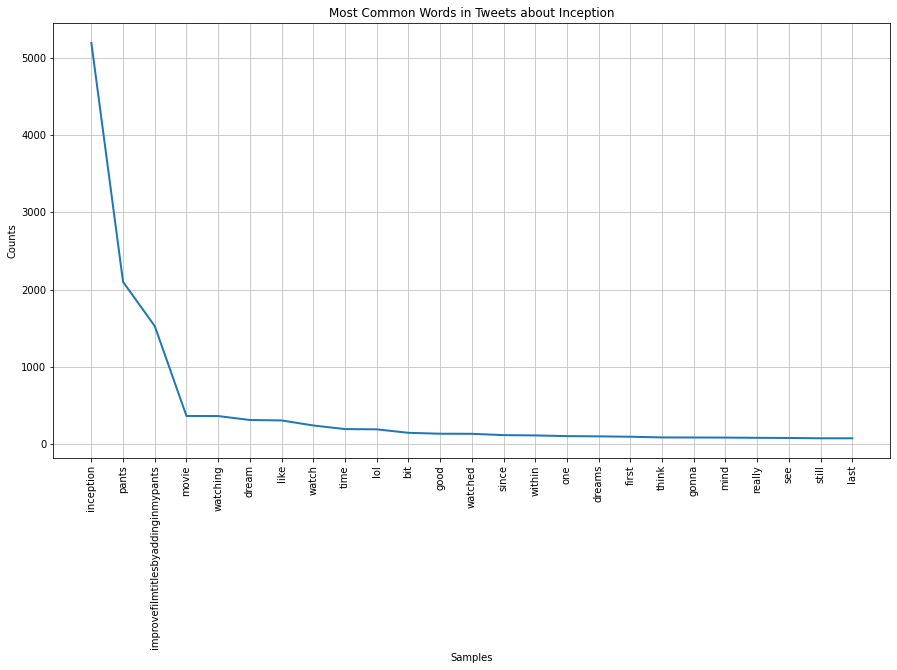

In [20]:
#line plot
fig, ax = plt.subplots(1,1, figsize=(15,8)) 
ax = fdist.plot(25, title="Most Common Words in Tweets about Inception")

In [17]:
# from fdist.most_common(25) seperate words and counts
inception_words = [x[0] for x in fdist.most_common(25)]
print(inception_words)
inception_counts = [x[1] for x in fdist.most_common(25)]
print(inception_counts)

['inception', 'pants', 'improvefilmtitlesbyaddinginmypants', 'movie', 'watching', 'dream', 'like', 'watch', 'time', 'lol', 'bit', 'good', 'watched', 'since', 'within', 'one', 'dreams', 'first', 'think', 'gonna', 'mind', 'really', 'see', 'still', 'last']
[5195, 2099, 1526, 362, 361, 310, 304, 239, 192, 189, 144, 132, 131, 114, 110, 101, 98, 93, 84, 83, 82, 79, 77, 73, 73]


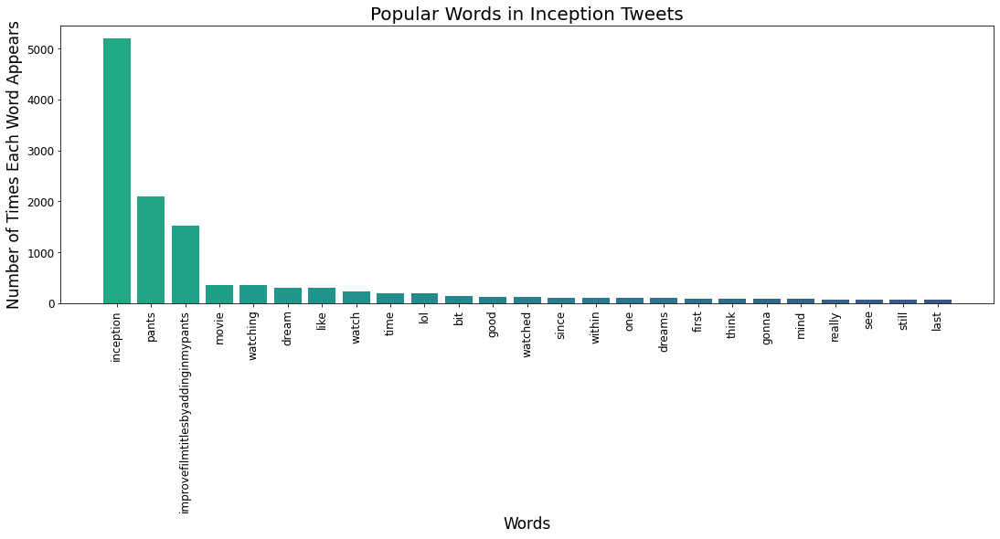

In [18]:
fig, ax = plt.subplots(1,1, figsize=(15,8))

# matplotlib bar plot
ax.bar(inception_words, inception_counts, color=cm.viridis_r(np.linspace(.4,.8, 30)))
plt.xticks(rotation=90)
plt.xlabel('Words', fontsize = 17)
plt.ylabel('Number of Times Each Word Appears', fontsize = 17)
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.title('Popular Words in Inception Tweets', fontsize = 20)

plt.tight_layout(pad=0) #necessary - if not included extra text shows up

# plt.savefig('images/barInception.png')

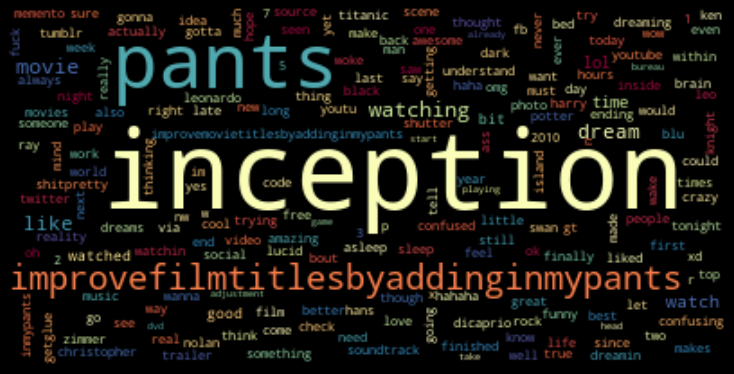

In [45]:
# Create the word cloud:

wordcloud = WordCloud(colormap='Spectral').generate_from_frequencies(fdist)

# Display the generated image w/ matplotlib:

plt.figure(figsize=(10,10), facecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad=0)

plt.show()

# Uncomment the next line if you want to save your image:
# plt.savefig('image/inceptionwordcloud.jpg')

# Ingrid Goes West

In [6]:
#gather tweets from the movie Ingrid Goes West
c = twint.Config()
c.Search = "Ingrid Goes West"
c.Limit = 6000
c.Since = "2017-08-25" #release date August 25, 2017
c.Until = "2018-08-25"
c.Pandas = True

# Uncommonet the following line to run
# twint.run.Search(c)

In [7]:
#create dataframe
df_2 = twint.storage.panda.Tweets_df
df_2.head()

,id,conversation_id,created_at,date,timezone,place,tweet,language,hashtags,cashtags,...,geo,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest
0,1032762047539437568,1032762047539437568,1.535065e+12,2018-08-23 18:50:34,-0500,,Another day another avocado toast. #avocadotoa...,en,"[avocadotoast, ingridgoeswest, 31days31photos]",[],...,,,,,,[],,,,
1,1032742273644224516,1032742273644224516,1.535060e+12,2018-08-23 17:32:00,-0500,,#IngridGoesWest is a total package when you wa...,en,[ingridgoeswest],[],...,,,,,,[],,,,
2,1032735537424228352,1032735537424228352,1.535058e+12,2018-08-23 17:05:14,-0500,,'Ingrid goes West' satiriza el vacío existenci...,es,[],[],...,,,,,,[],,,,
3,1032674022243192833,1032674014076882944,1.535044e+12,2018-08-23 13:00:47,-0500,,44. Step 45. The dark tower 46. Ingrid goes we...,en,[],[],...,,,,,,[],,,,
4,1032669255165071360,1032669255165071360,1.535043e+12,2018-08-23 12:41:51,-0500,,#IngridGoesWest https://t.co/5LpLKDAfpl,und,[ingridgoeswest],[],...,,,,,,[],,,,


In [8]:
# remove non-English tweets
df_2 = df_2[df_2['language'] == 'en']
df_2.shape

(5162, 38)

Uncomment and run the next cell to create df_2

In [24]:
# df_2.to_csv('df_2.csv')

Uncomment and run the next cell to read in df_2

In [19]:
# df_2 = pd.read_csv('df_2.csv')

In [20]:
#isolate the tweets
tweets_ingrid = df_2['tweet'].values
tweets_ingrid

array(['Another day another avocado toast. #avocadotoast🥑🍞 #ingridgoeswest #31days31photos  https://t.co/zGEkN5uKvU',
       '#IngridGoesWest is a total package when you want to advise your sorry-ass, SM addictive self. Love for oneself is key and should not be influenced by SM. It tells the story of addiction, fake life, forcing to belong,giving up and more. A must watch',
       '44. Step 45. The dark tower 46. Ingrid goes west 47. Naked ( 2017 ) 48. Good time 49. The nut job 2 50. The wound 51. A gentleman  52. The beach rats',
       ..., 'Pls watch Ingrid goes west lmao',
       '@hellomattspicer i am now officially a huge fan. watched #ingridgoeswest on my flight to the superbowl. what fantastic work. 👏🏻',
       '@BWDR Ingrid Goes West. Such an amazing portrayal of mental health deterioration in connection with social media  https://t.co/5wJa17krr8'],
      dtype=object)

In [21]:
#tokenize tweets
tokenized_tweets = []
for tweet in tweets_ingrid:
    tokenized_tweets.append(tokenizer.tokenize(tweet.lower())) #lowercase to minimize duplicates
     
print(tokenized_tweets)

[['another', 'day', 'another', 'avocado', 'toast', 'avocadotoast', 'ingridgoeswest', '31days31photos', 'https', 't', 'co', 'zgekn5ukvu'], ['ingridgoeswest', 'is', 'a', 'total', 'package', 'when', 'you', 'want', 'to', 'advise', 'your', 'sorry', 'ass', 'sm', 'addictive', 'self', 'love', 'for', 'oneself', 'is', 'key', 'and', 'should', 'not', 'be', 'influenced', 'by', 'sm', 'it', 'tells', 'the', 'story', 'of', 'addiction', 'fake', 'life', 'forcing', 'to', 'belong', 'giving', 'up', 'and', 'more', 'a', 'must', 'watch'], ['44', 'step', '45', 'the', 'dark', 'tower', '46', 'ingrid', 'goes', 'west', '47', 'naked', '2017', '48', 'good', 'time', '49', 'the', 'nut', 'job', '2', '50', 'the', 'wound', '51', 'a', 'gentleman', '52', 'the', 'beach', 'rats'], ['ingrid', 'goes', 'west', 'official', 'teaser', 'august', '2017', 'neon', 'https', 't', 'co', 'o7x4vnb7tp', 'https', 't', 'co', 'eoq7wd5cms'], ['two', 'movies', 'own', 'my', 'whole', 'heart', 'and', 'that', 'is', 'the', 'kings', 'of', 'summer', 'an

In [22]:
#isolate each word
tweets = []
for tweet in tokenized_tweets:
    for word in tweet:
        if word not in stopwords_list: #do not include stop words
            tweets.append(word)  

tweets

['another',
 'day',
 'another',
 'avocado',
 'toast',
 'avocadotoast',
 'ingridgoeswest',
 '31days31photos',
 'zgekn5ukvu',
 'ingridgoeswest',
 'total',
 'package',
 'want',
 'advise',
 'sorry',
 'ass',
 'sm',
 'addictive',
 'self',
 'love',
 'oneself',
 'key',
 'influenced',
 'sm',
 'tells',
 'story',
 'addiction',
 'fake',
 'life',
 'forcing',
 'belong',
 'giving',
 'must',
 'watch',
 '44',
 'step',
 '45',
 'dark',
 'tower',
 '46',
 'ingrid',
 'goes',
 'west',
 '47',
 'naked',
 '2017',
 '48',
 'good',
 'time',
 '49',
 'nut',
 'job',
 '2',
 '50',
 'wound',
 '51',
 'gentleman',
 '52',
 'beach',
 'rats',
 'ingrid',
 'goes',
 'west',
 'official',
 'teaser',
 'august',
 '2017',
 'neon',
 'o7x4vnb7tp',
 'eoq7wd5cms',
 'two',
 'movies',
 'whole',
 'heart',
 'kings',
 'summer',
 'ingrid',
 'goes',
 'west',
 'forever',
 'grateful',
 'film',
 'thank',
 'infinitely',
 'heart',
 'roadtrips',
 'made',
 'see',
 'film',
 'worth',
 'every',
 'time',
 'watch',
 'film',
 'love',
 'ingridgoeswest',
 'h

In [23]:
#freqDist - frequency of words within a text, in this case tweets about Ingrid Goes West
fdist = FreqDist(tweets)

In [24]:
#most common words in tweet
fdist.most_common(25)

[('ingrid', 4349),
 ('goes', 4251),
 ('west', 4226),
 ('ingridgoeswest', 1114),
 ('movie', 725),
 ('2017', 472),
 ('good', 436),
 ('watching', 415),
 ('watch', 413),
 ('aubrey', 412),
 ('plaza', 412),
 ('watched', 403),
 ('evilhag', 359),
 ('like', 346),
 ('social', 324),
 ('film', 320),
 ('media', 308),
 ('win', 273),
 ('best', 259),
 ('dvd', 259),
 ('really', 237),
 ('movies', 230),
 ('great', 211),
 ('last', 196),
 ('love', 194)]

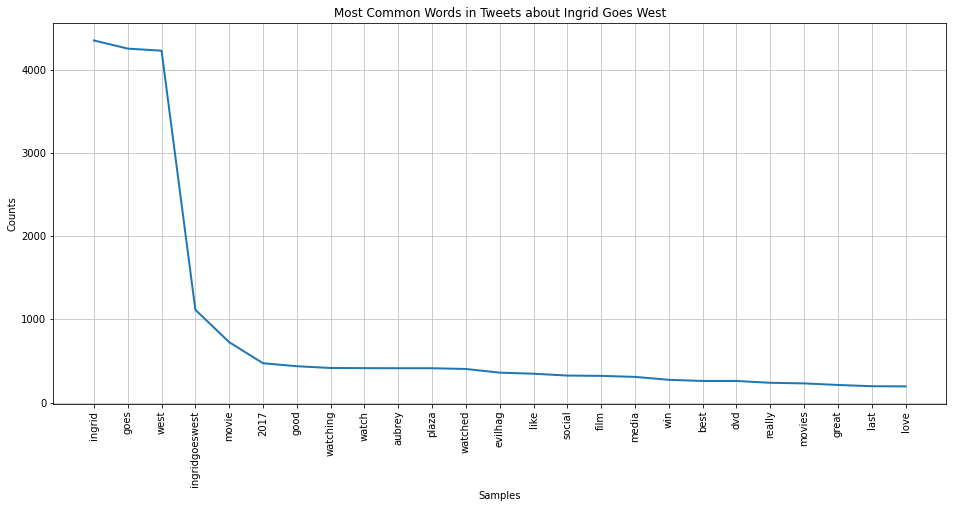

In [26]:
#line plot
plt.figure(figsize=(16,7))
ax = fdist.plot(25, title="Most Common Words in Tweets about Ingrid Goes West")

In [27]:
# from fdist.most_common(25) seperate words and counts
ingridgoeswest_words = [x[0] for x in fdist.most_common(25)]
print(ingridgoeswest_words)
ingridgoeswest_counts = [x[1] for x in fdist.most_common(25)]
print(ingridgoeswest_counts)

['ingrid', 'goes', 'west', 'ingridgoeswest', 'movie', '2017', 'good', 'watching', 'watch', 'aubrey', 'plaza', 'watched', 'evilhag', 'like', 'social', 'film', 'media', 'win', 'best', 'dvd', 'really', 'movies', 'great', 'last', 'love']
[4349, 4251, 4226, 1114, 725, 472, 436, 415, 413, 412, 412, 403, 359, 346, 324, 320, 308, 273, 259, 259, 237, 230, 211, 196, 194]


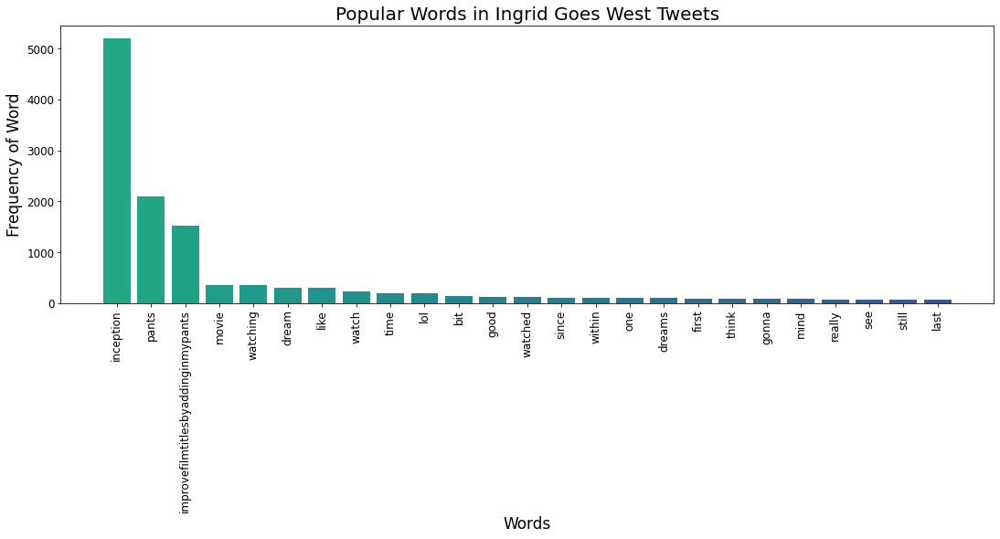

In [28]:
fig, ax = plt.subplots(1,1, figsize=(15,8))

# matplotlib bar plot
ax.bar(inception_words, inception_counts, color=cm.viridis_r(np.linspace(.4,.8, 30)))
plt.xticks(rotation=90)
plt.xlabel('Words', fontsize = 17)
plt.ylabel('Frequency of Word', fontsize = 17)
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.title('Popular Words in Ingrid Goes West Tweets', fontsize = 20)

plt.tight_layout(pad=0) #necessary - if not included extra text shows up

# plt.savefig('images/barIngrid.png')

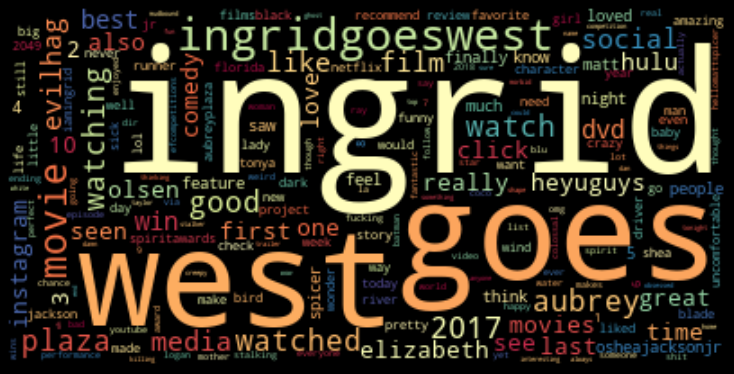

<Figure size 432x288 with 0 Axes>

In [18]:
# Create the word cloud:

wordcloud = WordCloud(colormap='Spectral').generate_from_frequencies(fdist)

# Display image with matplotlib:

plt.figure(figsize=(10,10), facecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad=0)

# Uncomment the next line if you want to save your image:
# plt.savefig('images/cloudingridgoeswest')

# The Big Sick

In [7]:
#gather tweets from the movie The Big Sick
c = twint.Config()
c.Search = "The Big Sick"
c.Limit = 6000
c.Since = "2017-07-14" #release date July 14, 2017
c.Until = "2018-07-14"
c.Pandas = True

# Uncommonet the following line to run
# twint.run.Search(c)

In [24]:
#create dataframe of tweets about The Big Sick
df_3 = twint.storage.panda.Tweets_df
df_3.head()

,id,conversation_id,created_at,date,timezone,place,tweet,language,hashtags,cashtags,...,geo,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest
0,1017554234919682048,1017499949871685632,1.531439e+12,2018-07-12 19:40:09,-0500,,@kumailn I just saw the Big Sick and you are a...,en,[],[],...,,,,,,"[{'screen_name': 'kumailn', 'name': 'Kumail Na...",,,,
1,1017550612098093056,1017550612098093056,1.531438e+12,2018-07-12 19:25:45,-0500,,@kumailn Just finished The Big Sick. It was s...,en,[],[],...,,,,,,[],,,,
2,1017544781281595393,1017544781281595393,1.531437e+12,2018-07-12 19:02:35,-0500,,I added a video to a @YouTube playlist https:...,en,[],[],...,,,,,,[],,,,
3,1017519513913511937,1017499949871685632,1.531431e+12,2018-07-12 17:22:11,-0500,,@kumailn damn why did I just now watch the big...,en,[],[],...,,,,,,"[{'screen_name': 'kumailn', 'name': 'Kumail Na...",,,,
4,1017493554925621248,1017493554925621248,1.531424e+12,2018-07-12 15:39:02,-0500,,At the beginning of a relationship: “omg you’r...,en,[],[],...,,,,,,[],,,,


In [25]:
# remove non-English tweets
df_3 = df_3[df_3['language'] == 'en']

In [26]:
#shape after non-English tweets removed
df_3.shape

(5349, 38)

Uncomment and run the next line of code to  create df_3 dataframe

In [27]:
# df_3.to_csv('df_3.csv')

In [28]:
#isolate the tweets before tokenizing the tweets
tweets_bigS = df_3['tweet'].values
tweets_bigS

array(['@kumailn I just saw the Big Sick and you are amazing and I am so happy your wife has recovered. 🙏🙏🙏',
       '@kumailn Just finished The Big Sick.  It was so fucking good!!!!',
       "I added a video to a @YouTube playlist  https://t.co/3OXCF1nuDY S5E29: 2017's The Big Sick",
       ...,
       'the only movies I saw last year were Wonder Woman...Black Panther....Coco....TLJ and The Big Sick....(and a handful of kids stuff I care to never mention again)',
       'My Top 11 for Best Picture Oscar as of today:  1. Get Out 2. The Shape of Water 3. Wonder Woman 4. When We Rise 5. Logan 6. Mudbound 7. Girls Trip 8. Darkest Hour 9. I, Tonya 10. The Big Sick 11. Wonder   Note: Getting Three Billboards, Lady Bird and Florida Project Tuesday',
       '@RobbieBarstool Get Out, Billboards, and The Big Sick were all better by a considerable margin (I liked shape of water too)'],
      dtype=object)

In [29]:
#tokenize the tweets
tokenized_tweets = []
for tweet in tweets_bigS:
    tokenized_tweets.append(tokenizer.tokenize(tweet.lower())) #make all tweets lowercase to avoid duplicates later on
        
print(tokenized_tweets)

[['kumailn', 'i', 'just', 'saw', 'the', 'big', 'sick', 'and', 'you', 'are', 'amazing', 'and', 'i', 'am', 'so', 'happy', 'your', 'wife', 'has', 'recovered'], ['kumailn', 'just', 'finished', 'the', 'big', 'sick', 'it', 'was', 'so', 'fucking', 'good'], ['i', 'added', 'a', 'video', 'to', 'a', 'youtube', 'playlist', 'https', 't', 'co', '3oxcf1nudy', 's5e29', '2017', 's', 'the', 'big', 'sick'], ['kumailn', 'damn', 'why', 'did', 'i', 'just', 'now', 'watch', 'the', 'big', 'sick', 'really', 'enjoyed', 'it'], ['at', 'the', 'beginning', 'of', 'a', 'relationship', 'omg', 'you', 're', 'so', 'funny', 'i', 'love', 'your', 'sense', 'of', 'humour', 'in', 'a', 'relationship', 'now', 'we', 'are', 'literally', 'at', 'the', 'hospital', 'finding', 'out', 'if', 'your', 'uncle', 'has', 'cancer', 'can', 'you', 'stop', 'making', 'jokes', 'about', 'big', 'sick', 'energy'], ['dmw', 'directs', 'the', 'crown', 'is', 'on', 'netflix', 'not', 'hbo', 'also', 'i', 'loved', 'the', 'movie', 'the', 'big', 'sick', 'it', 's'

In [30]:
#isolate each word within a tweet, not including stop words
tweets = []
for tweet in tokenized_tweets:
    for word in tweet:
        if word not in stopwords_list:
            tweets.append(word)  

tweets

['kumailn',
 'saw',
 'big',
 'sick',
 'amazing',
 'happy',
 'wife',
 'recovered',
 'kumailn',
 'finished',
 'big',
 'sick',
 'fucking',
 'good',
 'added',
 'video',
 'youtube',
 'playlist',
 '3oxcf1nudy',
 's5e29',
 '2017',
 'big',
 'sick',
 'kumailn',
 'damn',
 'watch',
 'big',
 'sick',
 'really',
 'enjoyed',
 'beginning',
 'relationship',
 'omg',
 'funny',
 'love',
 'sense',
 'humour',
 'relationship',
 'literally',
 'hospital',
 'finding',
 'uncle',
 'cancer',
 'stop',
 'making',
 'jokes',
 'big',
 'sick',
 'energy',
 'dmw',
 'directs',
 'crown',
 'netflix',
 'hbo',
 'also',
 'loved',
 'movie',
 'big',
 'sick',
 'amazon',
 'runner',
 'ups',
 'edge',
 'tomorrow',
 'martian',
 'boyhood',
 'ratatouille',
 'black',
 'panther',
 'big',
 'sick',
 'tonya',
 'list',
 'goes',
 'phone',
 'culture',
 'demanding',
 'drop',
 'pod',
 'day',
 'early',
 'sic',
 'episode',
 'folks',
 'talking',
 'sicario',
 '2',
 'big',
 'sick',
 'sic',
 'man',
 'josh',
 'brolin',
 'wnholzzxov',
 'rt5ynypoyw',
 'big

In [31]:
#freqDist - frequency of words within a text, in this case tweets about The Big Sick
fdist = FreqDist(tweets)

In [32]:
#25 most common words in Big Sick tweets
fdist.most_common(25)

[('big', 5523),
 ('sick', 5434),
 ('kumailn', 1000),
 ('movie', 761),
 ('good', 461),
 ('2017', 446),
 ('watched', 446),
 ('watching', 411),
 ('love', 399),
 ('like', 389),
 ('kumail', 354),
 ('watch', 350),
 ('film', 296),
 ('one', 290),
 ('great', 290),
 ('movies', 266),
 ('really', 258),
 ('loved', 252),
 ('time', 252),
 ('seen', 249),
 ('best', 244),
 ('finally', 232),
 ('nanjiani', 232),
 ('last', 224),
 ('story', 192)]

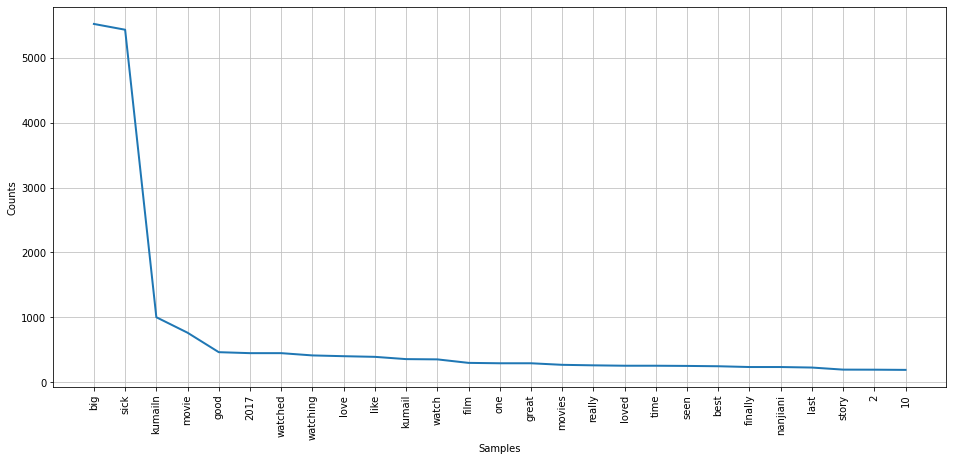

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [33]:
#line plot
fig, ax = plt.subplots(1,1, figsize=(15,8)) 
ax = fdist.plot(25, title="Most Common Words in Tweets about The Big Sick")

In [ ]:
# from fdist.most_common(25) seperate words and counts
bigsick_words = [x[0] for x in fdist.most_common(25)]
print(bigsick_words)
inception_counts = [x[1] for x in fdist.most_common(25)]
print(bigsick_counts)

In [ ]:
fig, ax = plt.subplots(1,1, figsize=(15,8))

# matplotlib bar plot
ax.bar(inception_words, inception_counts, color=cm.viridis_r(np.linspace(.4,.8, 30)))
plt.xticks(rotation=90)
plt.xlabel('Words', fontsize = 17)
plt.ylabel('Frequency of Word Appearance', fontsize = 17)
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.title('Popular Words in Tweets About The Big Sick', fontsize = 20)

plt.tight_layout(pad=0) #necessary - if not included extra text shows up

# plt.savefig('images/barBigSick.png')

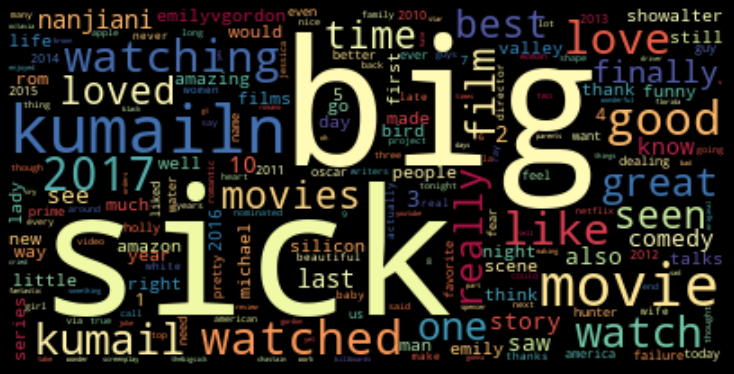

In [36]:
# Create the word cloud:

wordcloud = WordCloud(colormap='Spectral').generate_from_frequencies(fdist)

# Display the generated image with matplotlib:

plt.figure(figsize=(10,10), facecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad=0)

# Uncomment the next line if you want to save your image:
# plt.savefig('images/cloudbigsick.png')

# Gone Girl

In [8]:
#collect tweets for Gone Girl movie
c = twint.Config()
c.Search = "Gone Girl"
c.Limit = 7500
c.Since = "2014-10-03" #release date October 3, 2014
c.Until = "2015-10-03"
c.Pandas = True

# Uncommonet the following line to run
# twint.run.Search(c)

In [38]:
#Gone Girl dataframe
df_4 = twint.storage.panda.Tweets_df
df_4.head()

,id,conversation_id,created_at,date,timezone,place,tweet,language,hashtags,cashtags,...,geo,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest
0,649734536004280321,649734536004280321,1.443744e+12,2015-10-01 19:55:59,-0500,,"Gone Girl - Das perfekte Opfer nur noch 7,99 E...",de,[dvd],[],...,,,,,,[],,,,
1,649732798438215680,649732566065348609,1.443743e+12,2015-10-01 19:49:05,-0500,,(#UntilDawn spoilers) HE GONE GIRL'D HIS PHALA...,en,[untildawn],[],...,,,,,,[],,,,
2,649732770122461184,649729175708798977,1.443743e+12,2015-10-01 19:48:58,-0500,,@chlomeganda gone girl chloeeee :),en,[],[],...,,,,,,[],,,,
3,649732566065348609,649732566065348609,1.443743e+12,2015-10-01 19:48:09,-0500,,"(#UntilDawn spoilers) OPEN THE BEAR TRAP, CRY....",en,[untildawn],[],...,,,,,,[],,,,
4,649732240398786561,649732240398786561,1.443743e+12,2015-10-01 19:46:52,-0500,,Suspect indicted in Vallejo 'Gone Girl' kidnap...,en,[],[],...,,,,,,[],,,,


In [39]:
# remove non-English tweets
df_4 = df_4[df_4['language'] == 'en']
df_4.shape

(5221, 38)

Uncomment and run the following cell to create df_4

In [40]:
# df_4.to_csv('df_4.csv')

In [41]:
#isolate tweets about the movie Gone Girl
tweets_GoneGirl = df_4['tweet'].values
tweets_GoneGirl

array(["(#UntilDawn spoilers) HE GONE GIRL'D HIS PHALANGES. ENOUGH, CRY. ENOUGH.",
       '@chlomeganda gone girl chloeeee :)',
       "(#UntilDawn spoilers) OPEN THE BEAR TRAP, CRY. DON'T GONE GIRL HIS PHALANGES.",
       ..., 'Gone Girl👀',
       "California Couple in 'Gone Girl' Kidnapping Files Claim Against City  http://t.co/e2QRdQjxd8  http://t.co/wflxYzCg3X",
       "California Couple in 'Gone Girl' Kidnapping Files Claim Against City  http://t.co/4rfqydNGkh  http://t.co/Vj8Cu7kBqO"],
      dtype=object)

In [42]:
#tokenize tweets
tokenized_tweets = []
for tweet in tweets_GoneGirl:
    tokenized_tweets.append(tokenizer.tokenize(tweet.lower())) #make each tweet lowercase to avoid duplicates
       
print(tokenized_tweets)

[['untildawn', 'spoilers', 'he', 'gone', 'girl', 'd', 'his', 'phalanges', 'enough', 'cry', 'enough'], ['chlomeganda', 'gone', 'girl', 'chloeeee'], ['untildawn', 'spoilers', 'open', 'the', 'bear', 'trap', 'cry', 'don', 't', 'gone', 'girl', 'his', 'phalanges'], ['suspect', 'indicted', 'in', 'vallejo', 'gone', 'girl', 'kidnapping', 'case', 'a', 'harvard', 'law', 'school', 'graduate', 'and', 'former', 'u', 's', 'marine', 'has', 'http', 't', 'co', 'nfjshwvee9'], ['gone', 'girl', 'is', 'a', 'fucking', 'crazy', 'movie', 'thumbsup'], ['gone', 'girl', 'the', 'movie', 'was', 'so', 'messed', 'up', 'and', 'weird', 'but', 'it', 'was', 'good'], ['breakingnews', 'suspect', 'indicted', 'in', 'mysterious', 'gone', 'girl', 'kidnapping', 'case', 'in', 'vallejo', 'http', 't', 'co', '1bhrjbcu5q'], ['i', 'love', 'gone', 'girl', 'srry'], ['book', 'gone', 'girl', 'http', 't', 'co', 'fz3esjr7dd', 'wlcauthor', 'scifibooks'], ['adamberry', 'hayleyqpr', 'i', 'never', 'swear', 'on', 'twitter', 'but', 'i', 'thought

In [43]:
#isolate each word in Gone Girl movie tweets except stop words
tweets = []
for tweet in tokenized_tweets:
    for word in tweet:
        if word not in stopwords_list:
            tweets.append(word)  

tweets

['untildawn',
 'spoilers',
 'gone',
 'girl',
 'phalanges',
 'enough',
 'cry',
 'enough',
 'chlomeganda',
 'gone',
 'girl',
 'chloeeee',
 'untildawn',
 'spoilers',
 'open',
 'bear',
 'trap',
 'cry',
 'gone',
 'girl',
 'phalanges',
 'suspect',
 'indicted',
 'vallejo',
 'gone',
 'girl',
 'kidnapping',
 'case',
 'harvard',
 'law',
 'school',
 'graduate',
 'former',
 'marine',
 'nfjshwvee9',
 'gone',
 'girl',
 'fucking',
 'crazy',
 'movie',
 'thumbsup',
 'gone',
 'girl',
 'movie',
 'messed',
 'weird',
 'good',
 'breakingnews',
 'suspect',
 'indicted',
 'mysterious',
 'gone',
 'girl',
 'kidnapping',
 'case',
 'vallejo',
 '1bhrjbcu5q',
 'love',
 'gone',
 'girl',
 'srry',
 'book',
 'gone',
 'girl',
 'fz3esjr7dd',
 'wlcauthor',
 'scifibooks',
 'adamberry',
 'hayleyqpr',
 'never',
 'swear',
 'twitter',
 'thought',
 'shit',
 'mate',
 'maybe',
 'critics',
 'see',
 'something',
 'didnt',
 'gonegirl',
 'mrs',
 'drw',
 'read',
 'lady',
 'gone',
 'girl',
 'books',
 'gillian',
 'something',
 'reading',

In [44]:
#freqDist - frequency of words within a text, in this case tweets about Gone Girl
fdist = FreqDist(tweets)

In [45]:
#top 25 words used when tweeting about Gone Girl
fdist.most_common(25)

[('girl', 5055),
 ('gone', 4779),
 ('movie', 636),
 ('watching', 570),
 ('gonegirl', 554),
 ('good', 303),
 ('like', 286),
 ('watch', 265),
 ('flynn', 235),
 ('gillian', 233),
 ('watched', 219),
 ('read', 212),
 ('book', 202),
 ('reading', 196),
 ('crazy', 194),
 ('train', 192),
 ('time', 187),
 ('love', 166),
 ('join', 159),
 ('film', 158),
 ('qwqgukxak4', 149),
 ('seen', 141),
 ('one', 140),
 ('28', 121),
 ('ever', 120)]

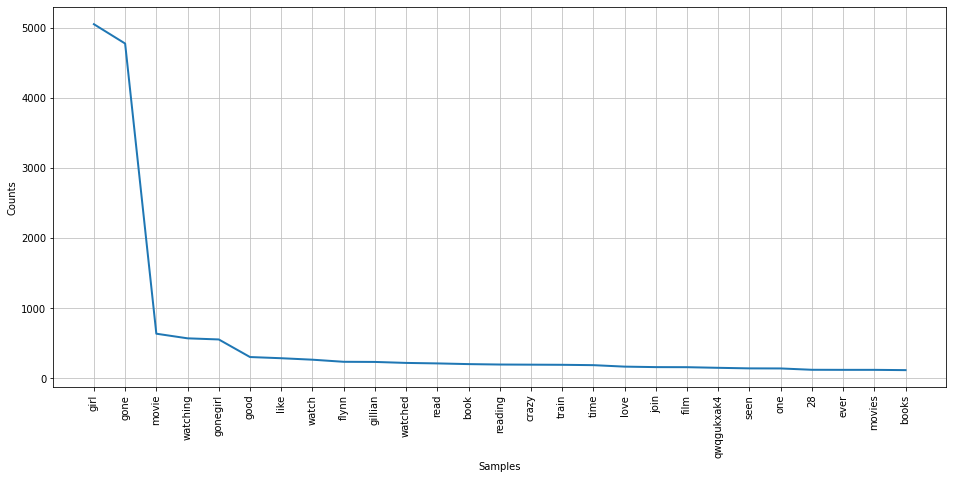

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [46]:
#line plot
fig, ax = plt.subplots(1,1, figsize=(15,8)) 
ax = fdist.plot(25, title="Most Common Words in Tweets about Gone Girl")

In [ ]:
# from fdist.most_common(25) seperate words and counts
gonegirl_words = [x[0] for x in fdist.most_common(25)]
print(gonegirl_words)
gonegirl_counts = [x[1] for x in fdist.most_common(25)]
print(gonegirl_counts)

In [ ]:
fig, ax = plt.subplots(1,1, figsize=(15,8))

# matplotlib bar plot
ax.bar(gonegirl_words, gonegirl_counts, color=cm.viridis_r(np.linspace(.4,.8, 30)))
plt.xticks(rotation=90)
plt.xlabel('Words', fontsize = 17)
plt.ylabel('Number of Times Each Word Appears', fontsize = 17)
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.title('Popular Words in Gone Girl Tweets', fontsize = 20)

plt.tight_layout(pad=0) #necessary - if not included extra text shows up

# plt.savefig('images/bargonegirl.png')

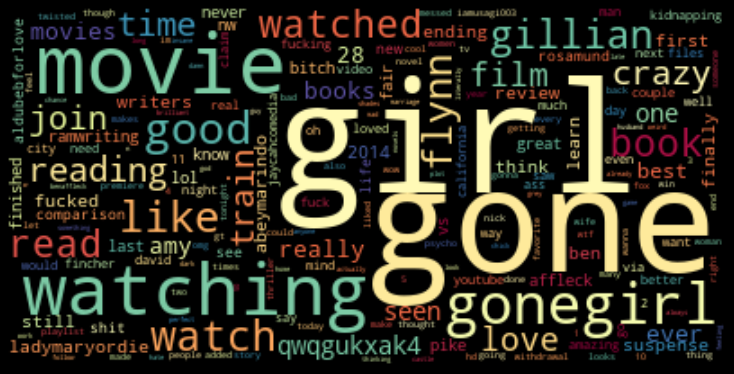

In [47]:
# Create the word cloud:

wordcloud = WordCloud(colormap='Spectral').generate_from_frequencies(fdist)

# Display matplotlib image:

plt.figure(figsize=(10,10), facecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad=0)

# Uncomment the next line if you want to save your image:
# plt.savefig('images/cloudgonegirl.png')

# 17 Again 

In [9]:
#gather tweets from the movie 17 Again
c = twint.Config()
c.Search = "17 Again"
c.Limit = 6000
c.Since = "2009-04-14" #release date April 14, 2009
c.Until = "2010-04-14"
c.Pandas = True

# Uncommonet the following line to run
# twint.run.Search(c)

In [49]:
#create dataframe for the movie 17 Again
df_5 = twint.storage.panda.Tweets_df
df_5.head()

,id,conversation_id,created_at,date,timezone,place,tweet,language,hashtags,cashtags,...,geo,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest
0,12072812563,12072812563,1.271116e+12,2010-04-12 19:44:15,-0500,,http://bit.ly/bqye6j where can i get a dress ...,en,[],[],...,,,,,,[],,,,
1,12072070037,12072070037,1.271115e+12,2010-04-12 19:28:20,-0500,,watching 17 Again. :) i missed this movie.,en,[],[],...,,,,,,[],,,,
2,12072044784,12071772509,1.271115e+12,2010-04-12 19:27:47,-0500,,"@conallen haha not surprising. ""17 Again"" seem...",en,[],[],...,,,,,,[],,,,
3,12071939860,12071939860,1.271115e+12,2010-04-12 19:25:32,-0500,,"@tjlyricz just gonna watch 17 again, and you g...",en,[],[],...,,,,,,[],,,,
4,12071936881,12071936881,1.271115e+12,2010-04-12 19:25:28,-0500,,Encontré un remedio infalible para superar mi ...,es,[],[],...,,,,,,[],,,,


In [50]:
# remove non-English tweets
df_5 = df_5[df_5['language'] == 'en']

In [51]:
#shape after non-English tweets are removed
df_5.shape

(5173, 38)

Uncomment and run the next cell to save df_5

In [52]:
# df_5.to_csv('df_5.csv')

In [53]:
#isolate tweets
tweets_17 = df_5['tweet'].values
tweets_17

array([' http://bit.ly/bqye6j where can i get a dress similar to the zac posen dress vanessa hudgens wore to the 17 again premiere?   Zac Posen',
       'watching 17 Again. :) i missed this movie.',
       '@conallen haha not surprising. "17 Again" seemed to be the trigger for quite a few converts. He\'s a charmer.',
       ...,
       "I'm watching Signs because I'm not allowing myself to watch 17 Again, again. Mistake? Possibly.",
       '#nowplaying 17 again (i hella like this movie)',
       "@Leopardjedi It's my way of trying to be 17 again, hahahaha! Mid life (20s) crisis!"],
      dtype=object)

In [54]:
#tokenize isolated tweets
tokenized_tweets = []
for tweet in tweets_17:
    tokenized_tweets.append(tokenizer.tokenize(tweet.lower())) #make tweets lowercase to avoid duplicates
        
print(tokenized_tweets)

[['http', 'bit', 'ly', 'bqye6j', 'where', 'can', 'i', 'get', 'a', 'dress', 'similar', 'to', 'the', 'zac', 'posen', 'dress', 'vanessa', 'hudgens', 'wore', 'to', 'the', '17', 'again', 'premiere', 'zac', 'posen'], ['watching', '17', 'again', 'i', 'missed', 'this', 'movie'], ['conallen', 'haha', 'not', 'surprising', '17', 'again', 'seemed', 'to', 'be', 'the', 'trigger', 'for', 'quite', 'a', 'few', 'converts', 'he', 's', 'a', 'charmer'], ['tjlyricz', 'just', 'gonna', 'watch', '17', 'again', 'and', 'you', 'gotta', 'loove', 'being', 'a', 'late', 'night', 'tweeter', 'haha', 'what', 'you', 'doing', 'xxxxx'], ['jacobjunior7', 'yeah', 'more', 'boyish', 'then', 'which', 'is', 'why', 'i', 'didn', 't', 'really', 'pay', 'attention', 'i', 'saw', '17', 'again', 'one', 'scene', 'made', 'me', 'go', 'o', 'o', 'whoa', 'lol'], ['crabstickz', 'at', 'the', 'game', 'that', 'was', 'set', 'in', 'like', 'the', '80', 's', 'or', 'something', 'there', 'was', 'a', 'guy', 'in', 'a', 'paramore', 'shirt', '17', 'again',

In [55]:
#isolate each word
tweets = []
for tweet in tokenized_tweets:
    for word in tweet:
        if word not in stopwords_list: #don't include stop words in list
            tweets.append(word)  

tweets

['bit',
 'bqye6j',
 'dress',
 'similar',
 'zac',
 'posen',
 'dress',
 'vanessa',
 'hudgens',
 'wore',
 '17',
 'premiere',
 'zac',
 'posen',
 'watching',
 '17',
 'missed',
 'movie',
 'conallen',
 'haha',
 'surprising',
 '17',
 'seemed',
 'trigger',
 'quite',
 'converts',
 'charmer',
 'tjlyricz',
 'gonna',
 'watch',
 '17',
 'gotta',
 'loove',
 'late',
 'night',
 'tweeter',
 'haha',
 'xxxxx',
 'jacobjunior7',
 'yeah',
 'boyish',
 'really',
 'pay',
 'attention',
 'saw',
 '17',
 'one',
 'scene',
 'made',
 'go',
 'whoa',
 'lol',
 'crabstickz',
 'game',
 'set',
 'like',
 '80',
 'something',
 'guy',
 'paramore',
 'shirt',
 '17',
 'fail',
 'thenicolecooper',
 'picturing',
 'zac',
 'efron',
 '17',
 'part',
 'gets',
 'car',
 'lol',
 'sam',
 'texting',
 '17',
 'quotes',
 'brother',
 'said',
 'apparantly',
 '17',
 '1',
 'basketball',
 'scenes',
 'someone',
 'audience',
 'wearing',
 'paramore',
 'shirt',
 'watched',
 '17',
 'brilliant',
 'movie',
 'wish',
 'life',
 'really',
 'like',
 'hunterparrish

In [56]:
#frequency of words within 17 Again
fdist = FreqDist(tweets)

In [57]:
fdist.most_common(25)

[('17', 5096),
 ('watching', 1290),
 ('movie', 903),
 ('zac', 842),
 ('efron', 734),
 ('watch', 508),
 ('like', 444),
 ('love', 376),
 ('lol', 373),
 ('zoeblais', 287),
 ('good', 265),
 ('17again', 253),
 ('watched', 250),
 ('3', 217),
 ('watchin', 190),
 ('bit', 176),
 ('feel', 160),
 ('haha', 149),
 ('4', 148),
 ('time', 144),
 ('im', 142),
 ('one', 139),
 ('think', 138),
 ('funny', 127),
 ('really', 124)]

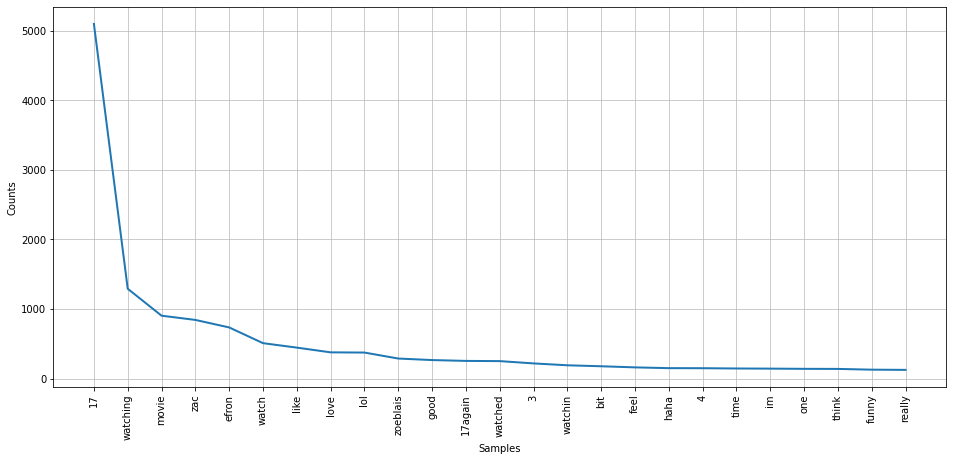

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [58]:
#line plot
fig, ax = plt.subplots(1,1, figsize=(15,8)) 
ax = fdist.plot(25, title="Most Common Words in Tweets About the Movie 17 Again")

In [ ]:
# from fdist.most_common(25) seperate words and counts
again17_words = [x[0] for x in fdist.most_common(25)]
again17_counts = [x[1] for x in fdist.most_common(25)]

In [ ]:
fig, ax = plt.subplots(1,1, figsize=(15,8))

# matplotlib bar plot
ax.bar(again17_words, again17_counts, color=cm.viridis_r(np.linspace(.4,.8, 30)))
plt.xticks(rotation=90)
plt.xlabel('Words', fontsize = 17)
plt.ylabel('Frequency of Word', fontsize = 17)
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.title('Popular Words in 17 Again Tweets', fontsize = 20)

plt.tight_layout(pad=0) #necessary - if not included extra text shows up

# plt.savefig('images/bar17again.png')

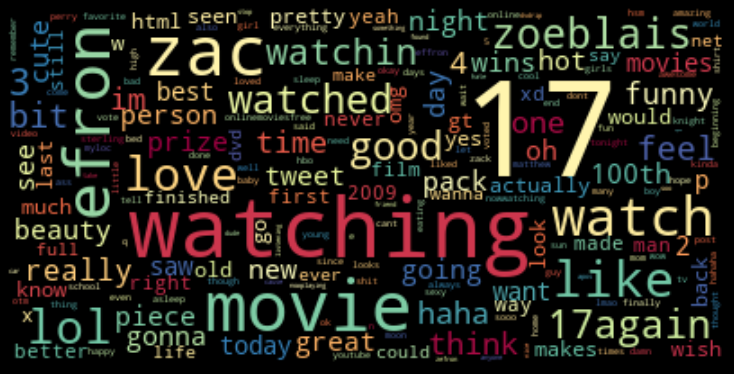

In [59]:
# Create the word cloud:

wordcloud = WordCloud(colormap='Spectral').generate_from_frequencies(fdist)

# matplotlib visual:

plt.figure(figsize=(10,10), facecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad=0)

# Uncomment the next line if you want to save your image:
# plt.savefig('images/cloud17again.png')

# Jennifer's Body

In [10]:
#gather tweets from the movie Jennifer's body
c = twint.Config()
c.Search = "Jennifer's Body"
c.Limit = 6000
c.Since = "2009-09-18" #release date September 18, 2009
c.Until = "2010-09-18"
c.Pandas = True

# Uncommonet the following line to run
# twint.run.Search(c)

In [61]:
#create dataframe for the movie Jennifer's Body
df_6 = twint.storage.panda.Tweets_df
df_6.head()

,id,conversation_id,created_at,date,timezone,place,tweet,language,hashtags,cashtags,...,geo,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest
0,24709152388,24709152388,1.284681e+12,2010-09-16 19:57:28,-0500,,I'll wear my Jennifer's Body shirt and red and...,en,[],[],...,,,,,,[],,,,
1,24708901813,24708901813,1.284681e+12,2010-09-16 19:53:59,-0500,,"tô procurando 'Jennifer's body', vi 'new persp...",pt,[],[],...,,,,,,[],,,,
2,24703649087,24703649087,1.284677e+12,2010-09-16 18:40:07,-0500,,"Watching Jennifer's Body with Erin & Jess, the...",en,[],[],...,,,,,,[],,,,
3,24698404857,24698404857,1.284672e+12,2010-09-16 17:22:37,-0500,,Ok I just threw up some black ropey stuff like...,en,[],[],...,,,,,,[],,,,
4,24696864022,24696864022,1.284671e+12,2010-09-16 16:59:37,-0500,,The Jennifer's Body soundtrack is so good. If ...,en,[],[],...,,,,,,[],,,,


In [62]:
#only use English tweets
df_6 = df_6[df_6['language'] == 'en']

In [63]:
#resulting dataframe after non-English tweets are dropped
df_6.shape

(5201, 38)

Uncomment and run next cell to save df_6

In [64]:
# df_6.to_csv('df_6.csv')

In [65]:
#isolate tweets
tweets_Jennifer = df_6['tweet'].values
tweets_Jennifer

array(["I'll wear my Jennifer's Body shirt and red and black scarf for tomorrow. (: they're red!",
       "Watching Jennifer's Body with Erin & Jess, then making breakfast for dinner & watching Project Runway!!!!",
       "Ok I just threw up some black ropey stuff like Jennifer's body styles. WTF is wrong with me?",
       ...,
       'What\'s the point of this "Jennifer\'s Body" movie ?? How did that demon shit get in her ??',
       "pad thai & jennifer's body with @kaseymarcum you're totally lime green jello.",
       "I liked a YouTube video -- Megan Fox talks Jennifer's Body and Amanda Seyfried  http://youtu.be/9qpWtbcPeow?a"],
      dtype=object)

In [66]:
#tokenize isolated tweets
tokenized_tweets = []
for tweet in tweets_Jennifer:
    tokenized_tweets.append(tokenizer.tokenize(tweet.lower())) #lower case each tweet to avoid duplicates
    
print(tokenized_tweets)

[['i', 'll', 'wear', 'my', 'jennifer', 's', 'body', 'shirt', 'and', 'red', 'and', 'black', 'scarf', 'for', 'tomorrow', 'they', 're', 'red'], ['watching', 'jennifer', 's', 'body', 'with', 'erin', 'jess', 'then', 'making', 'breakfast', 'for', 'dinner', 'watching', 'project', 'runway'], ['ok', 'i', 'just', 'threw', 'up', 'some', 'black', 'ropey', 'stuff', 'like', 'jennifer', 's', 'body', 'styles', 'wtf', 'is', 'wrong', 'with', 'me'], ['the', 'jennifer', 's', 'body', 'soundtrack', 'is', 'so', 'good', 'if', 'only', 'the', 'movie', 'was', 'as', 'decent'], ['jennifer', 's', 'body', 'is', 'possibly', 'one', 'of', 'the', 'worst', 'films', 'i', 've', 'watched', 'this', 'year', 'it', 'was', 'unbelievably', 'dreadful', 'i', 'wouldn', 't', 'advise', 'you', 'watch', 'it'], ['rjvelascooo', 'sounds', 'something', 'a', 'la', 'jennifer', 's', 'body'], ['jennifer', 's', 'body', 'who', 's', 'idea', 'was', 'it', 'to', 'make', 'a', 'movie', 'so', 'awful'], ['jennifer', 's', 'body', 'omq', 'meqan', 'fox', 'g

In [68]:
#isolate each word in tweets
tweets = []
for tweet in tokenized_tweets:
    for word in tweet:
        if word not in stopwords_list:
            tweets.append(word)  

tweets

['wear',
 'jennifer',
 'body',
 'shirt',
 'red',
 'black',
 'scarf',
 'tomorrow',
 'red',
 'watching',
 'jennifer',
 'body',
 'erin',
 'jess',
 'making',
 'breakfast',
 'dinner',
 'watching',
 'project',
 'runway',
 'ok',
 'threw',
 'black',
 'ropey',
 'stuff',
 'like',
 'jennifer',
 'body',
 'styles',
 'wtf',
 'wrong',
 'jennifer',
 'body',
 'soundtrack',
 'good',
 'movie',
 'decent',
 'jennifer',
 'body',
 'possibly',
 'one',
 'worst',
 'films',
 'watched',
 'year',
 'unbelievably',
 'dreadful',
 'advise',
 'watch',
 'rjvelascooo',
 'sounds',
 'something',
 'la',
 'jennifer',
 'body',
 'jennifer',
 'body',
 'idea',
 'make',
 'movie',
 'awful',
 'jennifer',
 'body',
 'omq',
 'meqan',
 'fox',
 'gettz',
 'hard',
 'rock',
 'sorry',
 'kim',
 'k',
 'bt',
 'itz',
 'meqan',
 'fox',
 'watching',
 'jennifer',
 'body',
 '9',
 'year',
 'old',
 'umm',
 'think',
 'old',
 'enough',
 'watch',
 'gave',
 'jennifer',
 'body',
 'blu',
 'ray',
 '3',
 'stars',
 '5',
 'lovefilm',
 'r',
 'qrci1am',
 'found'

In [69]:
#frequency of words within Jennifer's Body
fdist = FreqDist(tweets)

In [70]:
fdist.most_common(25)

[('body', 5307),
 ('jennifer', 5289),
 ('watching', 1280),
 ('movie', 1077),
 ('fox', 676),
 ('megan', 667),
 ('watch', 451),
 ('lol', 303),
 ('like', 283),
 ('bit', 275),
 ('watched', 264),
 ('good', 231),
 ('love', 222),
 ('seen', 186),
 ('time', 181),
 ('ever', 161),
 ('watchin', 159),
 ('horror', 142),
 ('3', 138),
 ('really', 137),
 ('bad', 134),
 ('see', 131),
 ('shit', 130),
 ('movies', 125),
 ('nowwatching', 118)]

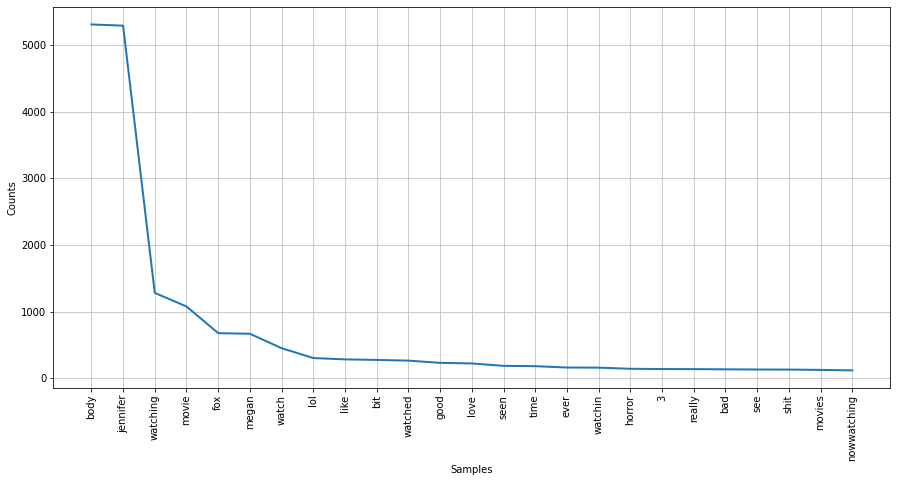

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [72]:
#line plot
fig, ax = plt.subplots(1,1, figsize=(15,8)) 
ax = fdist.plot(25, title="Most Common Words in Tweets About the Movie Jennifer's Body")

In [ ]:
# from fdist.most_common(25) seperate words and counts
jennifersbody_words = [x[0] for x in fdist.most_common(25)]
jennifersbody_counts = [x[1] for x in fdist.most_common(25)]

In [ ]:
fig, ax = plt.subplots(1,1, figsize=(15,8))

# matplotlib bar plot
ax.bar(jennifersbody_words, jennifersbody_counts, color=cm.viridis_r(np.linspace(.4,.8, 30)))
plt.xticks(rotation=90)
plt.xlabel('Words', fontsize = 17)
plt.ylabel('Frequency of Word', fontsize = 17)
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.title("Popular Words in Jennifer's Body Tweets", fontsize = 20)

plt.tight_layout(pad=0) #necessary - if not included extra text shows up

# plt.savefig('images/barjennifersbody.png')

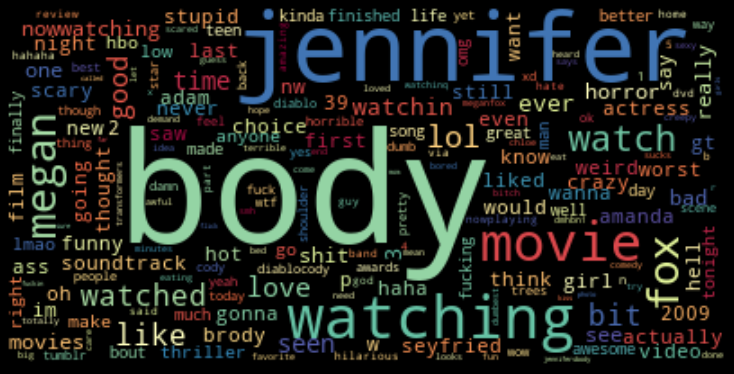

In [73]:
# Create the word cloud:

wordcloud = WordCloud(colormap='Spectral').generate_from_frequencies(fdist)

#use matplotlib to generate an image:

plt.figure(figsize=(10,10), facecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad=0)

# Uncomment the next line if you want to save your image:
# plt.savefig('images/cloudjennifersbody.png')

# The Shape of Water

In [11]:
#gather tweets from the movie The Shape of Water
c = twint.Config()
c.Search = "The Shape of Water"
c.Limit = 6000
c.Since = "2017-08-31" #released in America August 31, 2017
c.Until = "2018-08-31"
c.Pandas = True

# Uncommonet the following line to run
# twint.run.Search(c)

In [113]:
#create dataframe for tweets about The Shape of Water
df_7 = twint.storage.panda.Tweets_df
df_7.head()

,id,conversation_id,created_at,date,timezone,place,tweet,language,hashtags,cashtags,...,geo,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest
0,1034953714556006400,1034953714556006400,1.535587e+12,2018-08-29 19:59:28,-0500,,Fab and I watching shape of water together and...,en,[],[],...,,,,,,[],,,,
1,1034949574010519552,1034949574010519552,1.535586e+12,2018-08-29 19:43:01,-0500,,📷 hellohousemouse: the shape of water model: ...,en,[],[],...,,,,,,[],,,,
2,1034948712903176195,1034948712903176195,1.535586e+12,2018-08-29 19:39:36,-0500,,"""The Shape of Water is like alien Amelie, but ...",en,[],[],...,,,,,,[],,,,
3,1034948484460412928,1034909323510599685,1.535586e+12,2018-08-29 19:38:41,-0500,,@CharlieWSwain That couple in “The Shape Of Wa...,en,[],[],...,,,,,,[],,,,
4,1034948099045646336,1034948099045646336,1.535586e+12,2018-08-29 19:37:09,-0500,,"More power to him. Sure beats the spew, prais...",en,[],[],...,,,,,,[],,,,


In [114]:
# remove non-English tweets and observe remaining number of tweets
df_7 = df_7[df_7['language'] == 'en']
df_7.shape

(5133, 38)

Uncomment and run the next cell to save df_7 to a csv

In [115]:
# df_7.to_csv('df_7.csv')

In [116]:
#isolate tweets
tweets_Water = df_7['tweet'].values
tweets_Water

array(['Fab and I watching shape of water together and hating on the headass and his mustard fingers is the highlight of my day',
       '📷 hellohousemouse: the shape of water\xa0 model: @avery-vulpes rope+photo by me 🐭 Beautiful  https://t.co/pqZ7RZyAYv',
       '"The Shape of Water is like alien Amelie, but Amelie is better" - Me, still bitter that Get Out didn\'t win the Oscar',
       ..., 'The shape of water for development  https://t.co/1hTuE7xPL9',
       'Comic-Con 2018: NECA’s Show Floor Display Includes New GREMLINS, Chucky &amp; Tiffany, THE SHAPE OF WATER Figure, and More!  https://t.co/MIUxpdX6Mi  https://t.co/MV8NIiRqnQ',
       "I'm up past my bedtime watching The Shape of Water again."],
      dtype=object)

In [117]:
#tokenize isolated tweets
tokenized_tweets = []
for tweet in tweets_Water:
    tokenized_tweets.append(tokenizer.tokenize(tweet.lower())) #lowercase tweets to avoid duplicates

In [118]:
#isolate each word in The Shape of Water movie tweets
tweets = []
for tweet in tokenized_tweets:
    for word in tweet:
        if word not in stopwords_list: #exlude words in stop list
            tweets.append(word)  

tweets

['fab',
 'watching',
 'shape',
 'water',
 'together',
 'hating',
 'headass',
 'mustard',
 'fingers',
 'highlight',
 'day',
 'hellohousemouse',
 'shape',
 'water',
 'model',
 'avery',
 'vulpes',
 'rope',
 'photo',
 'beautiful',
 'pqz7rzyayv',
 'shape',
 'water',
 'like',
 'alien',
 'amelie',
 'amelie',
 'better',
 'still',
 'bitter',
 'win',
 'oscar',
 'charliewswain',
 'couple',
 'shape',
 'water',
 'baby',
 'grew',
 'become',
 '5',
 'star',
 'cornerback',
 'prospect',
 'spurs',
 'power',
 'sure',
 'beats',
 'spew',
 'praising',
 'trump',
 'coming',
 'costar',
 'searcy',
 'shape',
 'water',
 'wonder',
 'hit',
 'shape',
 'water',
 'premiered',
 'venice',
 'almost',
 'year',
 'ago',
 'hit',
 'theaters',
 'december',
 'make',
 'set',
 'one',
 'year',
 'anniversary',
 'movie',
 'make',
 'wait',
 'december',
 'jonander',
 'mo',
 'three',
 'billboards',
 'outside',
 'ebbing',
 'missouri',
 'columbus',
 'grandeur',
 'et',
 'cadence',
 'un',
 'petit',
 'commerce',
 'de',
 'cin',
 'shape',
 'wa

In [119]:
#frequency of words within The Shape of Water
fdist = FreqDist(tweets)

In [120]:
fdist.most_common(25)

[('water', 5276),
 ('shape', 5240),
 ('movie', 567),
 ('film', 453),
 ('like', 424),
 ('2017', 383),
 ('best', 358),
 ('del', 340),
 ('toro', 328),
 ('love', 328),
 ('movies', 303),
 ('fish', 298),
 ('guillermo', 295),
 ('one', 264),
 ('watching', 263),
 ('watched', 240),
 ('watch', 225),
 ('last', 219),
 ('really', 216),
 ('good', 216),
 ('2', 214),
 ('oscar', 211),
 ('picture', 206),
 ('nanotubes', 198),
 ('think', 196)]

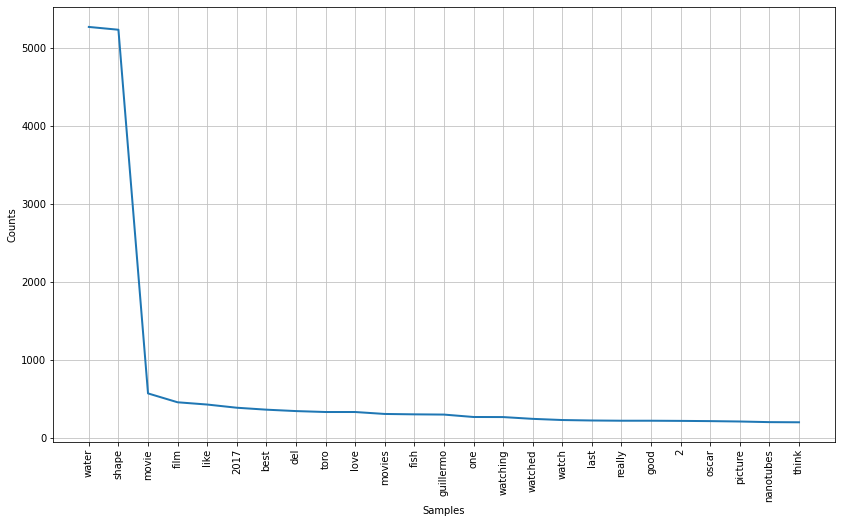

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [121]:
#line plot
fig, ax = plt.subplots(1,1, figsize=(15,8)) 
ax = fdist.plot(25, title="Most Common Words in Tweets About the Movie The Shape of Water")

In [ ]:
# from fdist.most_common(25) seperate words and counts
shapeofwater_words = [x[0] for x in fdist.most_common(25)]
shapeofwater_counts = [x[1] for x in fdist.most_common(25)]

In [ ]:
fig, ax = plt.subplots(1,1, figsize=(15,8))

# matplotlib bar plot
ax.bar(shapeofwater_words, shapeofwater_counts, color=cm.viridis_r(np.linspace(.4,.8, 30)))
plt.xticks(rotation=90)
plt.xlabel('Words', fontsize = 17)
plt.ylabel('Frequency of Word', fontsize = 17)
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.title('Popular Words in The Shape of Water Tweets', fontsize = 20)

plt.tight_layout(pad=0) #necessary - if not included extra text shows up

# plt.savefig('images/barshapeofwater.png')

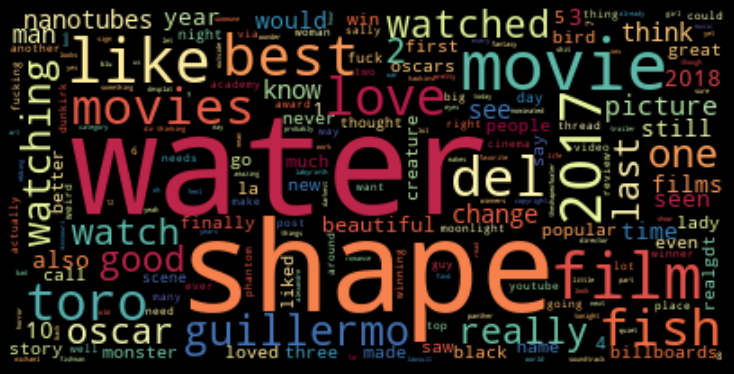

In [122]:
# Create the word cloud:

wordcloud = WordCloud(colormap='Spectral').generate_from_frequencies(fdist)

# use matplotlib to create image:

plt.figure(figsize=(10,10), facecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad=0)

# Uncomment the next line if you want to save your image:
# plt.savefig('images/cloudshapeofwater.png')

# The Big Short

In [12]:
#gather tweets from the movie The Big Short
c = twint.Config()
c.Search = "The Big Short"
c.Limit = 6500
c.Since = "2015-12-11" #release date: December 11, 2015
c.Until = "2016-12-11"
c.Pandas = True

# Uncommonet the following line to run
# twint.run.Search(c)

In [127]:
#create dataframe for The Big Short movie tweets
df_8 = twint.storage.panda.Tweets_df
df_8.head()

,id,conversation_id,created_at,date,timezone,place,tweet,language,hashtags,cashtags,...,geo,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest
0,807373756368875520,807373756368875520,1.481328e+12,2016-12-09 18:57:58,-0500,,"Just watched The Big Short. Fascinating film, ...",en,[thebigshort],[],...,,,,,,[],,,,
1,807373752367390720,807373752367390720,1.481328e+12,2016-12-09 18:57:57,-0500,,Roger Ailes-Megyn Kelly Harassment Film in the...,en,[],[],...,,,,,,[],,,,
2,807373279359094786,807373279359094786,1.481328e+12,2016-12-09 18:56:04,-0500,,The Big Short: is the next financial crisis on...,en,[],[],...,,,,,,[],,,,
3,807371439687036928,807368716904230920,1.481327e+12,2016-12-09 18:48:46,-0500,,@BreitbartNews will it be call the Big Short I...,en,[],[],...,,,,,,"[{'screen_name': 'BreitbartNews', 'name': 'Bre...",,,,
4,807370525689446400,807370525689446400,1.481327e+12,2016-12-09 18:45:08,-0500,,¿Cómo saber lo que pasa realmente en tu empres...,es,[aprende],[],...,,,,,,[],,,,


In [128]:
#drop non-English tweets and observe the remaining amount of tweets
df_8 = df_8[df_8['language'] == 'en']
df_8.shape

(5244, 38)

Uncomment and run the next cell to save the df_8 dataframe

In [129]:
# df_8.to_csv('df_8.csv')

In [130]:
#isolate tweets
tweets_BigShort = df_8['tweet'].values

In [131]:
#tokenize the isolated tweets
tokenized_tweets = []
for tweet in tweets_BigShort:
    tokenized_tweets.append(tokenizer.tokenize(tweet.lower())) #lowercase all tweets

In [132]:
#isolate individual words
tweets = []
for tweet in tokenized_tweets:
    for word in tweet:
        if word not in stopwords_list: #exclude stop words
            tweets.append(word)  

tweets

['watched',
 'big',
 'short',
 'fascinating',
 'film',
 'even',
 'comprehend',
 'dire',
 'situation',
 'economy',
 'almost',
 '10',
 'years',
 'ago',
 'thebigshort',
 'roger',
 'ailes',
 'megyn',
 'kelly',
 'harassment',
 'film',
 'works',
 'big',
 'short',
 'writer',
 'exclusive',
 'wjceoqspbv',
 'ui2zjsvq7y',
 'big',
 'short',
 'next',
 'financial',
 'crisis',
 'way',
 'xiv5se7l6g',
 'breitbartnews',
 'call',
 'big',
 'short',
 'ii',
 'shot',
 'rolling',
 'chocolate',
 'interested',
 'rewatching',
 'big',
 'short',
 'maybe',
 'pwqcfw74pw',
 'roger',
 'ailes',
 'megyn',
 'kelly',
 'harassment',
 'film',
 'works',
 'big',
 'short',
 'writer',
 'exclusive',
 'gyc0lrkqyx',
 'roger',
 'ailes',
 'megyn',
 'kelly',
 'harassment',
 'film',
 'works',
 'big',
 'short',
 'writer',
 'exclusive',
 '9m7oq4kyyr',
 'roger',
 'ailes',
 'megyn',
 'kelly',
 'harassment',
 'film',
 'works',
 'big',
 'short',
 'writer',
 'exclusive',
 'vnyzgj084f',
 'xle3ind26t',
 'roger',
 'ailes',
 'megyn',
 'kelly',
 

In [133]:
#frequency of words within The Big Short
fdist = FreqDist(tweets)

In [134]:
fdist.most_common(25)

[('big', 5367),
 ('short', 5309),
 ('movie', 821),
 ('financial', 566),
 ('next', 452),
 ('crisis', 433),
 ('watch', 397),
 ('way', 381),
 ('watching', 346),
 ('film', 337),
 ('watched', 312),
 ('michael', 299),
 ('lewis', 269),
 ('via', 263),
 ('new', 262),
 ('like', 245),
 ('inside', 240),
 ('good', 235),
 ('doomsday', 226),
 ('machine', 225),
 ('author', 222),
 ('book', 213),
 ('truth', 205),
 ('netflix', 195),
 ('crash', 185)]

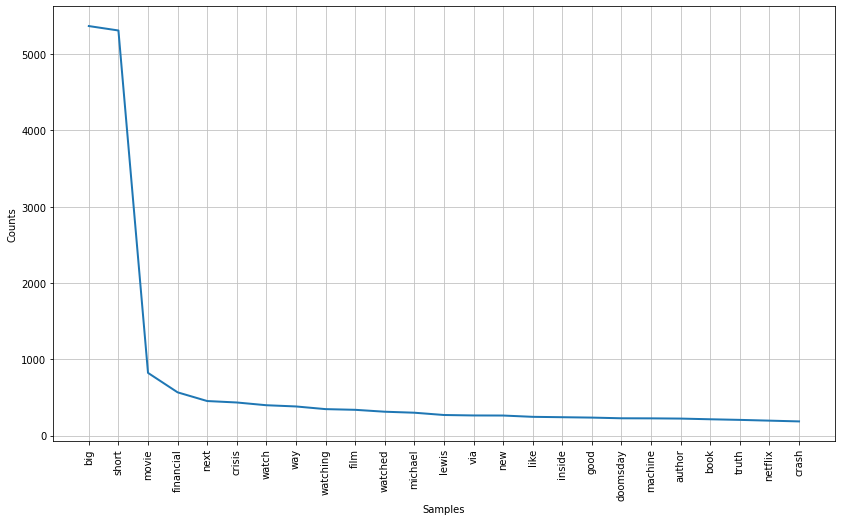

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [135]:
#line plot
fig, ax = plt.subplots(1,1, figsize=(15,8)) 
ax = fdist.plot(25, title="Most Common Words in Tweets About the Movie The Big Short")

In [ ]:
# from fdist.most_common(25) seperate words and counts
bigshort_words = [x[0] for x in fdist.most_common(25)]
bigshort_counts = [x[1] for x in fdist.most_common(25)]

In [ ]:
fig, ax = plt.subplots(1,1, figsize=(15,8))

# matplotlib bar plot
ax.bar(bigshort_words, bigshort_counts, color=cm.viridis_r(np.linspace(.4,.8, 30)))
plt.xticks(rotation=90)
plt.xlabel('Words', fontsize = 17)
plt.ylabel('Frequency of Word', fontsize = 17)
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.title('Popular Words in The Big Short Tweets', fontsize = 20)

plt.tight_layout(pad=0) #necessary - if not included extra text shows up

# plt.savefig('images/barbigshort.png')

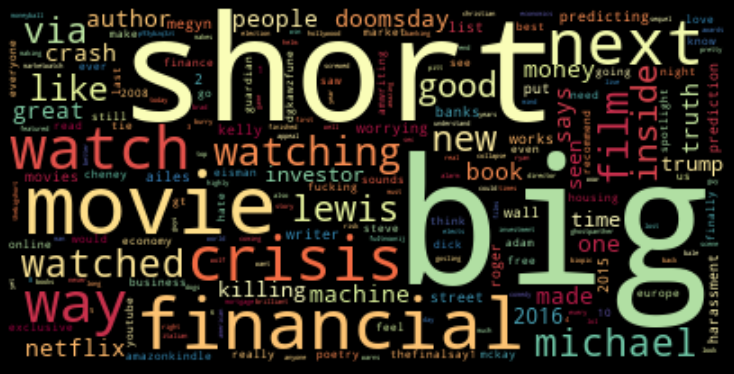

In [136]:
# Create the word cloud:

wordcloud = WordCloud(colormap='Spectral').generate_from_frequencies(fdist)

# generated image with matplotlib:

plt.figure(figsize=(10,10), facecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad=0)

# Uncomment the next line if you want to save your image:
# plt.savefig('images/cloudbigshort.png')

# Cloudy with a Chance of Meatballs

In [13]:
#gather tweets from the movie Cloudy with a Chance of Meatballs
c = twint.Config()
c.Search = "Cloudy with a Chance of Meatballs"
c.Limit = 5500
c.Since = "2009-09-18" #release date September 18, 2009
c.Until = "2010-09-18"
c.Pandas = True

# Uncommonet the following line to run
# twint.run.Search(c)

In [143]:
#create dataframe for tweets about Cloudy with a Chance of Meatballs
df_9 = twint.storage.panda.Tweets_df
df_9.head()

,id,conversation_id,created_at,date,timezone,place,tweet,language,hashtags,cashtags,...,geo,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest
0,24708919966,24708919966,1.284681e+12,2010-09-16 19:54:13,-0500,,Cloudy with a chance of meatballs :),en,[],[],...,,,,,,[],,,,
1,24707565423,24707565423,1.284680e+12,2010-09-16 19:35:21,-0500,,@redshiftlove cloudy with a chance of meatball...,en,[],[],...,,,,,,[],,,,
2,24698704201,24698704201,1.284672e+12,2010-09-16 17:27:08,-0500,,I think it is officially time for me to addres...,en,[],[],...,,,,,,[],,,,
3,24698154027,24698154027,1.284672e+12,2010-09-16 17:18:49,-0500,,I got Cloudy with a Chance of Meatballs on Blu...,en,[],[],...,,,,,,[],,,,
4,24698052801,24696504623,1.284672e+12,2010-09-16 17:17:17,-0500,,@Ollievoso like in Cloudy with a Chance of Mea...,en,[],[],...,,,,,,[],,,,


In [144]:
#only use english tweets and observe resulting amount of tweets
df_9 = df_9[df_9['language'] == 'en']
df_9.shape

(5377, 38)

Uncomment and run the next cell to save df_9

In [145]:
df_9.to_csv('df_9.csv')

In [146]:
#isolate tweets
tweets_Cloudy = df_9['tweet'].values

In [147]:
#tokenize isolate tweets
tokenized_tweets = []
for tweet in tweets_Cloudy:
    tokenized_tweets.append(tokenizer.tokenize(tweet.lower())) #lowercase tweets

In [148]:
#isolate individual words
tweets = []
for tweet in tokenized_tweets:
    for word in tweet:
        if word not in stopwords_list: #exclude words in stop list
            tweets.append(word)  

tweets

['cloudy',
 'chance',
 'meatballs',
 'redshiftlove',
 'cloudy',
 'chance',
 'meatballs',
 'think',
 'officially',
 'time',
 'address',
 'whole',
 'seen',
 'cloudy',
 'chance',
 'meatballs',
 'scenario',
 'cloudy',
 'chance',
 'meatballs',
 'blu',
 'ray',
 'woo',
 'ollievoso',
 'like',
 'cloudy',
 'chance',
 'meatballs',
 'would',
 'awesome',
 'cloudy',
 'chance',
 'meatballs',
 'funniest',
 'movie',
 'see',
 'watching',
 'cloudy',
 'chance',
 'meatballs',
 'w',
 '3',
 'year',
 'old',
 'dig',
 'kid',
 'shows',
 'next',
 'icarly',
 'beginning',
 'cloudy',
 'chance',
 'meatballs',
 'movie',
 'makes',
 'wanna',
 'cry',
 'childhood',
 'right',
 'thur',
 'cloudy',
 'chance',
 'meatballs',
 'blu',
 'ray',
 '3d',
 'cloudy',
 'chance',
 'meatballs',
 'available',
 'amazon',
 'bit',
 'bisqk4',
 'cloudy',
 'chance',
 'meatballs',
 'blu',
 'ray',
 '3d',
 'i4u',
 'bit',
 'bsodne',
 'mom',
 'says',
 'cloudy',
 'chance',
 'meatballs',
 'dinner',
 'cool',
 'watching',
 'cloudy',
 'chance',
 'meatballs

In [149]:
#frequency of words within Cloudy with a Chance of Meatballs
fdist = FreqDist(tweets)

In [150]:
#25 most common words in Cloudy with a Chance of Meatballs
fdist.most_common(25)

[('cloudy', 5478),
 ('chance', 5450),
 ('meatballs', 5445),
 ('watching', 1123),
 ('movie', 811),
 ('bit', 384),
 ('watch', 328),
 ('dvd', 286),
 ('lol', 258),
 ('good', 223),
 ('watched', 201),
 ('love', 197),
 ('park', 191),
 ('tonight', 173),
 ('time', 171),
 ('night', 166),
 ('3', 164),
 ('p', 159),
 ('like', 158),
 ('free', 150),
 ('3d', 147),
 ('movies', 145),
 ('great', 140),
 ('funny', 140),
 ('ray', 131)]

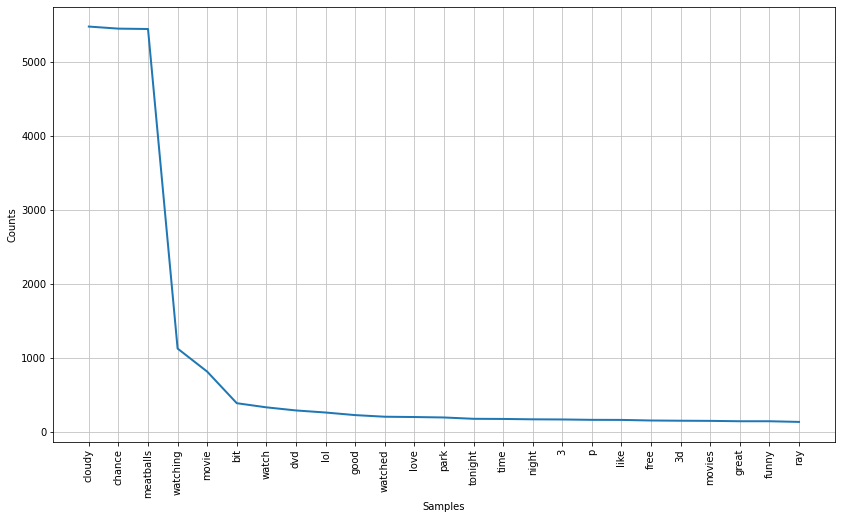

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [151]:
#line plot
fig, ax = plt.subplots(1,1, figsize=(15,8)) 
ax = fdist.plot(25, title="Most Common Words in Tweets About the Movie Cloudy with a Chance of Meatballs")

In [ ]:
# from fdist.most_common(25) seperate words and counts
cloudy_words = [x[0] for x in fdist.most_common(25)]
cloudy_counts = [x[1] for x in fdist.most_common(25)]

In [ ]:
fig, ax = plt.subplots(1,1, figsize=(15,8))

# matplotlib bar plot
ax.bar(cloudy_words, cloudy_counts, color=cm.viridis_r(np.linspace(.4,.8, 30)))
plt.xticks(rotation=90)
plt.xlabel('Words', fontsize = 17)
plt.ylabel('Frequency of Word', fontsize = 17)
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.title('Popular Words in Cloudy with a Chance of Meatballs Tweets', fontsize = 20)

plt.tight_layout(pad=0) #necessary - if not included extra text shows up

# plt.savefig('images/barcloudymeatballs.png')

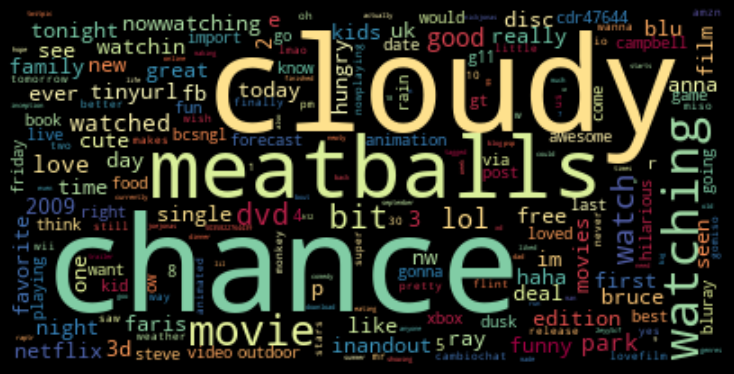

In [152]:
# Create the word cloud:

wordcloud = WordCloud(colormap='Spectral').generate_from_frequencies(fdist)

# matplotlib image:

plt.figure(figsize=(10,10), facecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad=0)

# Uncomment the next line if you want to save your image:
# plt.savefig('images/cloudmeatballs.png')

# WallE

In [14]:
#gather tweets from the movie Wall-E
c = twint.Config()
c.Search = "Wall-E"
c.Limit = 6000
c.Since = "2008-06-27" #release date June 27, 2008
c.Until = "2009-06-27"
c.Pandas = True

# Uncommonet the following line to run
# twint.run.Search(c)

In [154]:
#convert to dataframe
df_10 = twint.storage.panda.Tweets_df
df_10.head()

,id,conversation_id,created_at,date,timezone,place,tweet,language,hashtags,cashtags,...,geo,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest
0,2335385400,2335385400,1.245974e+12,2009-06-25 19:54:38,-0500,,A dormir despues de haber visto Wall-E con una...,es,[],[],...,,,,,,[],,,,
1,2335057043,2335057043,1.245973e+12,2009-06-25 19:37:09,-0500,,Breaking News: Wall-E's battier has run out. H...,en,[],[],...,,,,,,[],,,,
2,2334867645,2334867645,1.245972e+12,2009-06-25 19:27:14,-0500,,"I think my mind is too complex for WALL-E, @wu...",en,[],[],...,,,,,,[],,,,
3,2334778357,2334778357,1.245972e+12,2009-06-25 19:22:26,-0500,,Bout to watch Wall-e the best movie ever!!!!,en,[],[],...,,,,,,[],,,,
4,2334748248,2334748248,1.245972e+12,2009-06-25 19:20:48,-0500,,Finally home full of micky d's n watchn wall-e,en,[],[],...,,,,,,[],,,,


In [155]:
# remove non-English tweets
df_10 = df_10[df_10['language'] == 'en']
df_10.shape

(5367, 38)

Uncomment and run the following cell to save df_10 csv

In [156]:
# df_10.to_csv('df_10.csv')

In [158]:
#tokenize isolated tweets
tokenized_tweets = []
for tweet in df_10['tweet'].values:
    tokenized_tweets.append(tokenizer.tokenize(tweet.lower()))

In [159]:
#isolate individual words
tweets = []
for tweet in tokenized_tweets:
    for word in tweet:
        if word not in stopwords_list:
            tweets.append(word)  

tweets

['breaking',
 'news',
 'wall',
 'e',
 'battier',
 'run',
 'found',
 'transport',
 'watching',
 'hello',
 'dolly',
 'wife',
 'year',
 'eve',
 'rip',
 'wall',
 'e',
 'think',
 'mind',
 'complex',
 'wall',
 'e',
 'wutendeskind',
 'bout',
 'watch',
 'wall',
 'e',
 'best',
 'movie',
 'ever',
 'finally',
 'home',
 'full',
 'micky',
 'n',
 'watchn',
 'wall',
 'e',
 'erinichristine',
 'word',
 'wall',
 'e',
 'danieljohnhall',
 'must',
 'say',
 'finding',
 'nemo',
 'look',
 'pretty',
 'crap',
 'try',
 'wall',
 'e',
 'see',
 'goes',
 'saw',
 'transformers',
 '2',
 'wall',
 'e',
 'better',
 'cgi',
 'zak',
 'designs',
 'disney',
 'pixar',
 'wall',
 'e',
 '3',
 'piece',
 'dinnerware',
 'set',
 'bit',
 'dxxcw',
 'wall',
 'e',
 'blu',
 'ray',
 'couple',
 'hours',
 'ago',
 'greater',
 'level',
 'detail',
 'would',
 'probably',
 'look',
 'completely',
 'horrible',
 'wall',
 'e',
 'perfect',
 'watching',
 'wall',
 'e',
 'kid',
 'every',
 'pixel',
 'lovingly',
 'rendered',
 'via',
 'blu',
 'ray',
 'waiti

In [160]:
#frequency of words within Wall-E
fdist = FreqDist(tweets)

In [161]:
fdist.most_common(25)

[('e', 5585),
 ('wall', 5567),
 ('watching', 1041),
 ('movie', 672),
 ('watch', 406),
 ('good', 378),
 ('love', 359),
 ('like', 341),
 ('pixar', 329),
 ('time', 310),
 ('bit', 299),
 ('watched', 282),
 ('cute', 260),
 ('saw', 225),
 ('better', 208),
 ('see', 206),
 ('tinyurl', 203),
 ('seen', 201),
 ('great', 182),
 ('3', 181),
 ('one', 180),
 ('movies', 175),
 ('still', 175),
 ('think', 166),
 ('best', 165)]

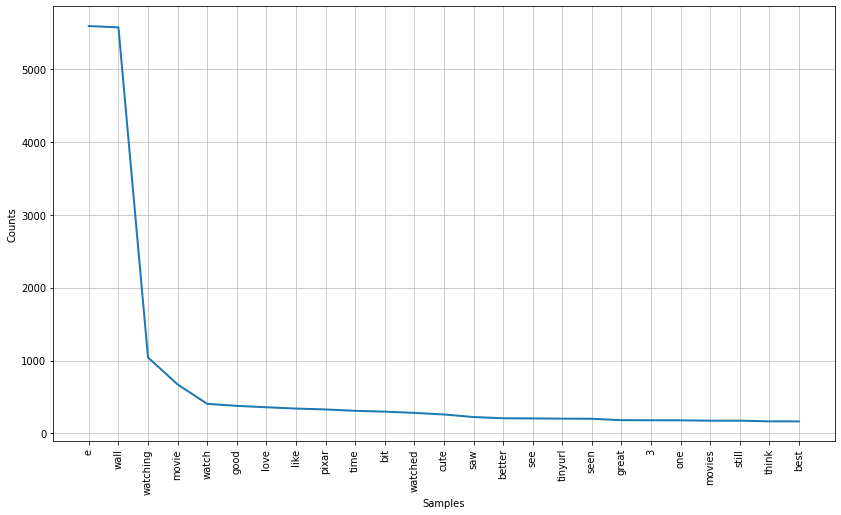

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [162]:
#line plot
fig, ax = plt.subplots(1,1, figsize=(15,8)) 
ax = fdist.plot(25, title="Most Common Words in Tweets About the Movie Wall-E")

In [ ]:
# from fdist.most_common(25) seperate words and counts
walle_words = [x[0] for x in fdist.most_common(25)]
walle_counts = [x[1] for x in fdist.most_common(25)]

In [ ]:
fig, ax = plt.subplots(1,1, figsize=(15,8))

# matplotlib bar plot
ax.bar(walle_words, wa_counts, color=cm.viridis_r(np.linspace(.4,.8, 30)))
plt.xticks(rotation=90)
plt.xlabel('Words', fontsize = 17)
plt.ylabel('Frequency of Word', fontsize = 17)
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.title('Popular Words in Wall-E Tweets', fontsize = 20)

plt.tight_layout(pad=0) #necessary - if not included extra text shows up

# plt.savefig('images/barwalle.png')

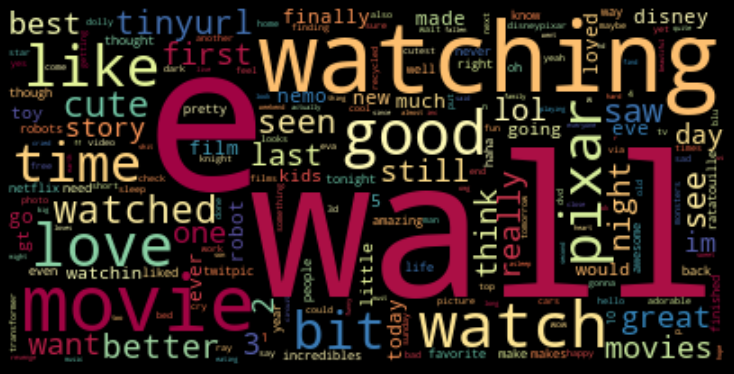

In [163]:
# Create the word cloud:

wordcloud = WordCloud(colormap='Spectral').generate_from_frequencies(fdist)

# Generate image:

plt.figure(figsize=(10,10), facecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad=0)

# Uncomment the next line if you want to save your image:
# plt.savefig('images/cloudwalle.png')

# Slumdog Millionaire

In [15]:
#gather tweets from the movie Slumdog Millionaire
c = twint.Config()
c.Search = "Slumdog Millionaire"
c.Limit = 6000
c.Since = "2008-11-12" #release date November 12, 2008
c.Until = "2009-11-12"
c.Pandas = True

# Uncommonet the following line to run
# twint.run.Search(c)

In [165]:
df_11 = twint.storage.panda.Tweets_df
df_11.head()

,id,conversation_id,created_at,date,timezone,place,tweet,language,hashtags,cashtags,...,geo,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest
0,5603611789,5603611789,1.257897e+12,2009-11-10 18:53:04,-0500,,confirmado: precious es mi (la?) slumdog milli...,es,[],[],...,,,,,,[],,,,
1,5603007478,5602855359,1.257896e+12,2009-11-10 18:29:55,-0500,,@krael52 because shravani and keethi want to p...,en,[],[],...,,,,,,[],,,,
2,5602137272,5602137272,1.257894e+12,2009-11-10 17:56:36,-0500,,Outside with sam jefferson and my big sis... c...,en,[],[],...,,,,,,[],,,,
3,5601420853,5601420853,1.257892e+12,2009-11-10 17:29:05,-0500,,@1heavenlyflower: OMG! my favorite movie.........,en,[],[],...,,,,,,[],,,,
4,5601188041,5601188041,1.257892e+12,2009-11-10 17:20:07,-0500,,"Crapola News!, Slumdog Millionaire grabs 5 nod...",en,[],[],...,,,,,,[],,,,


In [166]:
# remove non-English tweets and observe shape
df_11 = df_11[df_11['language'] == 'en']
df_11.shape

(5285, 38)

Uncomment and run the following cell to save df_11 to a csv

In [167]:
# df_11.to_csv('df_11.csv')

In [168]:
#isolate Slumdog Millionaire tweets
tweets_SM = df_11['tweet'].values

In [169]:
#tokenize each tweet
tokenized_tweets = []
for tweet in tweets_SM:
    tokenized_tweets.append(tokenizer.tokenize(tweet.lower()))

In [170]:
#isolate individual words
tweets = []
for tweet in tokenized_tweets:
    for word in tweet:
        if word not in stopwords_list:
            tweets.append(word)  

tweets

['krael52',
 'shravani',
 'keethi',
 'want',
 'play',
 'wanty',
 'beat',
 'become',
 'slumdog',
 'millionaire',
 'way',
 'myloc',
 '1rdkx',
 'outside',
 'sam',
 'jefferson',
 'big',
 'sis',
 'chillin',
 'porch',
 'bout',
 'watch',
 'slumdog',
 'millionaire',
 '1heavenlyflower',
 'omg',
 'favorite',
 'movie',
 'slumdog',
 'millionaire',
 'crapola',
 'news',
 'slumdog',
 'millionaire',
 'grabs',
 '5',
 'nods',
 'european',
 'b',
 'gt',
 'film',
 'b',
 'gt',
 'awards',
 'tinyurl',
 'y8ufplg',
 'standing',
 'line',
 'lparaggio',
 'visa',
 'slumdog',
 'millionaire',
 'written',
 'twitpic',
 'p1f2j',
 'watching',
 'slumdog',
 'millionaire',
 'sleeping',
 'life',
 'away',
 '30',
 'min',
 'slumdog',
 'millionaire',
 'really',
 'impressed',
 'hell',
 'see',
 'one',
 'finally',
 'saw',
 'slumdog',
 'millionaire',
 'screening',
 'slumdog',
 'millionaire',
 'today',
 '4pm',
 'vadm',
 '110',
 'free',
 'wsu',
 'vancouver',
 'campus',
 'reading',
 'project',
 'bit',
 '1a9cdt',
 'need',
 'go',
 'naw',

In [171]:
#frequency of words within Slumdog Millionaire
fdist = FreqDist(tweets)

In [172]:
fdist.most_common(25)

[('slumdog', 5299),
 ('millionaire', 5173),
 ('movie', 1201),
 ('watching', 1126),
 ('bit', 882),
 ('good', 537),
 ('watch', 440),
 ('kids', 383),
 ('time', 377),
 ('watched', 339),
 ('school', 307),
 ('love', 297),
 ('great', 275),
 ('new', 269),
 ('like', 267),
 ('finally', 234),
 ('watchin', 231),
 ('lol', 223),
 ('lie', 199),
 ('marketing', 198),
 ('kim', 195),
 ('klaver', 195),
 ('stars', 191),
 ('film', 189),
 ('see', 182)]

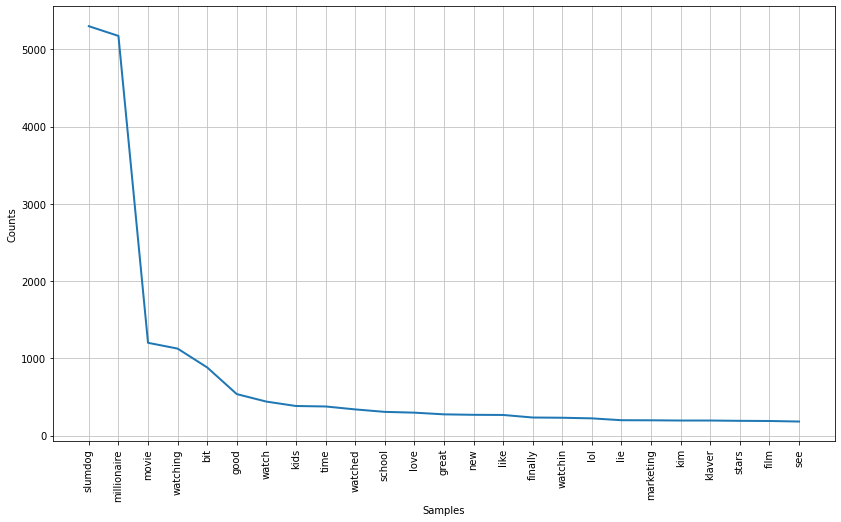

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [173]:
#plot 25 most tweeted words about Slumdog Millionaire
fig, ax = plt.subplots(1,1, figsize=(15,8)) 
ax = fdist.plot(25, title="Most Common Words in Tweets About the Movie Slumdog Millionaire")

In [ ]:
# from fdist.most_common(25) seperate words and counts
slumdogmillionaire_words = [x[0] for x in fdist.most_common(25)]
slumdogmillionaire_counts = [x[1] for x in fdist.most_common(25)]

In [ ]:
fig, ax = plt.subplots(1,1, figsize=(15,8))

# matplotlib bar plot
ax.bar(slumdogmillionaire_words, slumdogmillionaire_counts, color=cm.viridis_r(np.linspace(.4,.8, 30)))
plt.xticks(rotation=90)
plt.xlabel('Words', fontsize = 17)
plt.ylabel('Frequency of Word', fontsize = 17)
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.title('Popular Words in Slumdog Millionaire Tweets', fontsize = 20)

plt.tight_layout(pad=0) #necessary - if not included extra text shows up

# plt.savefig('images/barslumdogmillionaire.png')

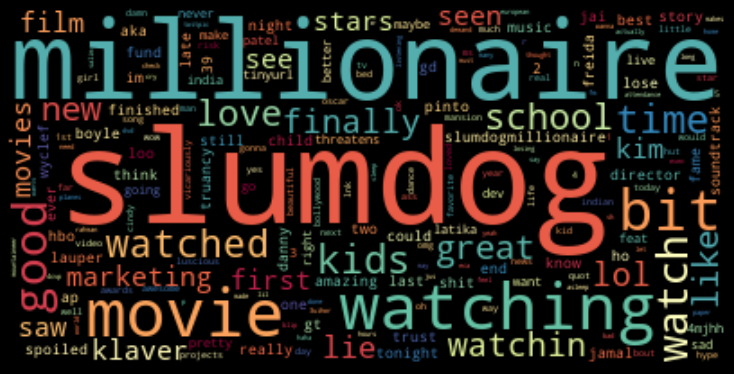

In [174]:
# Create the word cloud:

wordcloud = WordCloud(colormap='Spectral').generate_from_frequencies(fdist)

# Display the generated image w/ matplotlib:

plt.figure(figsize=(10,10), facecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad=0)

# Uncomment the next line if you want to save your image:
# plt.savefig('images/cloudslumdog.png')

# Bird Box

In [16]:
#gather tweets from the movie Bird Box
c = twint.Config()
c.Search = "Bird Box"
c.Limit = 7000
c.Since = "2018-12-14" #released December 14, 2018
c.Until = "2019-12-14"
c.Pandas = True

# Uncommonet the following line to run
# twint.run.Search(c)

In [176]:
#create Bird Box dataframe
df_12 = twint.storage.panda.Tweets_df

In [177]:
#remove non-English tweets and observe how many tweets remain
df_12 = df_12[df_12['language'] == 'en']
df_12.shape

(5250, 38)

Uncomment and run the following cell to save df_12 to a csv

In [178]:
# df_12.to_csv('df_12.csv')

In [179]:
#isolate tweets
tweets_BirdBox = df_12['tweet'].values

In [180]:
#tokenize tweets
tokenized_tweets = []
for tweet in tweets_BirdBox:
    tokenized_tweets.append(tokenizer.tokenize(tweet.lower()))

In [181]:
#isolate individual tweets
tweets = []
for tweet in tokenized_tweets:
    for word in tweet:
        if word not in stopwords_list:
            tweets.append(word)  

tweets

['lil',
 'natty',
 'thunda',
 'ft',
 'travis',
 'world',
 'julius',
 'czar',
 'go',
 'bird',
 'box',
 'riddim',
 '2019',
 'soca',
 'playing',
 'caribbeansessions',
 'o1dmha3nlh',
 'soca',
 '24',
 '7',
 'pressplay',
 'also',
 'stopped',
 'ended',
 'buying',
 'angry',
 'birds',
 'star',
 'wars',
 'x',
 'box',
 'game',
 'yeah',
 'gonna',
 'fun',
 'weekend',
 'worry',
 'know',
 'really',
 'well',
 'part',
 'really',
 'wants',
 'eat',
 'whole',
 'box',
 'doughnuts',
 'hmkahtalmk',
 'k',
 'news',
 'olympia',
 'underground',
 'record',
 'label',
 'fair',
 'birds',
 'fruit',
 '2020',
 'calendar',
 'olympia',
 'cassette',
 'tapes',
 'beat',
 'happening',
 'lp',
 'box',
 'set',
 'julie',
 'doiron',
 'canta',
 'en',
 'espa',
 'ol',
 'kvj7vtmdns',
 'kzfnvux7nn',
 'ruthsbestboy',
 'like',
 'commission',
 'year',
 'round',
 'box',
 'sabrina',
 'toys',
 'treats',
 'home',
 'time',
 'human',
 'feeling',
 'love',
 'hear',
 'thoughts',
 'best',
 'design',
 'sabrina',
 'tortie',
 'lots',
 'copper',
 'col

In [182]:
#frequency of words within Bird Box
fdist = FreqDist(tweets)

In [183]:
#25 most common
fdist.most_common(25)

[('box', 4283),
 ('bird', 3828),
 ('news', 1271),
 ('birdbox', 1147),
 ('today', 717),
 ('usa', 682),
 ('netflix', 606),
 ('birds', 494),
 ('like', 483),
 ('last', 452),
 ('amazon', 374),
 ('google', 367),
 ('health', 363),
 ('credit', 362),
 ('karma', 361),
 ('survival', 360),
 ('inssurance', 358),
 ('quotes', 358),
 ('mesothelioma', 356),
 ('trump', 350),
 ('rates', 279),
 ('movie', 257),
 ('latestnews', 224),
 ('watch', 219),
 ('one', 212)]

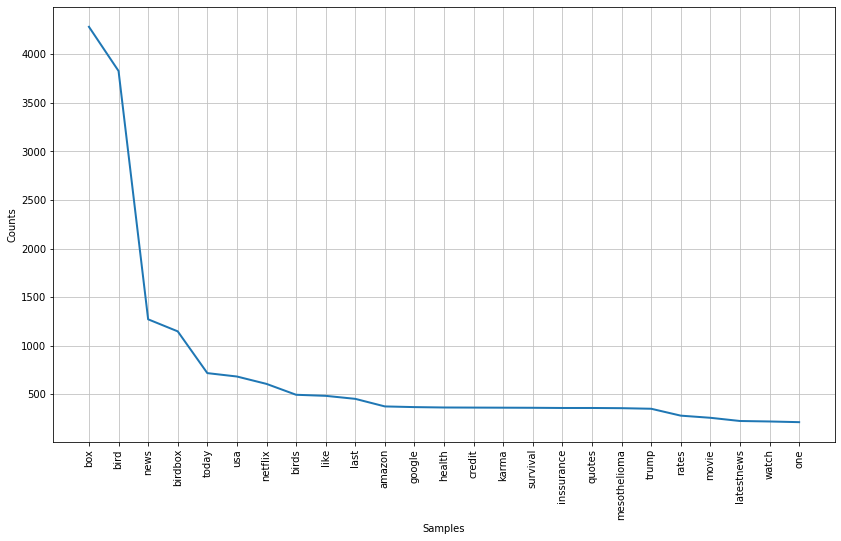

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [184]:
#plot top 25 words
fig, ax = plt.subplots(1,1, figsize=(15,8)) 
ax = fdist.plot(25, title="Most Common Words in Tweets About the Movie Bird Box")

In [ ]:
# from fdist.most_common(25) seperate words and counts
birdbox_words = [x[0] for x in fdist.most_common(25)]
birdbox_counts = [x[1] for x in fdist.most_common(25)]

In [ ]:
fig, ax = plt.subplots(1,1, figsize=(15,8))

# matplotlib bar plot
ax.bar(birdbox_words, birdbox_counts, color=cm.viridis_r(np.linspace(.4,.8, 30)))
plt.xticks(rotation=90)
plt.xlabel('Words', fontsize = 17)
plt.ylabel('Frequency of Word', fontsize = 17)
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.title('Popular Words in Bird Box Tweets', fontsize = 20)

plt.tight_layout(pad=0) #necessary - if not included extra text shows up

# plt.savefig('images/barbirdbox.png')

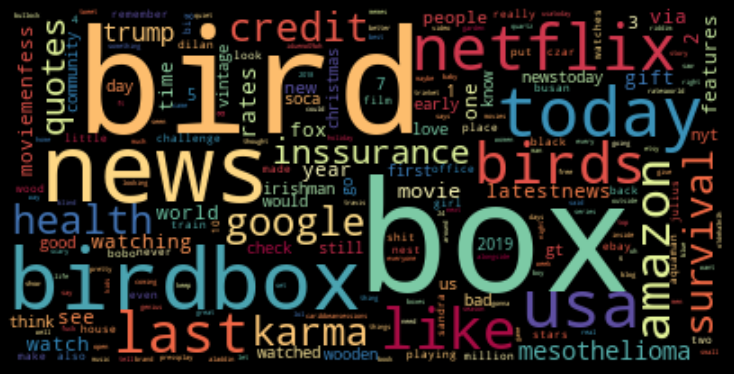

In [185]:
# Create the word cloud
wordcloud = WordCloud(colormap='Spectral').generate_from_frequencies(fdist)

# create matplotlib image 
plt.figure(figsize=(10,10), facecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad=0)

# Uncomment the next line if you want to save your image:
# plt.savefig('images/cloudbirdbox.png')

# Silver Linings Playbook

In [17]:
#gather tweets from the movie Silver Linings Playbook
c = twint.Config()
c.Search = "Silver Linings Playbook"
c.Limit = 6000
c.Since = "2012-11-16" #released November 16, 2012
c.Until = "2013-11-16"
c.Pandas = True

# Uncommonet the following line to run
# twint.run.Search(c)

In [187]:
#create Silver Linings Playbook dataframe
df_13 = twint.storage.panda.Tweets_df

In [188]:
#remove non-English tweets from the dataframe
df_13 = df_13[df_13['language'] == 'en']
df_13.shape #shape after non-English tweets are removed

(5277, 38)

Uncomment and run the following cell to save df_13 to a csv

In [189]:
# df_13.to_csv('df_13.csv')

In [190]:
#tokenize isolated tweets
tokenized_tweets = []
for tweet in df_13['tweet'].values:
    tokenized_tweets.append(tokenizer.tokenize(tweet.lower()))

In [191]:
#isolate each word in tweet
tweets = []
for tweet in tokenized_tweets:
    for word in tweet:
        if word not in stopwords_list:
            tweets.append(word)  

tweets

['silver',
 'linings',
 'playbook',
 'basically',
 'im',
 'awesome',
 'day',
 'write',
 'book',
 'right',
 'opening',
 'quote',
 'would',
 'nothing',
 'love',
 'brother',
 'pat',
 'silver',
 'linings',
 'playbook',
 'finally',
 'watching',
 'silverliningsplaybook',
 'silver',
 'linings',
 'playbook',
 'four',
 'good',
 'things',
 'election',
 'alp',
 'hmnqoortis',
 'silver',
 'linings',
 'playbook',
 'gets',
 'solid',
 '8',
 '10',
 'silver',
 'linings',
 'playbook',
 'silver',
 'linings',
 'playbook',
 'bit',
 'silver',
 'linings',
 'playbook',
 'yessss',
 'silver',
 'linings',
 'playbook',
 'messed',
 'makes',
 'question',
 'family',
 'mental',
 'stability',
 'love',
 'silver',
 'linings',
 'playbook',
 'fucking',
 'wonderful',
 'darrengoldsmith',
 'silver',
 'linings',
 'playbook',
 'great',
 'rachelkareta',
 'caellum',
 'allan',
 'jacquie',
 'silver',
 'linings',
 'playbook',
 'teaching',
 'old',
 'man',
 'sea',
 'keep',
 'referring',
 'silver',
 'linings',
 'playbook',
 'perfect',


In [192]:
#frequency of words within Silver Linings Playbook
FreqDist(tweets).most_common(25)

[('silver', 4857),
 ('linings', 4831),
 ('playbook', 4816),
 ('movie', 630),
 ('watching', 625),
 ('silverliningsplaybook', 494),
 ('watch', 419),
 ('good', 393),
 ('film', 329),
 ('love', 310),
 ('watched', 278),
 ('jennifer', 262),
 ('lawrence', 262),
 ('time', 223),
 ('cooper', 220),
 ('like', 219),
 ('gt', 219),
 ('bradley', 216),
 ('one', 188),
 ('great', 172),
 ('best', 171),
 ('movies', 170),
 ('3', 139),
 ('really', 131),
 ('favorite', 128)]

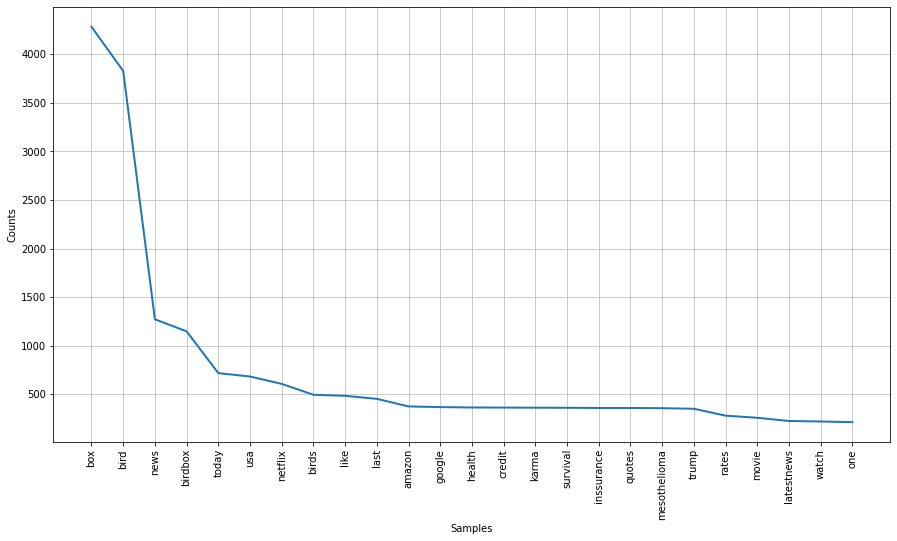

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [193]:
#plot 25 most common words in Silver Linings Playbook
fig, ax = plt.subplots(1,1, figsize=(15,8)) 
ax = fdist.plot(25, title="Most Common Words in Tweets About the Movie Silver Linings Playbook")

In [ ]:
# from fdist.most_common(25) seperate words and counts
silver_words = [x[0] for x in fdist.most_common(25)]
silver_counts = [x[1] for x in fdist.most_common(25)]

In [ ]:
fig, ax = plt.subplots(1,1, figsize=(15,8))

# matplotlib bar plot
ax.bar(silver_words, silver_counts, color=cm.viridis_r(np.linspace(.4,.8, 30)))
plt.xticks(rotation=90)
plt.xlabel('Words', fontsize = 17)
plt.ylabel('Frequency of Word', fontsize = 17)
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.title('Popular Words in Silver Linings Playbook Tweets', fontsize = 20)

plt.tight_layout(pad=0) #necessary - if not included extra text shows up

# plt.savefig('images/bar17silver.png')

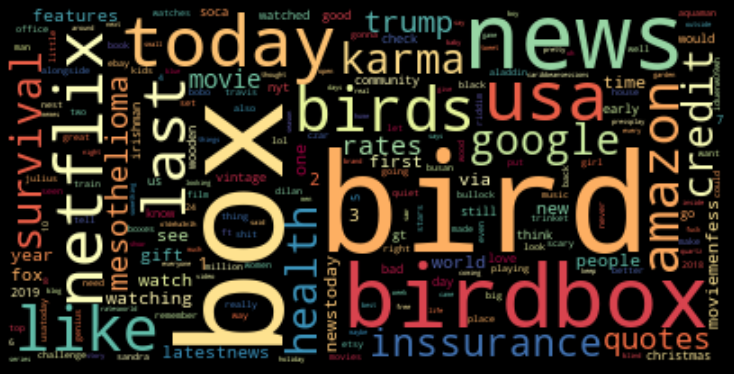

In [194]:
# Create the word cloud:

wordcloud = WordCloud(colormap='Spectral').generate_from_frequencies(fdist)

# Display image:

plt.figure(figsize=(10,10), facecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad=0)

# Uncomment the next line if you want to save your image:
# plt.savefig('images/cloudsilverplaybook.png')

# Django Unchained

In [18]:
#gather tweets from the movie Django Unchained
c = twint.Config()
c.Search = "Django Unchained"
c.Limit = 6500
c.Since = "2012-12-25" #released December 15, 2012
c.Until = "2013-12-25"
c.Pandas = True

# Uncommonet the following line to run
# twint.run.Search(c)

In [89]:
#create Django Unchained dataframe
df_14 = twint.storage.panda.Tweets_df

In [90]:
#remove non-Engish tweets
df_14 = df_14[df_14['language'] == 'en']

In [91]:
#observe how many tweets remain
df_14.shape

(4905, 38)

Uncomment and run the following cell to save df_14 to a csv

In [92]:
# df_14.to_csv('df_14.csv')

In [94]:
#tokenize tweets
tokenized_tweets = []
for tweet in df_14['tweet'].values:
    tokenized_tweets.append(tokenizer.tokenize(tweet.lower())) #make each tweet lowercase to avoid duplicates
       
print(tokenized_tweets)

[['django', 'unchained', 'is', 'brilliant', 'topfilm'], ['every', '10', 'seconds', 'in', 'django', 'unchained', 'you', 'hear', 'the', 'word', 'nigger'], ['cause', 'i', 'will', 'be', 'a', 'problem', 'i', 'm', 'talking', 'django', 'unchained'], ['white', 'house', 'down', 'man', 'of', 'steel', 'monsters', 'university', 'the', 'lone', 'ranger', 'the', 'hunger', 'games', 'django', 'unchained', 'the', 'cabin', 'in', 'the', 'woods'], ['on', 'a', 'movie', 'scale', 'of', 'm', 'night', 'shamalyans', 'the', 'village', 'to', 'django', 'unchained', 'i', 'put', 'american', 'hustle', 'right', 'above', 'inglorious', 'bastards'], ['top', '10', 'films', 'of', '2013', '10', 'thor', 'the', 'dark', 'world', '9', 'the', 'conjuring', '8', 'philomena', '7', 'warm', 'bodies', '6', 'django', 'unchained'], ['i', 'was', 'just', 'talking', 'about', 'lincoln', 'and', 'mom', 'made', 'a', 'django', 'unchained', 'reference', 'i', 'm', 'so', 'confused', 'holidaysarehard', 'popculturemama'], ['who', 'did', 'that', 'to',

In [95]:
#isolate each word
tweets = []
for tweet in tokenized_tweets:
    for word in tweet:
        if word not in stopwords_list: #don't include stop words in list
            tweets.append(word)  

tweets

['django',
 'unchained',
 'brilliant',
 'topfilm',
 'every',
 '10',
 'seconds',
 'django',
 'unchained',
 'hear',
 'word',
 'nigger',
 'cause',
 'problem',
 'talking',
 'django',
 'unchained',
 'white',
 'house',
 'man',
 'steel',
 'monsters',
 'university',
 'lone',
 'ranger',
 'hunger',
 'games',
 'django',
 'unchained',
 'cabin',
 'woods',
 'movie',
 'scale',
 'night',
 'shamalyans',
 'village',
 'django',
 'unchained',
 'put',
 'american',
 'hustle',
 'right',
 'inglorious',
 'bastards',
 'top',
 '10',
 'films',
 '2013',
 '10',
 'thor',
 'dark',
 'world',
 '9',
 'conjuring',
 '8',
 'philomena',
 '7',
 'warm',
 'bodies',
 '6',
 'django',
 'unchained',
 'talking',
 'lincoln',
 'mom',
 'made',
 'django',
 'unchained',
 'reference',
 'confused',
 'holidaysarehard',
 'popculturemama',
 'django',
 'unchained',
 'soundtrack',
 'john',
 'legend',
 '9aen7l3wop',
 'nrgradioalbania',
 'listenlive',
 'many',
 'times',
 'say',
 'nigga',
 'djangounchained',
 'counting',
 'bbcr1rhianna',
 'top',


In [96]:
#frequency of words within Django Unchained
fdist = FreqDist(tweets)

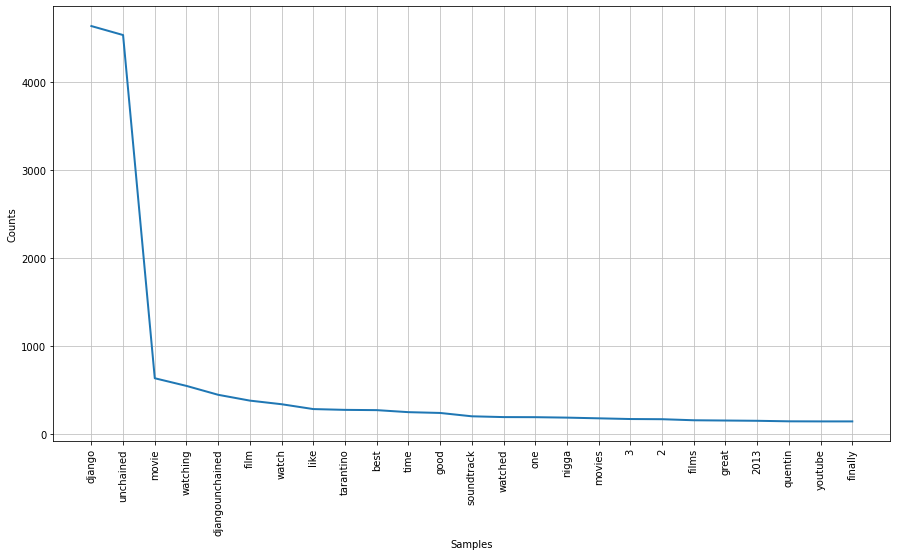

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [97]:
#plot top 25 words used in tweets about Django Unchained
fig, ax = plt.subplots(1,1, figsize=(15,8)) 
ax = fdist.plot(25, title="Most Common Words in Tweets About the Movie Django Unchained")

In [ ]:
# from fdist.most_common(25) seperate words and counts
django_words = [x[0] for x in fdist.most_common(25)]
django_counts = [x[1] for x in fdist.most_common(25)]

In [ ]:
fig, ax = plt.subplots(1,1, figsize=(15,8))

# matplotlib bar plot
ax.bar(django_words, django_counts, color=cm.viridis_r(np.linspace(.4,.8, 30)))
plt.xticks(rotation=90)
plt.xlabel('Words', fontsize = 17)
plt.ylabel('Frequency of Word', fontsize = 17)
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.title('Popular Words in Django Unchained Tweets', fontsize = 20)

plt.tight_layout(pad=0) #necessary - if not included extra text shows up

# plt.savefig('images/bardjango.png')

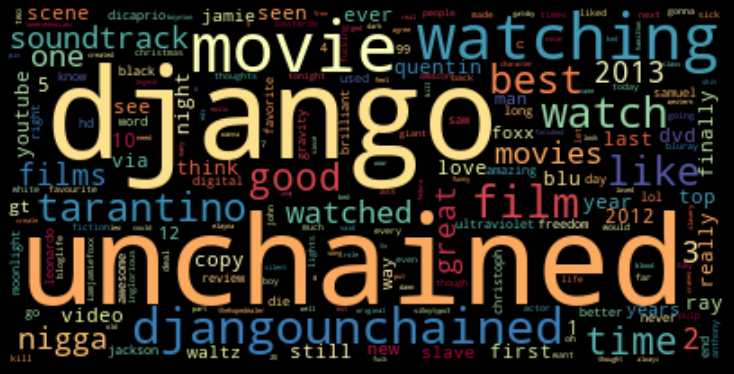

In [98]:
# Create the word cloud:

wordcloud = WordCloud(colormap='Spectral').generate_from_frequencies(fdist)

# Display matplotlib image:

plt.figure(figsize=(10,10), facecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad=0)

# Uncomment the next line if you want to save your image:
# plt.savefig('images/clouddjango.png')

# Hocus Pocus

In [99]:
#Hocus Pocus was released July 16, 1993. Honestly, shocking a Halloween movie was released in the summer. 
#gather tweets from the movie Hocus Pocus
c = twint.Config()
c.Search = "Hocus Pocus"
c.Limit = 6000
c.Since = "2019-10-01" #October is the month of Halloween
c.Until = "2020-10-01"
c.Pandas = True

# Uncommonet the following line to run
# twint.run.Search(c)

1311093367586127873 2020-09-29 19:59:52 -0500 <tineee92> hocus pocus and wine -- fall nights make me so happy 🎃🍷
1311093333654228998 2020-09-29 19:59:44 -0500 <petersam99> @BetteMidler @WisDems Hey bette, shut up you have no idea. What we think here in WI. You live in Hollywood where there are pedophiles. And one other thing. If you still have the broom from Hocus Pocus please sit on it. And I don't mean horizontally.
1311093290100547587 2020-09-29 19:59:33 -0500 <AshHarvell> @LisaVoxNihili @MrOrr24 Same girl. I’ve got my moscato and I’m either gonna read or watch Hocus Pocus 😂😂
1311093114925350912 2020-09-29 19:58:52 -0500 <sunsettos> IT INVOLVES ME JOINING THE HOCUS POCUS VERSE 👀
1311093100882915329 2020-09-29 19:58:48 -0500 <shanel_lilyy> am i the only one who’s never seen hocus pocus and greece
1311092628113567744 2020-09-29 19:56:56 -0500 <tyshayxo> I’m ready for hocus pocus , haunted houses ( even though I hate them ) , s’mores , carnivals , &amp; shit like to be the move !
13110

1311076036495527937 2020-09-29 18:51:00 -0500 <QuestingHeroes> 400pm – Kid-friendly – Troll (1986) 600pm – Kid-friendly - Hocus Pocus (1993) 800pm – Kid-friendly – The Witches (1990) 1000pm – Night of the Living Dead (1968)  Saturday, October 31 1200am – Hellraiser 1 (1987) 200am – Poltergeist (1982) 400am – 13 Ghosts (2001)
1311075784514310144 2020-09-29 18:50:00 -0500 <RachhWetklow> this dude just hasnt seen any of the Halloweentowns but his fav movie is HocusPocus  like u were already on disney channel what are u doing??
1311075562065137665 2020-09-29 18:49:07 -0500 <cocteaubot> hayushi donima  hocus pocus do nimoka starry but sleepy  annapurna donima
1311075520239620097 2020-09-29 18:48:57 -0500 <shelovesthe7> @pixie__park @SpookSquad @adaminak @ChuckyFever2020 I hope they play hocus pocus during the daytime hours at least once 😭  https://t.co/CxbXRxWe0U
1311075480007778304 2020-09-29 18:48:47 -0500 <BitchyWitch9> “It’s just a bunch of hocus pocus!” 🕷🧹🕸🎃  https://t.co/SnfaIguv7z
13

1311059842711384064 2020-09-29 17:46:39 -0500 <whtabtpineapple> I want the Hocus Pocus cookie dough so badly but it remains sold out everywhere around me! ARGH. 2020.
1311059455140864000 2020-09-29 17:45:07 -0500 <pjsvids> Yes I will be breaking in Spooky season right with @BetteMidler and Hocus Pocus. @FreeformTV #31daysofHalloween  https://t.co/NDvCZNwJiz
1311059024381489157 2020-09-29 17:43:24 -0500 <madisonporcello> @luellacavolo Luella watch hocus pocus w me when I can leave👺
1311058889027325957 2020-09-29 17:42:52 -0500 <isabelshouse> And the feature film for Drive Out Child Abuse &amp; Neglect is…HOCUS POCUS! Tickets and full information are now available at this link:  https://t.co/BkgqEk4C49  https://t.co/uBG8kW8r38
1311058850624221188 2020-09-29 17:42:42 -0500 <GuyEchols> We all know @BMS_Billy loves Hocus Pocus, but this is low key my fave Halloween flick.  https://t.co/KsLApqBZxy
1311058664804016129 2020-09-29 17:41:58 -0500 <GMA> CALLING ALL #HocusPocus FANS!     https://t

1311040422991540229 2020-09-29 16:29:29 -0500 <ShortyAmbitious> All of the Scream Movies, The Conjuring, Halloweentown, &amp; Hocus Pocus to be exact 😩😩😩
1311039822031659010 2020-09-29 16:27:06 -0500 <Jahthestealer> y’all might as well air Hocus Pocus every day damn
1311039776804528128 2020-09-29 16:26:55 -0500 <Guadalooper> Quiero toda la colección de Hocus Pocus de ColourPop 🥺🧡🧡🧡
1311039721703841792 2020-09-29 16:26:42 -0500 <MissCthulhu_> hocus pocus  https://t.co/aQNg0zAN5b
1311039542892417024 2020-09-29 16:25:59 -0500 <brobinson436> @StephanieHypes Hocus Pocus &amp; BeetleJuice &amp; Casper and i also have some not family friendly ones as well 👀😬👀
1311039465805287425 2020-09-29 16:25:41 -0500 <XvKittyCatvX> I need the hocus pocus and nightmear b4 Christmas ones 😯  https://t.co/JCSXZRHzCw
1311039433718853632 2020-09-29 16:25:33 -0500 <knguyens> halloweentown &gt; hocus pocus
1311039292152610816 2020-09-29 16:24:59 -0500 <ana_quinnn> 1. I don’t care for any of the disney live-action

1311025564958982144 2020-09-29 15:30:27 -0500 <DarthMother64> @HorrorQueenNeve Hocus Pocus  https://t.co/uDrq4lPg6T
1311025485502013440 2020-09-29 15:30:08 -0500 <randomwaldentwo> ...medical profession has been slow to give up the chicanery of prescientific medicine. It’s abandoning the hocus-pocus of the ciphered prescription, but the honorific title is still too dear. In Walden Two 55 “Then you distinguish only Planners, Managers, and Workers,” I said...
1311025471614791681 2020-09-29 15:30:04 -0500 <lcorpsclones> @dykefordoyle WHILE WATCHING HOCUS POCUS
1311025470360752128 2020-09-29 15:30:04 -0500 <NYRP> And one more reminder for good measure 🎃 Join our founder @BetteMidler—Winifred Sanderson herself—at 9P ET as she live tweets #HocusPocus to kick off #31NightsOfHalloween ✨
1311025467550511111 2020-09-29 15:30:03 -0500 <Emilee22399575> It’s just a bunch of hocus pocus  https://t.co/4qkOC15QOm
1311025386130636800 2020-09-29 15:29:44 -0500 <Gbemiiiiiiiii> Hocus pocus bitch.  https://

1311008444078592002 2020-09-29 14:22:25 -0500 <_THEL0VECLUB> october watchlist checkkk (i do this every year and then end up rewatching twitches, halloweentown, hocus pocus and beetlejuice)  https://t.co/G0GKu6kgGg
1311007848919375873 2020-09-29 14:20:03 -0500 <Rakki_official> @coldmirror Notfalls gehen auch immer die disney channel halloween filme wie hocus pocus oder halloweentown (aber nur der erste)
1311007748444901376 2020-09-29 14:19:39 -0500 <ExaminerReviews> At the Dietrich starting 10/2: Tenet, The Birds, The Evil Dead, Prisoner of Azkaban, Hocus Pocus and The Addams Family!!  Still awaiting my review line up for the 10/9 edition
1311007605544886274 2020-09-29 14:19:05 -0500 <DelanaTweets> RT Star941FM: Hocus Pocus wine?!  YES PLEASE 🎃🍷   https://t.co/EGDyhXDpRW
1311007521994399751 2020-09-29 14:18:45 -0500 <elgreen99> Hocus Pocus’s I put a spell on you had NO buisness hittting that hard
1311007480680452096 2020-09-29 14:18:35 -0500 <Lily75417768> I added I put a spell on you 

1310994448982171648 2020-09-29 13:26:48 -0500 <MagentaSoulstar> Makin' art on iPad Pro- reposted from instagram @magentaarts #kitsch #spooky #illustration #ipadpro #HocusPocus #Iputaspellonyou #ghuleh #Inktober #inktober2020  https://t.co/XPU98H8f75
1310993693978001415 2020-09-29 13:23:48 -0500 <jennadams825> Who else wants to sign up with me?? My FAVE Halloween movie. Bonus if you also bought the new Hocus Pocus canned wine🍷 #ismellchildren #HocusPocus
1310993648780300289 2020-09-29 13:23:37 -0500 <Mel72609> Will the @ColourPopCo #HocusPocus collection be in @ultabeauty or just on the colourpop website???
1310993538788753410 2020-09-29 13:23:11 -0500 <BATSiSCANCELED> @luckofiris hocus pocus is by far one of my favorite movies of all time. i'd listen to it just for the songs sometimes
1310993242578726917 2020-09-29 13:22:00 -0500 <adhos_chandler> Now On Sale  https://t.co/8tLELcvlre Hocus Pocus Spontaneous
1310992721734021120 2020-09-29 13:19:56 -0500 <deedexoxox> @WhatsNoovie 1. Home 

1310977216860352512 2020-09-29 12:18:19 -0500 <TweeterTwit9> @TheBBWH I don't know, but my mom said about my friend: "Stay away from her that family has the evil eye"  I responded: "Oh mommy, that's Hocus Pocus stuff"  Next day we're  jumping double dutch w/friends &amp; she snaps the rope twirling on my jump and broke my little 8 year old ankle. Truth  https://t.co/QJjRcH7Ycd
1310977201261678594 2020-09-29 12:18:16 -0500 <thephillyvoice> Fall is not complete without at least one viewing of "Hocus Pocus."  https://t.co/WLJmVaJ7oR
1310976935216865280 2020-09-29 12:17:12 -0500 <Webbiesofficial> Hocus Pocus cast are reuniting at Halloween reunite this year!  https://t.co/7wC6l0Cdoj #Netflix #Series #hocuspocusrp
1310976792560316418 2020-09-29 12:16:38 -0500 <lauuratosta> No gano sorteos en Venezuela y espero ganar el sorteo de Colour Pop de la colaboración de Hocus Pocus, mi fe es grande? grande no, grandísima.
1310976743776419840 2020-09-29 12:16:27 -0500 <UglyGoblinFeet> @lysapenrose Ho

1310958757598330888 2020-09-29 11:04:58 -0500 <BasicSwiftie91> @rebes08 Hocus Pocus, Halloweentown, and The Haunted Mansion!!
1310958612852989952 2020-09-29 11:04:24 -0500 <OhGoddamn13> @rebes08 hocus pocus of course! but also bubble bubble toil and trouble and  practical magic. now on the scarier side jeepers creepers and halloween.
1310958574655475712 2020-09-29 11:04:15 -0500 <LibertyBoyd_xo> @Fabianbryan1 Now I need to watch hocus pocus
1310958344488865793 2020-09-29 11:03:20 -0500 <MrDavidMrIan> Go give yourself an early Halloween treat... a Hocus Pocus Haul AND the limited edition Hocus Pocus pins that sold out... Jamie and Sydney do an unboxing ... will they complete the set??!!?! 🤔  Go watch and then subscribe!
1310958314507898881 2020-09-29 11:03:13 -0500 <RebelPrincxss> HOCUS POCUS ESTÁ EN DISNEY + ME PUEDO ESTAR MURIENDO DE FELICIDAD
1310958312578519044 2020-09-29 11:03:12 -0500 <Michael94514323> @JoeBiden So many Things in NEED of FOCUS,as We ENDURE Trump's DEADLY HOCUS-POC

1310934424301834242 2020-09-29 09:28:17 -0500 <fourhman> Me finding out that Japan went through a "Stand By Me" phase is like me finding out that America went through a "Hocus Pocus" phase.  https://t.co/EbCQUzhfBn
1310934238670266369 2020-09-29 09:27:33 -0500 <tbdjango> I have never seen hocus pocus
1310934230273339394 2020-09-29 09:27:31 -0500 <CraftsByShelli> Hocus Pocus, Sanderson Sisters, Fall Door Hanger, Fall Wreath, Autumn Decor, Halloween Wreath, Welcome Sign,Halloween Decor, Fall Decor  https://t.co/zK9YGkzP54 via @Etsy
1310934022982438912 2020-09-29 09:26:41 -0500 <d_justicee24> Go check out my fall giveaway for details on how to win these Hocus Pocus freshies 🎃👻✨ @thestubbornburroco  https://t.co/ocRZn4k10t
1310932586684985348 2020-09-29 09:20:59 -0500 <StrategicGenes> Hocus pocus, You might need coffee to focus. Today is National Coffee Day! We help entrepreneurs establish their small businesses, scale to their potential, and achieve a harmonious work-life balance.  https:

1310905456769019906 2020-09-29 07:33:10 -0500 <bigmetsfan1> Top trending titles on @disneyplus 9/28 cont.  13) Magic of Disney’s Animal Kingdom 14) Avengers: Endgame 15) Hidden Figures 16) Coco 17) The Clone Wars 18) The Fault in our Stars 19) Incredibles 2 20) Cars 21) Hocus Pocus 22) Aladdin (2019) 23) Hamilton 24)Tangled 25)Toy Story 3
1310905154452021249 2020-09-29 07:31:58 -0500 <Takeme2Italy> @myLondis I'd watch Hocus Pocus with my children
1310905077130027009 2020-09-29 07:31:40 -0500 <RoriStevens> @cgiles310 @Ruby_Stevens @DrewMcWeeny The other thing is that (as AV Club noted) "Hocus Pocus" is "safe".  Like if a parent thinks "The Witches" is too intense, "Beetlejuice" and other '80s titles too raunchy, and "The Addams Family" too morbid, what other options do you have for the kiddies at Halloween?  2/2
1310903891026939904 2020-09-29 07:26:57 -0500 <tasnnette> Limited-Edition Hocus Pocus Canned Wines Are Here and They Ship Across the U.S.  https://t.co/lLlIJazdmN
13109035128979

1310851643857088513 2020-09-29 03:59:20 -0500 <AlexanderLandSp> Psg, «l'Hocus pocus» di Neymar lascia di stucco il difensore e lo costringe al fallo  https://t.co/Ow4is5mK1o
1310851579575177217 2020-09-29 03:59:05 -0500 <HappyGoLuckyMax> @Poussiere_SSBU Ah. Hocus pocus Elle est à toi maintenant
1310851539750141953 2020-09-29 03:58:56 -0500 <btgm0606> Unpopular Opinion: Hocus Pocus is overrated. Bottom tier Halloween movie for sure.
1310849101936951297 2020-09-29 03:49:14 -0500 <horrorflixx> #HorrorFilms #Horror Carvel and Freeform Celebrating 31 Nights of Halloween With a Limited Time ‘Hocus Pocus’ Shake  https://t.co/wRmhXQUOKR
1310848645256929281 2020-09-29 03:47:26 -0500 <CKMusa03> @iMisred Hocus pocus
1310848469612072966 2020-09-29 03:46:44 -0500 <LindsayCroucher> @RadioX Love Hocus Pocus and it’s in my favourite film, Baby Driver 🙌🏼
1310847656927940611 2020-09-29 03:43:30 -0500 <hornytarz> why does my hair look like one of the witches from hocus pocus now..
1310847317109506048 202

1310812439974416386 2020-09-29 01:23:34 -0500 <feeniks1993> chey-thepumpkinqueen: It’s just a bunch of Hocus Pocus!  https://t.co/CGN9nd0CEl
1310811983147675650 2020-09-29 01:21:45 -0500 <P2fAlex> @Chris28931386 @no_silenced This situation was in Salem,Oregon not Salem, Massachusetts. A little side note. Some of the Hocus Pocus movie was filmed in Salem, Massachusetts but a great deal was filmed in CA
1310811835025612800 2020-09-29 01:21:09 -0500 <Lela_snowboardz> Amuck amuck amuck #HocusPocus
1310811442711535616 2020-09-29 01:19:36 -0500 <IndicaSofire> Naw fr I felt that when she called out 😩 like give her her baby back lil bald headed ass kids 🤣🤣 #bookworm #almosthalloween #hocuspocus #sheisme #iamshe #nerdygirl @ San Diego, California  https://t.co/yqawfvMwex
1310811356791222272 2020-09-29 01:19:15 -0500 <marie32518655> @Roku The first movie I’d watch is Hocus Pocus #RokuStreambar  https://t.co/rb1GAcoQv2
1310811140285435905 2020-09-29 01:18:24 -0500 <marie32518655> @Roku The first 

1310785004025393153 2020-09-28 23:34:32 -0500 <LongLegsBigCity> I don't know who needs to see this, but @disneyplus doesn't just have Hamilton, they have HOCUS POCUS.
1310784760520880131 2020-09-28 23:33:34 -0500 <dappersaan> @akekeekeeekeee bra get yo ole hocus pocus ass on somewhere 🤣
1310784621072781312 2020-09-28 23:33:01 -0500 <CoachD_> Lovecraft Country is Harry Potter, Jim Crow, Hocus Pocus, Star Trek plus history lessons all in one. This show is WILD!!
1310784412146184194 2020-09-28 23:32:11 -0500 <dappersaan> @akekeekeeekeee get yo hocus pocus ass on somewhere🤣
1310784189621391361 2020-09-28 23:31:18 -0500 <BeniaTorres> If you haven’t watched Hocus Pocus, you’re doing something wrong!
1310784175432183808 2020-09-28 23:31:15 -0500 <l_m_h_23> @Roku Hocus pocus #RokuStreambar
1310783714130120704 2020-09-28 23:29:25 -0500 <ApiolazzaBri> espero octubre solo para ver a max en hocus pocus
1310783588619546624 2020-09-28 23:28:55 -0500 <MikaelJay> I want to have a Hocus Pocus movie nig

1310764189963739138 2020-09-28 22:11:50 -0500 <spillerboi> This is good 🍿 "Fun Halloween Movies to Check Out After Watching Hocus Pocus 100 Times"   https://t.co/mkZ1L3UNu8
1310764046346526721 2020-09-28 22:11:16 -0500 <W4STELANDB4BY> this is 6 too many hocus pocus’ like i love that movie as much as the next halloween homo but holy fuck it’s overplayed
1310763833238138880 2020-09-28 22:10:25 -0500 <SefraMack1> Didn't know what is signed up for... but I'm ALLLLL about this life! Yaasss! #hocuspocus #freeform #31NightsOfHalloween #fangirllife
1310763822131576832 2020-09-28 22:10:22 -0500 <bfthur> Hocus pocus is my favorite Halloween movie.
1310763777013489665 2020-09-28 22:10:11 -0500 <ChelseaBalchune> Counting down the hours until @ColourPopCo hocus pocus collection comes out 👻🖤
1310763761255559169 2020-09-28 22:10:08 -0500 <moniqueshantee> Hocus Pocus ?? Friday ?? 9pm  https://t.co/ilCaWX4498
1310763651243139072 2020-09-28 22:09:41 -0500 <introvertgay> There is a 25% chance that I watc

1310748642265923587 2020-09-28 21:10:03 -0500 <TipUvMyTwit> @Regimusk Hocus Pocus.  “Je veux mon livre”  https://t.co/YGYUqorH5x
1310748600205484032 2020-09-28 21:09:53 -0500 <focusonjeff> HOCUS POCUS IS PLAYING AT MY LOCAL DRIVE IN THIS WEEKEND👏🏼😭
1310748534539517962 2020-09-28 21:09:37 -0500 <lijeu> @ALarigaudrieBFM Hocus Pocus 😂😂😂  https://t.co/Ucil3Ve2XW
1310748393673809921 2020-09-28 21:09:04 -0500 <BellaMeShipper> @lovealwaysblake Haha yes Instagram really has me wanting it all. That new colorpop Hocus pocus line is tempting me, looking so beautiful. I legit have some similar colors in one of my morphe palettes but still I want it so bad
1310748362367471619 2020-09-28 21:08:56 -0500 <imafanboy2020> El 1 de octubre veo Hocus Pocus y arranco la temporada de Halloween. Acepto alguien que me haga el dos.
1310747878156107776 2020-09-28 21:07:01 -0500 <harleebelle23> Hocus Pocus freak right here!!! This isn’t a want it’s a definite NEED for me 😭😭🥰
1310747843553001473 2020-09-28 21:06:5

1310731985187463168 2020-09-28 20:03:52 -0500 <SdotSM> I’ve never seen Hocus Pocus.
1310731823618482176 2020-09-28 20:03:13 -0500 <faustusnotes> @adnosk This is the basic problem of economics: your models are unphysical. Most of your fundamental relations fail dimensional analysis. It’s hocus pocus, not maths.
1310731712830345221 2020-09-28 20:02:47 -0500 <Amber_Cookkk> Warm biscuits with pumpkin butter and hocus pocus playing. 🥰😴
1310731712054407168 2020-09-28 20:02:47 -0500 <FrugFashionista> Oh Look Another Glorious Morning Hocus Pocus Bleached Sweatshirt
1310731636154265601 2020-09-28 20:02:28 -0500 <actually_tykela> Watching hocus pocus 😍
1310731163263291394 2020-09-28 20:00:36 -0500 <GGposters> [Trick or]Treat your cubicle wall to a Golden Girls Poster that will make all your co-workers jealous as you put on puppet shows over the partition. Etsy shop link in bio! Can I get a retweet while you’re at it? Thanks! #goldengirlsposters #goldengirls #hocuspocus #beetlejuice  https://t.co

1310712905206095874 2020-09-28 18:48:03 -0500 <atlimerick> I neeeeed this entire collection. Catch me having my daily October Hocus Pocus movie night wearing this 🧙🏽‍♀️🕷
1310712707109199872 2020-09-28 18:47:15 -0500 <HumbleChristina> @ColourPopCo Hocus Pocus has been my favorite movie since I was 5, in second grade I watched it every weekend, in all seasons. I need this collection!
1310712568630120449 2020-09-28 18:46:42 -0500 <Fritobandito96> @OrianaNichelle Hocus Pocus hasn’t aged very well and it’s time to let it die.
1310712470084952065 2020-09-28 18:46:19 -0500 <DrippieHippie_> G just asked to watch hocus pocus. I’m hype 😭🥰
1310712431774179328 2020-09-28 18:46:10 -0500 <theelovelyrose> Now on my website 🤎 Body &amp; feet sugar polish  Of course hand made🥰 Hocus Pocus is a pumpkin pie polish and Cosmo &amp; Wanda is a strawberry kiwi polish. More information on my website:  https://t.co/YAGNhE9vGP  https://t.co/2l0y3mkJZS
1310712382394642437 2020-09-28 18:45:58 -0500 <SeaMonketta> 

1310699245704556544 2020-09-28 17:53:46 -0500 <WeAreFlagrant> Flagrant Halloween cards have hex appeal. #hocuspocus meets #sexandthecity Click #etsy link in bio. @BetteMidler @kathynajimy @SJP_Daily  https://t.co/NBHPQU7RvV
1310699143325716480 2020-09-28 17:53:22 -0500 <friggindone> @BernieSanders @stella7003 If we repeal certain tax acts and eliminate the tax hocus-pocus afforded to the rich, there may not be a need for extreme tax hikes-just their fair share/% $. I worry when you make it sound like all rich people should be punished, it reinforces voter fears. @JoeBiden not extreme.
1310699060190425094 2020-09-28 17:53:02 -0500 <jshsouthern> @J3fficka Never watched Hocus Pocus in all honesty, but aye, there are maybe only two or three scenarios (out of however many possible billions) in which it could be anything but torture.
1310699051755601921 2020-09-28 17:53:00 -0500 <fox11reno> Freeform has released their highly-anticipated "31 Nights of Halloween" schedule. The fun begins Oct 1

1310682310233128960 2020-09-28 16:46:28 -0500 <makeupbymari96> I just want to get my hands on the @ColourPopCo Hocus Pocus collection!! I NEEEED ITTTT 😭😭
1310682221343158272 2020-09-28 16:46:07 -0500 <eggsoticc45> @longIivelisa @Coolness1994 She’s giving hocus pocus on the first pic tho  https://t.co/kHKCv0ZAjg
1310681801459994624 2020-09-28 16:44:27 -0500 <willwakeu> @L824824179 @VincentCrypt46 @LSferopoulou Lol.....  calm calm....  no hocus pocus here.... I have seen what very few have ... no doubter here...  More than u think actually.
1310681769058930697 2020-09-28 16:44:19 -0500 <carolineisodd> I just entered to win passes to see #HocusPocus at the drive-in from @thebull1017!  https://t.co/dTH2ZcVKdV
1310680587196223489 2020-09-28 16:39:37 -0500 <krissymmurphy> Hocus Pocus is only enjoyable if your first viewing was in your childhood.
1310680574231797762 2020-09-28 16:39:34 -0500 <DavidA66> @BetteMidler Hi Bette, any news on Hocus Pocus 2? 🎃 👻
1310680278990565377 2020-09-28 16:38:

1310664431194472450 2020-09-28 15:35:26 -0500 <SarahLynn110> @Roku Hocus pocus  #RokuStreambar
1310664384490872832 2020-09-28 15:35:14 -0500 <rosie_digout> Hey @SmoBurton, did you see that @Moviemill will be playing Hocus Pocus starting Oct. 2?  https://t.co/9i2m1o93r7
1310663959486361601 2020-09-28 15:33:33 -0500 <its_theshitshow> @Lisa_hargreeves hocus pocus harry potter (rewatch)  nightmare before christmas sleepy hallow the addams family
1310663859066281986 2020-09-28 15:33:09 -0500 <oatmilk_t> Babe is making grilled cheese and I just started hocus pocus🎃🕯
1310663562939990018 2020-09-28 15:31:59 -0500 <nicolexelder> @tony_r_us @offbrand_chance Coraline is on there hocus pocus should be too- and Casper for that matter
1310663562545770496 2020-09-28 15:31:58 -0500 <steven_yaldo> Excellent Non-horror #halloween #movies to watch: Ernest Scared Stupid, Hocus Pocus, Halloweentown (1&amp;2), the Burbs, the Frighteners, Bettlejuice, Nightmare before Christmas, Dont Look Under the Bed, the 

1310648555988811777 2020-09-28 14:32:21 -0500 <ClickySound>  https://t.co/ziuzYYkNEP  Your only plan for October may be watching Hocus Pocus on repeat until Nov. 1, but you might just change your mi...  https://t.co/zQw3h5Lco3
1310648301528715267 2020-09-28 14:31:20 -0500 <Effiemagic> So ready to watch hocus pocus 67 times in October
1310648242313596928 2020-09-28 14:31:06 -0500 <Ma_Cecilia04> Midler le dice a #SleepyJoe que le de una patada en “las nueces” al Pdte Trump, durante el primer debate presidencial.  Al parecer Bette olvidó que Hocus Pocus era solo una película, y no un estilo de vida. 🙄  https://t.co/6ZWOCaVOGy
1310648124952768514 2020-09-28 14:30:38 -0500 <MommaFriendly> Plan With Me | Hocus Pocus Themed Stickers | BeaYoutiful Planning | Hall...  https://t.co/iAnvDSMRjh via @YouTube
1310648088068055040 2020-09-28 14:30:29 -0500 <Travis_D75> @theblaze Who thought it was a good idea to ask her? Is it just because she’s about to be relevant again with everyone watching hocus 

1310628818432872448 2020-09-28 13:13:55 -0500 <aworldwideapart> @ColourPopCo I neeeed the Hocus Pocus collection! It’s my fave Disney movie and makeup brand all wrapped up in one spooky bow!
1310628811462017024 2020-09-28 13:13:53 -0500 <SydneyNWesson> Pretty sure I’m the only one who’s never seen Hocus Pocus 🥴
1310628597443383296 2020-09-28 13:13:02 -0500 <Briana234> @RegalMovies I love hocus pocus
1310628577419964422 2020-09-28 13:12:57 -0500 <melinasuarez357> @ColourPopCo hocus pocus is my absolute favorite movie!! 😩 right next to the adams family
1310628311060500480 2020-09-28 13:11:54 -0500 <kkjordan> I was hoping for Hocus Pocus, too, but not even 2 laptops being queued could make those stars align boo  https://t.co/tAx9XS7Lvo
1310627902363373569 2020-09-28 13:10:16 -0500 <turnondafun> @SupGirl So is Hocus Pocus, lol
1310627687094943750 2020-09-28 13:09:25 -0500 <ramontheworld_> I wish there was something I liked from this collection cuz it's so pretty and I love hocus pocus but 

1310608120763293698 2020-09-28 11:51:40 -0500 <Rasquo1> @ma2t__ Bah mec c’est un hocus pocus et c’est Neymar donc normal
1310607757968629761 2020-09-28 11:50:14 -0500 <MelenaDeTroya> Turboman es para mi Navidad lo que Hocus Pocus es para mi Halloween. #Impelable  https://t.co/7HVWBsyJdT
1310607734933340161 2020-09-28 11:50:08 -0500 <finelinedariana> My bitch ass REALLY did order a Hocus Pocus blanket😂 I LOVE SPOOKY SZN🎃🍁🍂🧡
1310607032886546433 2020-09-28 11:47:21 -0500 <sarahgracewhitt> Too soon to watch hocus pocus?
1310606970618023938 2020-09-28 11:47:06 -0500 <Studio10WJAR> #TRENDING today! It's actually not "just a bunch of hocus pocus," though we aren't kidding. @NBC10_Lindsay @MeaghanMooney1   https://t.co/Gl2SXdoArx
1310606857287864320 2020-09-28 11:46:39 -0500 <66_drive_In> We will be closed the weekend of October 2 and the weekend of October 9.   We plan on re-opening the weekend of October 16 showing:  Hocus Pocus  Nightmare Before Christmas ￼￼  https://t.co/pckwgjLnPm
1310606

1310578544964239361 2020-09-28 09:54:09 -0500 <PopArtPromQueen> Made some cookies for my munchkin!! #hocuspocus #cookies #halloween  https://t.co/hJmoW5VjBI
1310578516333912070 2020-09-28 09:54:02 -0500 <MALCOLMHTX> Hocus pocus as Mary go rooouuund
1310578146912198657 2020-09-28 09:52:34 -0500 <merbrebner> @srmilesauthor Watching Hocus Pocus and eating candy. Also decorating the front lawn. Possibly leaving loot bags scattered on the law for kids?
1310577884457824258 2020-09-28 09:51:31 -0500 <kierawrr> To my coworkers: Y’all about to see the same Hocus Pocus shirt on Zoom for the next 34 days
1310577861120622593 2020-09-28 09:51:26 -0500 <lxnxra> Decorating my apartment for halloween has been so fun &lt;3 I did a hocus pocus theme and it’s so cute 🥺
1310577842661371905 2020-09-28 09:51:21 -0500 <LaloPer31587525> @EyesOnQ @godisgood1961 @WayneDupreeShow I thought she was just acting to be a witch in hocus pocus... turns out she is a real Bwitch
1310577501463359490 2020-09-28 09:50:00 -

1310543149496963073 2020-09-28 07:33:30 -0500 <GenYConservativ> @PatUnleashed @KeithMalinak   Someone should tell Ol Bette to stay away from politics and focus on her speciality, Hocus Pocus 2. #PutThatInYourPipe
1310543060267401217 2020-09-28 07:33:08 -0500 <MichelleCannata> @Rwlshmakeup I love hocus pocus, but the lunar beauty moon spell pallette is so much better looking.
1310542803995369472 2020-09-28 07:32:07 -0500 <indecisivebe> Mean girls is over rated. Hocus pocus isn’t great.
1310542229837164544 2020-09-28 07:29:50 -0500 <RunInPink> Feeling those #halloween vibes with my cute new mug..I can still remember seeing  this movie with my mom in theaters right when it came out. Very happy memory. #hocuspocus #fallvibes #pumpkinspice  https://t.co/8kEBZ2SCkf
1310541609034018816 2020-09-28 07:27:22 -0500 <DealsCurious> Hocus Pocus (4K Ultra HD + Blu-ray + Digital) $15.75 + Free S&amp;H Orders $35+  https://t.co/USSdTdx81Q
1310540044126560260 2020-09-28 07:21:09 -0500 <Fdj699> Neymar il

1310458054413029376 2020-09-28 01:55:21 -0500 <ashldrew5> Definitely Hocus Pocus!
1310457954206769152 2020-09-28 01:54:58 -0500 <IndecisiveGuise> 📲ᴄᴜʀɪᴏꜱɪᴛɪᴇꜱ ᴄᴏꜰꜰᴇᴇ ꜰʙ ᴘᴀɢᴇ  Limited time for Spooky Season! 🦇 Maybe if we sell enough, they'll be added to the menu forever?  Hocus Pocus Hot Cocoa - definitely a treat, no tricks here.  Pumpkin Spice - contains more actual🎃than most, guaranteed!  #OpenRP  https://t.co/gpm8fPWgDA
1310457922049146885 2020-09-28 01:54:50 -0500 <HighDefDiscNews> 🚨DEAL🚨  Walmart has HOCUS POCUS on 4K for just $15.02 right now with 2-day shipping. That's $1 cheaper than Amazon had it before it sold out. I'm waiting on my copy I already ordered there but it is totally worth picking up! #4K #HocusPocus #BlurayDeals   https://t.co/EqHiwAtele  https://t.co/6XuS87BPPl
1310457864906059776 2020-09-28 01:54:36 -0500 <VincePetisi> @bunnymonrowxo How about the The Sanderson Sisters from Hocus Pocus. You could have waited two hundred years for the perfect dick
1310457736841

1310419576153350144 2020-09-27 23:22:28 -0500 <goochmeister420> I dont wanna go to the movies rn but cinemark is playing bretlejuice, hocus pocus, halloween, and the exorcist for $5 😶🧍‍♀️
1310419341242847232 2020-09-27 23:21:32 -0500 <forceof_neglect> Hocus Pocus, a fire and 2 of my amazing roommates. So happy to live with people that are just as hyped for Spoopy Season as I am! 👻  https://t.co/QdVPYu9dWE
1310419137051623424 2020-09-27 23:20:43 -0500 <beauville_> If you haven’t seen (and loved) hocus pocus you’re a loser
1310418850916241408 2020-09-27 23:19:35 -0500 <AsmrYoloma> Look at this amazing gif created by @OfficialRaynaTM ! A hint of the next production from the ASMR Mushrooms 🍄 Theater 🎭 Company : Hocus Pocus by @OfficialRaynaTM with @spookyAL @asmr_jim and myself ! October 3rd at 10pm ECT (9pm BST) !  I’ll put a spell on you !
1310418767109910528 2020-09-27 23:19:15 -0500 <Daylan71825194> @mandiiveee Awe I'll watch hocus pocus and coraline with you 🥺
1310417800305942528 2020

1310397383684116480 2020-09-27 21:54:16 -0500 <GaryUWorlds> @vmiliaclarke Love Lies Hocus Pocus series.  Fair warning, only 6/12 written but it’s pretty damn cool. Urban fantasy. Talking cat with all the sass and cattitude you’d hope for
1310397279464050688 2020-09-27 21:53:52 -0500 <CarbuncleSucks> @ChelleySEV Says the person that hates Hocus Pocus, gtfo
1310396272826777600 2020-09-27 21:49:52 -0500 <Mom_And_Beyond> Made with @triller #triller #hocuspocus #murder #shotgun #etsy #tumblers  https://t.co/Ow9YDEs9MQ
1310395843401248769 2020-09-27 21:48:09 -0500 <rockethulsey> Hocus Pocus Movie Fridge Magnet Collection Horror Fan Birthday Gifts Wall Decor I Put A Spell On You Bette Midler Films  https://t.co/HAR71MNNnJ
1310395426537906177 2020-09-27 21:46:30 -0500 <AnsleyMcConkey> There is actually people who have never watched Hocus Pocus 🤯
1310394559956955137 2020-09-27 21:43:03 -0500 <TheChrisDez> Hocus Pocus: Gay or Yay for a man to enjoy?
1310394376061890562 2020-09-27 21:42:19 -0500 

1310372231525076998 2020-09-27 20:14:20 -0500 <ThiedeK> First #HocusPocus viewing of the season! ✔ 🧙‍♀️ 🎃 🕷
1310371869329993728 2020-09-27 20:12:53 -0500 <draenao> New fav shirt. 🖤 lil Hocus Pocus, baby.  https://t.co/Utf6nhdQqe
1310371539079041024 2020-09-27 20:11:35 -0500 <carlospedrottii> Drinking a SuperSymmetry by Hocus Pocus @ Untappd at Home —  https://t.co/7SBLlFQyD0
1310371499795075072 2020-09-27 20:11:25 -0500 <Robotica0330> @CrimsonAtelier I always watch Hocus Pocus first, lol!! That movie never gets old.  https://t.co/3zCrXjyHAK
1310371323387015168 2020-09-27 20:10:43 -0500 <tycarlin11> There are 0 good Disney Channel Original Movies. This includes Hocus Pocus, which isn’t a DCOM, but is roughly the same quality.
1310371260539514880 2020-09-27 20:10:28 -0500 <just72990> Hocus Pocus and chill kinda night 🎃
1310371078913568770 2020-09-27 20:09:45 -0500 <dexlectar> Hey #mutantfam, you think this is the dead man's toe the Sanderson sisters were talking about? #HocusPocus  https

1310349521382240258 2020-09-27 18:44:05 -0500 <ashleebreej33> Is it October yet? I’m ready to run amok with the Sanderson sisters in Hocus Pocus.  https://t.co/Sa3MwhuFpU
1310349360308391938 2020-09-27 18:43:27 -0500 <tourismexpert> @31Nights @FreeformTV What kind of hocus-pocus is THIS? SHOULD I BE SCARED? LOL...
1310348851488858118 2020-09-27 18:41:25 -0500 <SummerVGK> @Mandanicole0810 Colour Pop is releasing a whole Hocus Pocus collection!
1310348502187290624 2020-09-27 18:40:02 -0500 <cubic_logic> @Radegund Without calculus you can't do statistics. You can only do hocus pocus and fool naive people with your "Machine Learning- Data Science"
1310348480360181772 2020-09-27 18:39:57 -0500 <RichardSolecki> @ToscaAusten Hocus pocus .. Where did you go ?
1310348406603354112 2020-09-27 18:39:39 -0500 <Gislana449Susan> @gonelegal @SenWarren And by what magical hocus pocus would that have happened? Hmm?
1310348371488649222 2020-09-27 18:39:31 -0500 <pentax47> @ibsroyalty also for a Hocus poc

1310329360017174530 2020-09-27 17:23:58 -0500 <stuartgibson> My head canon is that Hocus Pocus is an Eerie Indiana Halloween special.
1310328824555544576 2020-09-27 17:21:51 -0500 <grayyynnn> @btsportfootball Called a hocus pocus mate 👍
1310328427711541249 2020-09-27 17:20:16 -0500 <FipNowPlays> ♪ #nowplaying Smile - Hocus Pocus (Place 54 - 2007)  https://t.co/NT9TAxqUaw  https://t.co/Ro47kCcWpC
1310327891608166400 2020-09-27 17:18:08 -0500 <WullyWatson__> It’s called the hocus pocus, been doing it on fifa for years kid, keep up
1310327544584044545 2020-09-27 17:16:45 -0500 <JackSZN1> @JDFootball Called a Hocus Pocus btw
1310327436199026694 2020-09-27 17:16:20 -0500 <OfOlderSisterW> ||. I need more hocus pocus writers 🥺
1310327252085768193 2020-09-27 17:15:36 -0500 <Reddis_07> Hocus pocus
1310327101095055360 2020-09-27 17:15:00 -0500 <sunny1065lv> Hocus Pocus Cast To Reunite For Bette Midler's Virtual 'Hulaween' Gala  https://t.co/T0Frodm50Y
1310327031473856512 2020-09-27 17:14:43 -050

1310315144526925824 2020-09-27 16:27:29 -0500 <marriedwvenus> @giulicherry La de  hocus-pocus la veo todos los días
1310315116865486851 2020-09-27 16:27:22 -0500 <AsYouWi32251727> I don't want the horror movies but I'm down for a marathon of snacks, blankets and Halloween movies like Beatlejuice, Hocus Pocus, Nightmare Before Christmas, Scary Movie, Adams Family and Ghostbusters.  https://t.co/oyEHQ6XTeH
1310315109223477254 2020-09-27 16:27:21 -0500 <_ThisIsWendy> Colourpop qui font une collection spéciale Hocus Pocus pour Halloween, watch me encore dépenser mon argent pour du make up
1310315061030850566 2020-09-27 16:27:09 -0500 <_AngeLaryssa> Found hocus pocus cookies. So it looks like we’re watching it tonight and baking. 🤍
1310313676763795456 2020-09-27 16:21:39 -0500 <salingersbitch> My life lost meaning when they took hocus pocus off Netflix
1310313636410339329 2020-09-27 16:21:30 -0500 <MathildaMirand3> Hay que acostarnos a ver hocus pocus y taparnos con una sábana para calentar

1310288861080231938 2020-09-27 14:43:03 -0500 <POPSUGARBeauty> It's all just a bunch of Hocus Pocus! @ColourPopCo  https://t.co/9wB7ciL6fl
1310288859662516236 2020-09-27 14:43:02 -0500 <POPSUGAR> Gather round sisters, @ColourPopCo is launching a Hocus Pocus collection!  https://t.co/Slph9j5xK7
1310288855162138625 2020-09-27 14:43:01 -0500 <Bibiana1Krall> "I have heard (but not believ'd) the spirits of the dead  May walk again: if such thing be, thy mother  Appeared to me last night; for ne'er was dream  So like a waking." #ShakespeareSunday   #Halloween #HearthFires #HocusPocus TY 4 the love. follows/ retweets! #SundayThoughts  https://t.co/GBC3HSyJWe
1310288830705152008 2020-09-27 14:42:55 -0500 <makeup_sug> How do we feel about the Colourpop Hocus Pocus palette?  https://t.co/4HF7Rq1rTn
1310288545446268928 2020-09-27 14:41:47 -0500 <LyingKaat> I know it’s not October yet, but my soul needs all the Halloween right now. 🔮👻🎃 . . #decorating #Halloween2020 #Halloween #HocusPocus  https:/

1310264173125922816 2020-09-27 13:04:57 -0500 <4_evercool> Excited to share the latest addition to my #etsy shop: Halloween shirt, halloween to our web, Witches shirt, hocus pocus tshirt, funny halloween shirt | Halloween camiseta #halloweentown #halloweentshirt #halloween  https://t.co/vjpGW5OYwR  https://t.co/ITt5CWwhx0
1310264140250914816 2020-09-27 13:04:49 -0500 <Curlytopnea> Watching hocus pocus with Hobbs and scratch 🥰
1310264024387461122 2020-09-27 13:04:21 -0500 <k_crnko> &amp; watching Hocus Pocus 🧟🧛🏻‍♂️🦇🍂🍁
1310262810090373120 2020-09-27 12:59:32 -0500 <Michell21565208> @AshleyBergeron2 Fun fact about me...I've never seen Hocus Pocus lol. My friends are aghast! Now I really don't want to because I kinda can't stand Bette and already don't like SJP lol
1310262747326808065 2020-09-27 12:59:17 -0500 <urgrlkc> My mom hollers my name in the same manner that Winifred from hocus pocus hollers for her book.
1310262321097310209 2020-09-27 12:57:35 -0500 <frazzled_fox> Hocus Pocus is m

1310238724966547457 2020-09-27 11:23:49 -0500 <tasha_eve97> If ur an actor and ur aim isn’t to be as good as Bette Midler in Hocus Pocus it’s time to RETHINK
1310238533710491648 2020-09-27 11:23:04 -0500 <johnnxssa> There really isn't other Halloween movies you can show besides hocus pocus
1310237751737020422 2020-09-27 11:19:57 -0500 <MonktonBlue> @andylong Picked up on Focus 3 pretty quickly after that. Remember hearing Hocus Pocus and Sylvia on Radio Luxembourg for the first time.
1310237687035703297 2020-09-27 11:19:42 -0500 <teddy_trucker> Went to Walmart this morning to get a couple of things. Had one of the best times in a long time. Went to check out the Halloween stuff. I don’t know if you know the movie Hocus Pocus but they have these 2 feet tall characters that you can sit out for decorations, well they
1310237569226092544 2020-09-27 11:19:14 -0500 <djn2911> @Djf1983 Hocus Pocus wasn’t made made in the 45 🤔
1310236785004478465 2020-09-27 11:16:07 -0500 <andylong> I've got th

1310191397522354176 2020-09-27 08:15:46 -0500 <lexweeb> @shploofs Hocus Pocus 💕
1310189774540623875 2020-09-27 08:09:19 -0500 <HisokasDisciple> COLOURPOP ARE DROPPING A HOCUS POCUS COLLECTION OMG
1310187729842470920 2020-09-27 08:01:11 -0500 <KCP_Michelle> I totally just whipped my front curtains closed like Winifred Anderson in Hocus Pocus. “Oh look another glorious morning! Makes me sick!”
1310187480323244033 2020-09-27 08:00:12 -0500 <readandgeek> Where I discover Hocus Pocus and The Lords of Salem aren't that different. And they are both magic.  https://t.co/PFwaCy3Q0V  https://t.co/16nWm6bdyU
1310186106558844930 2020-09-27 07:54:44 -0500 <Caitlin34210616> Praying Hocus Pocus gets put on Netflix this October 🤞🏽👻🎃🤡👹#Netflix
1310185931429814274 2020-09-27 07:54:02 -0500 <JJ9828> Have you ordered your art print of my Hocus Pocus fan art? You better get one! I do new Hocus Pocus art every year. Prints start at $13. Shipping is free!  https://t.co/l5Pg2S4f3E  https://t.co/AUS4YpFD5P
131

1310113375842566144 2020-09-27 03:05:44 -0500 <woolie> I did not connect in my brain, until today, that Sarah Jessica Parker was in Hocus Pocus.
1310112492467544064 2020-09-27 03:02:13 -0500 <Sir_CharlieRoc> Real Gz watch Hocus Pocus
1310111538557091840 2020-09-27 02:58:26 -0500 <ciarrachapstic_> I’m ready for October so I can watch Hocus Pocus for the 1906426897543 time ☺️
1310111264115318784 2020-09-27 02:57:20 -0500 <MayCerdis> No saben la fuerza de voluntad que tuve que imponerme para no comprarme una sudadera de Hocus Pocus hace unos minutos 😭 el envío está muy caro
1310111245866086407 2020-09-27 02:57:16 -0500 <SandLtwit> @irishreader_ Hocus pocus
1310110143544262657 2020-09-27 02:52:53 -0500 <KrishGrey> @TheKimmest @clpolk I got Hulk Hogan, Hocus Pocus, Power rangers(the pink one i think), Mrs Doubtfire, Jurassic park, Dennis the Menace, Chuck E Cheese and a mermaid barbie squirting water out of her crown. The only thing that saved me from meltdown was.... STOP!! Hammer time.
13

1310069865831563264 2020-09-27 00:12:50 -0500 <AllenOLantern> Guess who finally made it out to @SpiritHalloween in Burbank! They took over the old Kmart instead of the Old Ikea. Lots of Trick 'r Treat and Hocus Pocus Merch. If I had 60 bucks I'd have gotten a Adult Sam costume.  https://t.co/Jlna6pztan
1310069783908487169 2020-09-27 00:12:31 -0500 <sunkissedsassxo> @scrubs_n_tiaras I just got the Hocus Pocus one 😂😍
1310069717936345088 2020-09-27 00:12:15 -0500 <hakunamajessie> @ColourPopCo just needs to send me the whole ass Hocus Pocus collection because I NEED her
1310069700093718528 2020-09-27 00:12:11 -0500 <Jenesa4> hocus pocus at the movie theater soon..... honey you know I’m going. That’s a real ass vibe 🎃🕷
1310069440231477249 2020-09-27 00:11:09 -0500 <tara_novotny> Hocus Pocus themed Saturday night with the girls 🙌🏻  https://t.co/sabkPj7Km7
1310069028375805954 2020-09-27 00:09:30 -0500 <jackspadicy2> gosh the smell of spiced pumpkin candles just warm my heart so much like gosh

1310047041448538114 2020-09-26 22:42:08 -0500 <sarah4on> Hard hitting question of the day: can someone pls explain to me how Winnie knows what a drivers permit is in Hocus Pocus?
1310046924729446401 2020-09-26 22:41:41 -0500 <arczeal_designs> Hocus Pocus Crew T-Shirt  https://t.co/1nGzs7hEYT  https://t.co/ymPD9zsXQV
1310046880768954370 2020-09-26 22:41:30 -0500 <aliiKat25> Candace just got us drive in movie tickets for Hocus Pocus next week 🎃🖤
1310046656390475779 2020-09-26 22:40:37 -0500 <HighDefDiscNews> Glad I was willing to be patient and ordered HOCUS POCUS on 4K UHD Blu-ray from Amazon yesterday, for several reasons. I only paid like 16 bucks, it’s now going to arrive 10/13 instead of ironically Halloween &amp; now they’ve already sold out. That’s just weird. Things are “amok.”  https://t.co/GGY83Ylwp9
1310046547304951810 2020-09-26 22:40:11 -0500 <leandrojmp> rapaz, essa mad honey da hocus pocus. 🤪
1310046483849371648 2020-09-26 22:39:55 -0500 <triciajms> bisexual culture is wat

1310021798969384960 2020-09-26 21:01:50 -0500 <jcblarue> First #HocusPocus viewing of the year w/@angelamarieg31 and @rh_middleton #love #fall  https://t.co/Nwt9u0Ofd2
1310021647232126977 2020-09-26 21:01:14 -0500 <goodfelladuke> I’m convinced FSU has the same curse as the Hocus Pocus witches 😂🖕🏾 Still #NoleGang 🍢💯
1310020679497134080 2020-09-26 20:57:23 -0500 <JeffSha45> Get rid of the hocus pocus mask and restart America's business!
1310020555614162947 2020-09-26 20:56:54 -0500 <roblox_gangsta> ACAB esp the cop from hocus pocus ugly ass bitch
1310020519442477063 2020-09-26 20:56:45 -0500 <denniscecconet> The Sanderson Sisters Are Reuniting For a Virtual ‘Hocus Pocus’ Halloween Event  https://t.co/q9ANm1zkQ4 #apartment #feedly
1310020375317749761 2020-09-26 20:56:11 -0500 <JB__CRUSH> Name this Faction (I'm going with 'Hocus Pocus')  https://t.co/bEJI5JG7SE
1310019565934452737 2020-09-26 20:52:58 -0500 <idcvibes> @contrashelby omg!!! hocus pocus 💓💓
1310019421310726144 2020-09-26 20:52:

1309999923073609728 2020-09-26 19:34:54 -0500 <whitleycooper7> ISO: a new boyfriend  Must: -want to watch hocus pocus with me
1309999832992550915 2020-09-26 19:34:33 -0500 <witchyjeri> @judith_pogue those are acceptable and some of my favorites 😂 i just don’t get the hocus pocus hype
1309999702407106567 2020-09-26 19:34:02 -0500 <whitleycooper7> Just asked jason if we could watch hocus pocus and he said “idk”
1309999698057539584 2020-09-26 19:34:01 -0500 <caffffff> Hocus Pocus has got to be one of the most overrated Halloween movies of all time
1309999556797497345 2020-09-26 19:33:27 -0500 <ModernMIMom> We are about to begin the 5 year old’s first viewing of Hocus Pocus! All she knows at this point is that it’s Mama’s favorite witch movie.
1309999284272721920 2020-09-26 19:32:22 -0500 <JuicyGarland> Yessssss It is time for Hocus Pocus bintches!
1309999249430634496 2020-09-26 19:32:14 -0500 <PawdreDeCorgi> He’s never seen Hocus Pocus but hears good things about it so he’s willing to giv

1309976971133165568 2020-09-26 18:03:42 -0500 <TimothyDowling> I don’t either but depending on the mood THE FRIGHTENERS, SLEEPY HOLLOW or HOCUS POCUS.
1309976953110183936 2020-09-26 18:03:38 -0500 <rahrahpiranha> Watching Hocus Pocus for the first time in my life.
1309976435747098624 2020-09-26 18:01:35 -0500 <amandazoe111> ColourPop x Hocus Pocus Creme Gel Liners Reviews &amp; Swatches  https://t.co/BUCvDktJCj  https://t.co/v21klbJrCA
1309976270801973248 2020-09-26 18:00:55 -0500 <ProfLupton> @ProfAnkersen Does this mean you are anti-Hocus Pocus or just pro-LOTR as Halloween appropriate?
1309976044166942725 2020-09-26 18:00:01 -0500 <31Nights> Besties?  Watch Hocus Pocus during #31NightsOfHalloween on @FreeformTV.  https://t.co/9X7JLPcagO
1309975865665748999 2020-09-26 17:59:19 -0500 <Wankona1> ColourPop x Hocus Pocus Creme Gel Liners Reviews &amp; Swatches  https://t.co/v3LE3GHXNP
1309975856597655552 2020-09-26 17:59:17 -0500 <hanisgirlfriend> but in other news the new hocus pocus li

1309955085460484096 2020-09-26 16:36:44 -0500 <kristin6880> Got the books in the first photo in May. Today I got NeverNight and the Hocus Pocus sequel book.  https://t.co/dvNIuc3vvM
1309954800361111553 2020-09-26 16:35:36 -0500 <Coastercrew> Next up, Goblin Soup (French Onion Soup) and Hocus Pocus Punch! *The soup was amazing!#TricksAndTreatsFallFest @cedarpoint  https://t.co/kRlLmDdkgk
1309953996623425544 2020-09-26 16:32:25 -0500 <Miss_RosieRW> @tinyhistorian Hocus Pocus is one of my all time favourite spooky film! I watched Practical Magic the other week and forgot how amazing that was!!
1309953222132498435 2020-09-26 16:29:20 -0500 <_andradejen> It’s just a bunch of Hocus Pocus🍂🎃  https://t.co/AwaAQx70IC
1309953076829343750 2020-09-26 16:28:45 -0500 <emaniii___> If it’s one thing ABC / “Free form” is gonna do is play tf out of Hocus Pocus😂😂😂
1309952768325582848 2020-09-26 16:27:32 -0500 <naxisun> hocus pocus was released into theaters on this day in 1993  https://t.co/KNwGvVjD6q
13

1309930796078292992 2020-09-26 15:00:13 -0500 <RulebooksA> 📣 New Podcast! "RA episode 045 Butt Tails" on @Spreaker #arkhamhorror #boardgames #cardgames #d_d #dinosaur #dungeonsanddragons #games #gaslands #hocuspocus #keyforge #marvel #mouseguard #ninthhavengames #twilightimperium #videogames #villainous  https://t.co/MGIQ5CmA6k
1309930599092805632 2020-09-26 14:59:26 -0500 <sataneIIe> as enfermeiras parecem aquela bruxa ruiva do filme hocus pocus (acho q é Abracadabra aqui)
1309930520755699712 2020-09-26 14:59:08 -0500 <oreplicario> As estrelas de Hocus Pocus se reunirão para a arrecadação de fundos de Bette Midler para o Hulaween  https://t.co/3gNM7mGk8j
1309930383664971776 2020-09-26 14:58:35 -0500 <autumntoddd> carving a pumpkin and watching hocus pocus by ✨ myself ✨
1309930358410969088 2020-09-26 14:58:29 -0500 <TheFreeThree> @wavetomummy Hocus pocus! Best film ever 😊
1309930149081747456 2020-09-26 14:57:39 -0500 <thefrogmom> I got my hopes up for the colourpop hocus pocus collecti

1309904872305758219 2020-09-26 13:17:13 -0500 <MommyMakeoverSG> #RT @cafemom: 'Hocus Pocus' Virtual Event Featuring Original Cast Coming for Halloween  https://t.co/8h8QXg9Z2n
1309904856379949058 2020-09-26 13:17:09 -0500 <KiayaLacy> #Halloween #HocusPocus  https://t.co/33tLVyv37D
1309904854379368453 2020-09-26 13:17:08 -0500 <allofthelovely1> @irishreader_ Star Wars. Lord of the Rings. Hocus Pocus.
1309904852756164609 2020-09-26 13:17:08 -0500 <FlorGon82980706> Colourpop saco una línea de maquillaje de Hocus Pocus estoy gritando!
1309904722648797186 2020-09-26 13:16:37 -0500 <lo_daniellee> Ready to watch Hocus Pocus everyday
1309904150147280902 2020-09-26 13:14:20 -0500 <dannvp_> @kris_mang @steamynicks_ Extreme unpopular. Hocus Pocus slaps
1309904138290036736 2020-09-26 13:14:18 -0500 <tatichin> If they think I’m gonna spend $99.99 on a polyester wear-once costume to sit on my couch with my friends and watch Hocus Pocus and Halloweentown they are absolutely right
1309903674488037381 

1309882797021188096 2020-09-26 11:49:29 -0500 <Kellshuddyxar> Hocus Pocus is amazing! Love that film🖤
1309881991534383106 2020-09-26 11:46:17 -0500 <Katalynbc13> @ravenscimaven 1993 was a good year. Jurrasic Park. RBG confirmation hearings. Hocus Pocus. But this one right now. Yes.  https://t.co/LhP2OCrHzD
1309881957250080768 2020-09-26 11:46:09 -0500 <smilesalotlady_> "Hocus pocus " you've lost your focus 😂😂
1309881864988110851 2020-09-26 11:45:47 -0500 <WisnerPhoto> Maybe this is the year I watch Hocus Pocus with abs.
1309881125276352514 2020-09-26 11:42:51 -0500 <blatinonerd> I may or may not really like Pops, and hocus pocus.  https://t.co/5V6ADkw05H
1309880950705328133 2020-09-26 11:42:09 -0500 <Fersten23> @mrswyatt247 @amazon Never knew personal lists were a thing until recently and I’m here for it!! It’s hocus pocus season!!  https://t.co/DyRxP5dtH2  https://t.co/7CtfwsjckA
1309880882430263296 2020-09-26 11:41:53 -0500 <desssseileen> My daughter’s birthday is the first week of D

1309858142940008449 2020-09-26 10:11:31 -0500 <Hanarchy4theUK> why is there always so much hocus pocus &amp; beetlejuice halloween decor but there's never any Addams Family decor 🤔 i am just a spooky gal tryna be the next Morticia
1309857843294752769 2020-09-26 10:10:20 -0500 <emilyandindiana> @wavetomummy Monster house, monsters vs aliens,hocus pocus x
1309857726953029632 2020-09-26 10:09:52 -0500 <jisuvevo> drinking hot choccy and watching hocus pocus 🥰 life’s good 🙈✨
1309857179164385281 2020-09-26 10:07:42 -0500 <sunny1065lv> Oh, look! It's not just a bunch of hocus pocus if you ask for your frappuccino in a very specific way!  https://t.co/QzlDBuekRp
1309857043495477248 2020-09-26 10:07:09 -0500 <BeautyByRog> Someone give me the price of @ColourPopCo Hocus Pocus collection!!!!
1309856532901756930 2020-09-26 10:05:08 -0500 <itspushpush> @TonyQuattroIV I’m still up. Might fuck around and watch hocus pocus again 😌
1309856521937969153 2020-09-26 10:05:05 -0500 <FlemingateBev> Join @Par

1309811037328363522 2020-09-26 07:04:21 -0500 <PigmentsnPixels> @FunLuvAndMusic @norskMUFFIN @ColourPopCo Hocus pocus has too much of a large fan base for them to have dropped the ball on the color scheme and just repackage other palettes they've done
1309810484867203072 2020-09-26 07:02:09 -0500 <PigmentsnPixels> @ColourPopCo Y'all couldve done way better. And it looks repackaged. Weve seen this color story from you like 4 times. You let the ball drop with this collection because Hocus Pocus was vibrant and this is a basic fall palette.
1309809945664204802 2020-09-26 07:00:00 -0500 <kytxcbs19> Well it's not a "Hocus Pocus" sequel, but the Sanderson Sisters are getting back together for Halloween this year.  https://t.co/QKXfEDUYcN
1309808117568466949 2020-09-26 06:52:44 -0500 <oohhmynash> Colour pop ha sacado una colección de halloween de hocus pocus me muero😍🥺
1309807570069131264 2020-09-26 06:50:34 -0500 <ReneeHalloran> @Hemigrapsus1 @UMassD @GSS_UMassD Last night there was a 7pm an

1309741664790085632 2020-09-26 02:28:41 -0500 <chickiepox> Can’t wait! Watched every night last year with the family.... Hocus Pocus my fav ever!
1309741439987986432 2020-09-26 02:27:47 -0500 <FtMrsFar83> Hocus Pocus cast reunion set for Bette Midler's virtual Hulaween gala  https://t.co/bdV2XrN8FG
1309740205558108163 2020-09-26 02:22:53 -0500 <Hernan98a> Creo que nunca había visto hocus pocus hasta hoy
1309738460497014789 2020-09-26 02:15:57 -0500 <thiscantbmylife> @_HeyMiranda Watching hocus pocus..
1309738336878288898 2020-09-26 02:15:27 -0500 <PeekJar> ColourPop x Hocus Pocus Collection + Swatches  https://t.co/O4TLN3feZQ
1309738212798070786 2020-09-26 02:14:58 -0500 <CAwaysis> I am so excited about these future keychains! They’re dropping in my shop tomorrow! #SmallBiz #etsyseller #resincrafting #halloween #bats #hocuspocus  https://t.co/MlRjCSbT4b
1309737519613841408 2020-09-26 02:12:13 -0500 <moonbungee> @vemysreadss @literarybase love hate hocus pocus?
1309737358447669248 2020-

1309707492499234816 2020-09-26 00:12:54 -0500 <DevilyshMoon> Mi novia y yo vamos a adoptar un gatito  para halloween asi como el de hocus pocus y llevamos mil años buscando nombre porque queríamos uno mítico, estado; obsesionados con los animales y halloween 👍🏻
1309707265512017920 2020-09-26 00:11:59 -0500 <Iavender_chi> The way I nearly screamed at 12 o’clock at night. However I‘m not really loving the colors. I’ve been waiting for a Hocus Pocus collection but why does ColourPop always miss the mark on these kinds of releases 🤧🤧 Do I still want it though.......😌  https://t.co/m44lHPbSnZ
1309707231735103488 2020-09-26 00:11:51 -0500 <cbtuck62> Hocus Pocus Reunion! Bette Midler, Sarah Jessica Parker and Kathy Najimy to Reunite for Fundraiser  https://t.co/ehOYQU2wj8 #SmartNews
1309707143734595584 2020-09-26 00:11:30 -0500 <Fabricio_JV> QUITARON HOCUS POCUS
1309706887944785920 2020-09-26 00:10:29 -0500 <Socawkbutterfly> Thinking back to #drunkdisney @PracticalFolks #HocusPocus and how th

1309686289424355329 2020-09-25 22:48:38 -0500 <wolfsoul4> Adopted a pair of Sandersons from Post Mortem  Winifred and Billy are currently back home which means our Hocus Pocus collection is complete!  https://t.co/b8uJb6j30i
1309686152933396480 2020-09-25 22:48:06 -0500 <BySugarRose> Once Hocus Pocus is over, I’m going back to 1984 and vibing on photo editors.  I accidentally posted this on one of my OCs at firsts 🙃
1309685783343792128 2020-09-25 22:46:38 -0500 <arianafeller> Attempting to find my serotonin in Hocus Pocus with some candles, wish me luck
1309685764549214208 2020-09-25 22:46:33 -0500 <nnietok> @CheNetflix llega Halloween y me sacaste Hocus Pocus, El extraño mundo de Jack y Las brujas. Quiero una explicacion!!!
1309685732752187395 2020-09-25 22:46:26 -0500 <monicaa_lew> Maaaannnn I was so hyped to buy the new Hocus Pocus collection from @ColourPopCo but I feel like the person that designed this had never seen the movie. Missed opportunity to make emerald green, vibrate pu

1309667982340059136 2020-09-25 21:35:54 -0500 <atomtickets> This week's #CurrentlyClicking roundup of cool stuff from around the web:  - #HocusPocus Starbucks drinks - Spider-Man gets Pixar-fied - Real-life Gundam mech - Why #Skyrim holds up - Crimson Peak is actually amazing - Vin Diesel drops a bop  &amp; More!    https://t.co/Eqx9JG1Kz5
1309667834885070848 2020-09-25 21:35:18 -0500 <_daddydisco> I think you guys forgot HOCUS POCUS
1309667661136171008 2020-09-25 21:34:37 -0500 <JohnTruth17> @knitogether @pastorcsutton They are all smart that disagree with the experts. Scientist are witches'. Hocus Pocus
1309667523055345664 2020-09-25 21:34:04 -0500 <CraftGossip> Halloween Hocus Pocus Panel Quilt Free PDF Pattern  https://t.co/tpK0VTLmfC
1309666947026608128 2020-09-25 21:31:47 -0500 <bitesizeLee> @bitesizeLee's account is temporarily unavailable because it violates the Twitter Media Policy. Learn more.
1309666721804894209 2020-09-25 21:30:53 -0500 <___tmra___> COLORPOP HAS A HOCUS POC

1309652007402311685 2020-09-25 20:32:25 -0500 <thewildflower94> Can’t wait!! 🖤🎃🖤🎃🖤🎃🖤#HocusPocus  https://t.co/tSXZssRxSL
1309651808026005505 2020-09-25 20:31:37 -0500 <solaenelmundo07> @FDoficial QUEEEE HOCUS POCUS LPM LO NECESITOOO
1309651782151352322 2020-09-25 20:31:31 -0500 <badallis0n> @Kristine_Froeba I mean, the end of Hocus Pocus just brought me to tears if you’re wondering where I’m at emotionally, lol. It’s crying over cat-Binks dying and then becoming a ghost and reuniting with his sister.
1309651773733236736 2020-09-25 20:31:29 -0500 <NarwhalNuke> If you don’t think Hocus Pocus was a great Halloween movie your dead to me again.  https://t.co/shekG0rjKF
1309651708285456385 2020-09-25 20:31:14 -0500 <LiveLoveTiYA> Ready to watch Twitches, Hocus Pocus, and HalloweenTown😩
1309651582221455360 2020-09-25 20:30:44 -0500 <folklouist89> @FDoficial COMO DE HOCUS POCUS muero voy a ir a chusmear
1309651571383431174 2020-09-25 20:30:41 -0500 <osheamobile> So to recap:  9/30: Bill &amp; 

1309637306429579266 2020-09-25 19:34:00 -0500 <bluhahae> hocus pocus is one of the worst movies I've ever watched and i will never forgive you white people for hyping it up
1309637288205279232 2020-09-25 19:33:56 -0500 <Waytodawn86> Last 5 flicks you watched?   Marvel's The Avengers Fright Night (1985) Paranorman Spider-Man: Into The Spider-Verse Hocus Pocus
1309637198422003712 2020-09-25 19:33:34 -0500 <coles_cash> @babyloveblum @shittylevity fucked up hocus pocus lashes.... also tht fucking pallet....
1309637183683334161 2020-09-25 19:33:31 -0500 <_____jnh> @JeffreeStar  can you review the color pop hocus pocus collection 😭😭
1309637166776025088 2020-09-25 19:33:27 -0500 <kkaylanicole> For the Hocus Pocus fan in you, we now have Sanderson Sisters Brewing Co. shirts in the shop!  https://t.co/EFW8u5djkp  https://t.co/VjRJkPz4km
1309637124925337606 2020-09-25 19:33:17 -0500 <fr3ckl3d> the part in hocus pocus when she thinks she’s ugly 😂 &gt;
1309637110022975495 2020-09-25 19:33:13 -0500

1309621778759798785 2020-09-25 18:32:18 -0500 <BrianAcunis> Disney+ has been out for almost a year and their SEO terms are almost nonexistent. If you type "Halloween" into the Disney+ search bar, only the four Halloweentown movies come up. No Nightmare Before Christmas, no Hocus Pocus, no Frankenweenie, no Twitches, no Haunted Mansion.
1309621366350647297 2020-09-25 18:30:39 -0500 <JamieFander> Confession: I’ve never watched Hocus Pocus.
1309621302098001922 2020-09-25 18:30:24 -0500 <parentsmagazine> The original cast of Hocus Pocus is reuniting for a virtual event on October 30th. Proceeds from the event will benefit the New York Restoration Project.  https://t.co/4mI8dQn1KY
1309621236947996684 2020-09-25 18:30:09 -0500 <WTAE> 'Hocus Pocus' cast set for virtual reunion  https://t.co/Y6WOrgaXl8
1309621229708431361 2020-09-25 18:30:07 -0500 <HaletheWolf> @Eveial I’m a SLUT for Hocus Pocus
1309621229163249664 2020-09-25 18:30:07 -0500 <KISCFM> Hocus Pocus Cast To Reunite For Bette Midler

1309610413227683840 2020-09-25 17:47:08 -0500 <16WAPTNews> 'Hocus Pocus' cast set for virtual reunion  https://t.co/uF4erSIyIE
1309610413093519360 2020-09-25 17:47:08 -0500 <kcranews> 'Hocus Pocus' cast set for virtual reunion  https://t.co/Ph7H2T0zHQ
1309610405640183809 2020-09-25 17:47:06 -0500 <4029news> 'Hocus Pocus' cast set for virtual reunion  https://t.co/dz8poXd9g4
1309610317404688386 2020-09-25 17:46:45 -0500 <_aztiley> Pues na' que Colourpop va a tirar una colección de Hocus Pocus. 🥴 bye, cheque.
1309610271795707905 2020-09-25 17:46:34 -0500 <justsomouthy25> I am feeling rather witchy today. More so than normal. Tis time to watch #HocusPocus. Then maybe #Casper. I'm ready for Halloween.
1309610206821789700 2020-09-25 17:46:19 -0500 <mrychristiansen> Hocus pocus criterion release when
1309610144343429120 2020-09-25 17:46:04 -0500 <WVTM13> 'Hocus Pocus' cast set for virtual reunion  https://t.co/OWwmLDXzPr
1309609925543424003 2020-09-25 17:45:12 -0500 <rachaelirvin> @SweetLoag

1309600417421156354 2020-09-25 17:07:25 -0500 <zaynxfarmer> Hocus Pocus c’est un classique à regarder à Halloween
1309600093050482690 2020-09-25 17:06:08 -0500 <littleonelix> hocus pocus colourpop collection????? omgg
1309600029754249217 2020-09-25 17:05:52 -0500 <likefolksongs13> @BrighterNow13 Yaaas hocus pocus 🎃
1309599881091256320 2020-09-25 17:05:17 -0500 <LITEntNews> A #HocusPocus cast reunion is planned for October 30 to raise funds for the New York Restoration Project.  @BetteMidler will kick off the virtual gala with co-stars Sarah Jessica Parker and @KathyNajimy in a surprise performance.
1309599808798162944 2020-09-25 17:05:00 -0500 <Movin1077fm> "This definitely isn't a bunch of hocus pocus"...  https://t.co/QH81yVwUJJ  https://t.co/Q0I1bo2vHs
1309599803362488320 2020-09-25 17:04:58 -0500 <chainstarphase> @Iasquadras It makes me so sad that one of the leading hocus pocus actresses is far right.
1309599612358062081 2020-09-25 17:04:13 -0500 <_ryanaarontroy> I love Hocus Pocu

1309586402242330624 2020-09-25 16:11:43 -0500 <Tamantha_5> I’m so glad I have Disney+. Halloween season bout to go up lol Twitches, Halloweentown, Hocus Pocus  https://t.co/wIA0y4QhUH
1309586386601738240 2020-09-25 16:11:40 -0500 <SimplyMagnetic> "Oooh!  Hocus pocus reruns! "  💄] saving this for myself I am a hocus pocus feind
1309586338107338752 2020-09-25 16:11:28 -0500 <itsprincehkeem> Lmao fuck all that hocus pocus, you mine
1309586296650625028 2020-09-25 16:11:18 -0500 <Hip2Save> Hocus Pocus Sanderson Sister Frapps Are Now on the Starbucks Secret Menu!  https://t.co/7un1FtHOin
1309586226312339458 2020-09-25 16:11:01 -0500 <wotamelonshugaa> @mydisneylatino DIGANME PORFAVOR QUE VAN A PASAR ABRACADABRA (Hocus  Pocus) PARA HALLOWEEN POR FAVOR
1309586018308419585 2020-09-25 16:10:12 -0500 <assleyz> COLOURPOP IS DOING A HOCUS POCUS COLLAB
1309585997269798913 2020-09-25 16:10:07 -0500 <wallswildest> hocus pocus o that 70's show? STREAM WALLS 10M  https://t.co/x5KLghVynQ
13095858818173747

1309573597472731136 2020-09-25 15:20:50 -0500 <sevenrry> am i the only one who doesnt really like hocus pocus that much
1309573584994668544 2020-09-25 15:20:48 -0500 <GVacationDeals> Top 50 Best Disney Halloween Wreath #Disney #Halloween #DisneyHalloween #Halloweendecor #Coco #HocusPocus #NightmareBeforeChristmas #JackSkellington #OogieBoogie #MickeyMouse #DisneyWorld #Disneyland #WDW #Maleficent  https://t.co/tWRdqhbMSI
1309573578170470400 2020-09-25 15:20:46 -0500 <champagnevals> Colourpops Hocus Pocus collection 🥴😍
1309573410503131137 2020-09-25 15:20:06 -0500 <tixEssexEAnglia> "Brentwood Community Cinema - Hocus Pocus", Brentwood Theatre, Brentwood on Sun 1 Nov 2020  5.00PM,  tickets: https://t.co/hZK8BRnm1L @brentwoodtheat
1309573061834764290 2020-09-25 15:18:43 -0500 <jazqui> I also thought they were kind of the same movie, maybe??? Hocus Pocus is a little different bc I've been to so many Halloween parties that left it playing in the background but I couldn't have told you what 

1309556660386500608 2020-09-25 14:13:32 -0500 <JKBell78> @intheMatrixxx @VincentCrypt46 This feels like that moment in a movie where “the blood” has been stolen and some crazy hocus pocus is about to happen
1309556255350947840 2020-09-25 14:11:56 -0500 <TheMakeupSlob> @ColourPopCo Nightmare Before Christmas and Hocus Pocus. But if it's scary then Rob Zombies Halloween 🎃 💀
1309556220563468288 2020-09-25 14:11:48 -0500 <PamelaMawby1> @2ndHandBookery Hocus Pocus
1309556049880510466 2020-09-25 14:11:07 -0500 <AstridRamos29> Omg quiero la colección de hocus pocus de colour pop🤩🤩🤩
1309555968221622274 2020-09-25 14:10:47 -0500 <Tales_of_Lugon> @2ndHandBookery Nightmare. Hocus Pocus makes me cringe. I didn't grow up with either one, but Nightmare made me genuinely laugh and Hocus Pocus alternated between cringy and outright gross.
1309555921262129154 2020-09-25 14:10:36 -0500 <mcm_ct> Republicans are not likely going to agree to bailout NYC SAN FRAN MINNEAPOLIS etc - Hocus pocus imo
1309555787

In [100]:
#create dataframe for Hocus Pocus tweets
df_15 = twint.storage.panda.Tweets_df

In [101]:
df_15 = df_15[df_15['language'] == 'en']
df_15.shape

(5467, 38)

In [102]:
df_15.to_csv('df_15.csv')

In [103]:
tweets_Hocus = df_15['tweet'].values

In [104]:
tokenized_tweets = []
for tweet in tweets_Hocus:
    tokenized_tweets.append(tokenizer.tokenize(tweet.lower()))

In [105]:
tweets = []
for tweet in tokenized_tweets:
    for word in tweet:
        if word not in stopwords_list:
            tweets.append(word)  

tweets

['hocus',
 'pocus',
 'wine',
 'fall',
 'nights',
 'make',
 'happy',
 'bettemidler',
 'wisdems',
 'hey',
 'bette',
 'shut',
 'idea',
 'think',
 'wi',
 'live',
 'hollywood',
 'pedophiles',
 'one',
 'thing',
 'still',
 'broom',
 'hocus',
 'pocus',
 'please',
 'sit',
 'mean',
 'horizontally',
 'lisavoxnihili',
 'mrorr24',
 'girl',
 'moscato',
 'either',
 'gonna',
 'read',
 'watch',
 'hocus',
 'pocus',
 'involves',
 'joining',
 'hocus',
 'pocus',
 'verse',
 'one',
 'never',
 'seen',
 'hocus',
 'pocus',
 'greece',
 'ready',
 'hocus',
 'pocus',
 'haunted',
 'houses',
 'even',
 'though',
 'hate',
 'mores',
 'carnivals',
 'shit',
 'like',
 'move',
 'someone',
 'follow',
 'insta',
 'already',
 'hocus',
 'pocus',
 'palette',
 'ughhhh',
 'already',
 'know',
 'ass',
 'gonna',
 'busy',
 'work',
 'miss',
 'hocus',
 'pocus',
 'mug',
 'looks',
 'like',
 'life',
 'potion',
 'bde1fxvitk',
 'hocuspocus',
 'disneymugs',
 'halloween',
 'txwkyo1vam',
 'hocuspocus',
 'dark',
 'haired',
 'one',
 'make',
 'weir

In [106]:
fdist = FreqDist(tweets)

In [107]:
fdist.most_common(25)

[('hocus', 5098),
 ('pocus', 5095),
 ('halloween', 1052),
 ('hocuspocus', 549),
 ('watch', 474),
 ('movie', 424),
 ('collection', 373),
 ('like', 365),
 ('time', 348),
 ('love', 311),
 ('watching', 297),
 ('colourpop', 273),
 ('colourpopco', 262),
 ('one', 241),
 ('movies', 204),
 ('never', 196),
 ('year', 195),
 ('need', 182),
 ('october', 181),
 ('sisters', 173),
 ('christmas', 172),
 ('sanderson', 171),
 ('nightmare', 165),
 ('disney', 165),
 ('2', 162)]

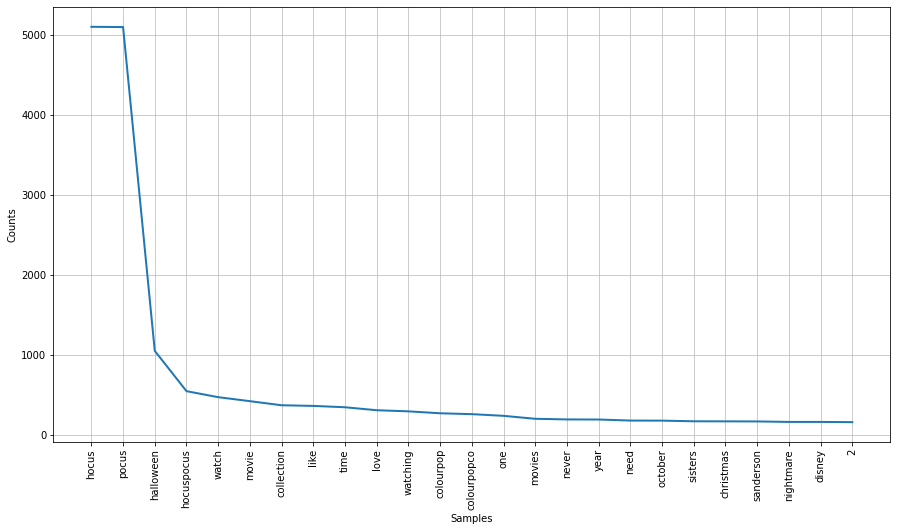

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [108]:
#line plot
fig, ax = plt.subplots(1,1, figsize=(15,8)) 
ax = fdist.plot(25, title="Most Common Words in Tweets About the Movie Hocus Pocus")

In [ ]:
# from fdist.most_common(25) seperate words and counts
hocuspocus_words = [x[0] for x in fdist.most_common(25)]
hocuspocus_counts = [x[1] for x in fdist.most_common(25)]

In [ ]:
fig, ax = plt.subplots(1,1, figsize=(15,8))

# matplotlib bar plot
ax.bar(hocuspocus_words, hocuspocus_counts, color=cm.viridis_r(np.linspace(.4,.8, 30)))
plt.xticks(rotation=90)
plt.xlabel('Words', fontsize = 17)
plt.ylabel('Frequency of Word', fontsize = 17)
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.title('Popular Words in Hocus Pocus Tweets', fontsize = 20)

plt.tight_layout(pad=0) #necessary - if not included extra text shows up

# plt.savefig('images/barhocuspocus.png')

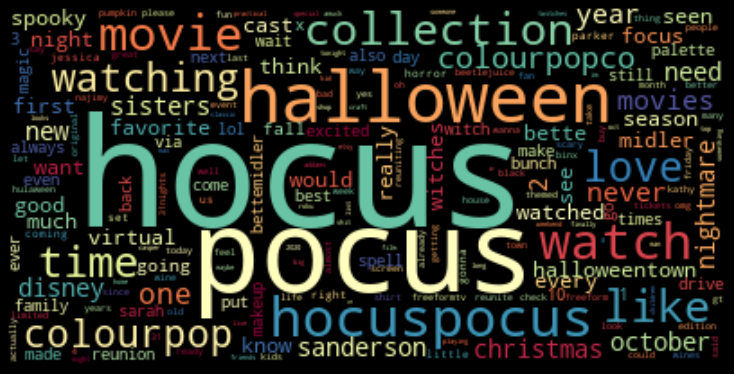

In [109]:
# Create the word cloud:

wordcloud = WordCloud(colormap='Spectral').generate_from_frequencies(fdist)

# Display matplotlib image:

plt.figure(figsize=(10,10), facecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad=0)

# Uncomment the next line if you want to save your image:
# plt.savefig('images/cloudhocuspocus.png')